# Overview (Male Donor)
*  The framework policy is any sample size $10 \ge n \lt 30$, use survival similarity and clinical meaning if possible. For any $n \lt 10$, create the Other_rare category since tiny groups are unstable and likely to overfit noise

In [1]:
# path to user functions
import sys  
sys.path.append('../Src/')

import pandas as pd
import pickle
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import sys

from scipy import stats
from importlib.metadata import version

# set seaborn theme
sns.set_theme()

# python modules
import utilities as u
import plot
import ranker

# initializing variables
SEED = 1776

# Create a dictionary of versions
versions = {
    "Python": sys.version.split()[0],
    "Pandas": pd.__version__,
    "NumPy": np.__version__,
    "Seaborn": sns.__version__,
    "Matplot": sys.modules['matplotlib'].__version__,
    # "Sk-Learn": sys.modules['sklearn'].__version__,
    "Scipy": sys.modules['scipy'].__version__,
}

# Display as a clean DataFrame
df_versions = pd.DataFrame(list(versions.items()), columns=['Library', 'Version'])
print(df_versions)

# adjust pandas display options to max
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
# adjust pandas display options to ensure full display of content
pd.set_option('display.max_colwidth', None)

   Library  Version
0   Python  3.11.13
1   Pandas    3.0.2
2    NumPy    2.3.2
3  Seaborn   0.13.2
4  Matplot   3.10.5
5    Scipy   1.16.1


## Import Data

In [2]:
# import data
df = pd.read_parquet("../Data/Donor_Male_Heart.parquet")
# display shape
df.shape

(21366, 115)

## Male

In [3]:
# display info
df.info(max_cols=df.shape[1])

<class 'pandas.DataFrame'>
RangeIndex: 21366 entries, 0 to 21365
Data columns (total 115 columns):
 #    Column                                Non-Null Count  Dtype   
---   ------                                --------------  -----   
 0    DeceasedRetyped_DON                   21366 non-null  category
 1    AntigenDA1_DON                        21366 non-null  category
 2    AntigenDA2_DON                        21366 non-null  category
 3    AntigenDB1_DON                        21366 non-null  category
 4    AntigenDB2_DON                        21366 non-null  category
 5    AntigenDDR1_DON                       21366 non-null  category
 6    AntigenDDR2_DON                       21366 non-null  category
 7    Citizenship_DON                       21366 non-null  category
 8    PastCocaineUse_DON                    21366 non-null  category
 9    Age_DON                               21366 non-null  int64   
 10   Ethnicity_DON                         21366 non-null  category
 11 

In [4]:
# Empty DataFrame # list for record keeping
mapping_df = pd.DataFrame(columns=['feature', 'consolidate', 'type', 'gender'])
gender_value = 'Male'
type_value = 'DON'
remove_cols = []

| Feature                     | Bonferroni        | Holm‑Bonferroni   | FDR (Benjamini–Hochberg) |
|-----------------------------|-------------------|-------------------|---------------------------|
| **Strictness**              | Highest           | High              | Lowest                    |
| **Statistical Power**       | Lowest            | Moderate          | Highest                   |
| **Primary Risk**            | Type II Error     | Type II Error     | Type I Error              |
| **Best Use Case**           | 2–5 comparisons; scientific “proof” | General use; balanced control | Feature engineering; large category sets |


| Error Type     | Meaning                                      | Risk in Medical Modeling                        | Caused By                          |
|----------------|----------------------------------------------|--------------------------------------------------|------------------------------------|
| **Type I**     | False positive (detecting a difference that isn't real) | Over-splitting, spurious risk groups, misleading clinical interpretation | Too lenient alpha, weak correction |
| **Type II**    | False negative (missing a real difference)    | Collapsing meaningful categories, losing signal, underestimating risk     | Low power, strict correction, small effects |



#### DeceasedRetyped
* Deceased donors often have their Human Leukocyte Antigen (HLA) typing repeated (retyped) by recipient centers to ensure accuracy before transplantation.

In [5]:
# info
feature = u.get_feature_info(df, 'DeceasedRetyped_DON', cat=False)
# dtype
df[feature].apply(lambda s: repr(s.dtype))

                     count unique  top   freq
DeceasedRetyped_DON  21366      3  Yes  12593

:::: NaN Count:
DeceasedRetyped_DON    0 



DeceasedRetyped_DON    CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)
dtype: str

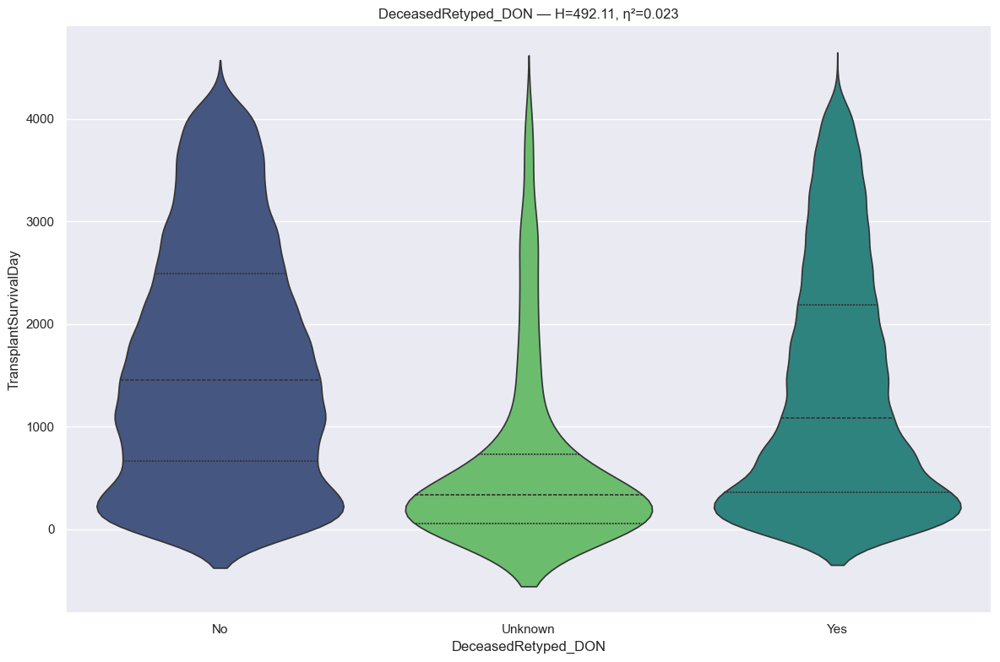

RANKING REPORT: DeceasedRetyped_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   8414 records
 * Unknown                                           :    359 records
 * Yes                                               :  12593 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 492.1129 | P-value: 1.377318e-107 | Effect η²: 0.0229
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.8188e-64 | thr=0.0167 | r=-0.528 | *Sig*
No           vs Yes          | p=1.2610e-60 | thr=0.0167 | r=-0.134 | *Sig*
Unknown      vs Yes          | p=5.6378e-41 | thr=0.0167 | r= 0.414 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_

In [6]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [7]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DA1
* Donor-Specific Antibodies (DSAs) targeting Human Leukocyte Antigens (HLA) are the primary immunological threat in heart transplantation, often causing antibody-mediated rejection (AMR) and long-term coronary artery vasculopathy. They are detected using Luminex single-antigen bead (SAB) assays, which measure antibody strength (MFI) against donor antigens.

In [8]:
# info
feature = u.get_feature_info(df, 'AntigenDA1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenDA1_DON  21366     39   2  8489

:::: NaN Count:
AntigenDA1_DON    0 



{'AntigenDA1_DON': CategoricalDtype(categories=['01:01', '01:02', '02:01', '02:02', '02:03', '02:05',
                   '02:06', '03:01', '03:02', '1', '10', '11', '11:01', '2',
                   '23', '24', '24:02', '24:03', '25', '26', '26:01', '28',
                   '29', '29:02', '3', '30', '30:01', '31', '32', '33', '33:03',
                   '34', '34:02', '36', '66', '66:01', '68', '68:02', '69',
                   '74', 'Unknown'],
 , ordered=False, categories_dtype=str)}

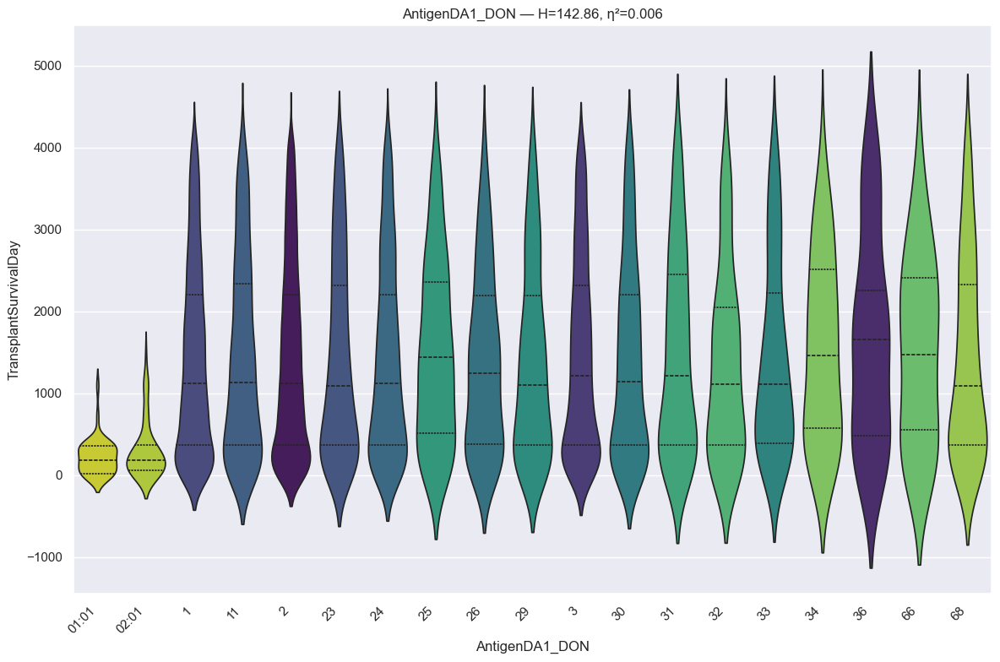

RANKING REPORT: AntigenDA1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:01                                             :     41 records
 * 02:01                                             :     64 records
 * 1                                                 :   4761 records
 * 11                                                :    929 records
 * 2                                                 :   8489 records
 * 23                                                :    791 records
 * 24                                                :   1280 records
 * 25                                                :    170 records
 * 26                                                :    260 records
 * 29                                                :    372 records
 * 3                                                 :   2642 records
 * 30                                                :    602 records
 * 31                                                :    204 records
 * 32                        

In [9]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [10]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDA1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:01                                             :     41 records
 * 02:01                                             :     64 records
 * 1                                                 :   4761 records
 * 11                                                :    929 records
 * 2                                                 :   8489 records
 * 23                                                :    791 records
 * 24                                                :   1280 records
 * 25                                                :    170 records
 * 26                                                :    260 records
 * 29                                                :    372 records
 * 3                                                 :   2642 records
 * 30                                                :    602 records
 * 31                                                :    204 records
 * 32                        

In [11]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### AntigenDA2
* Donor-specific antibodies (DSA) directed against HLA class II antigens—specifically HLA-DQ—are a major concern in heart transplantation, often leading to poorer outcomes, increased antibody-mediated rejection (AMR), and cardiac allograft vasculopathy (CAV). These antibodies can be pre-existing or develop de novo (dnDSA) after transplantation. 

In [12]:
# info
feature = u.get_feature_info(df, 'AntigenDA2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenDA2_DON  21366     46  68  2457

:::: NaN Count:
AntigenDA2_DON    0 



{'AntigenDA2_DON': CategoricalDtype(categories=['01:01', '02:01', '02:03', '02:05', '02:06', '03:01', '1',
                   '10', '11', '11:01', '2', '23', '24', '24:02', '24:03', '25',
                   '26', '26:01', '28', '29', '29:01', '29:02', '3', '30',
                   '30:01', '30:02', '31', '32', '33', '33:01', '33:03', '34',
                   '34:02', '36', '43', '66', '66:01', '66:02', '68', '68:01',
                   '68:02', '69', '74', '80', 'No Antigen',
                   'No second antigen detected', 'Unknown'],
 , ordered=False, categories_dtype=str)}

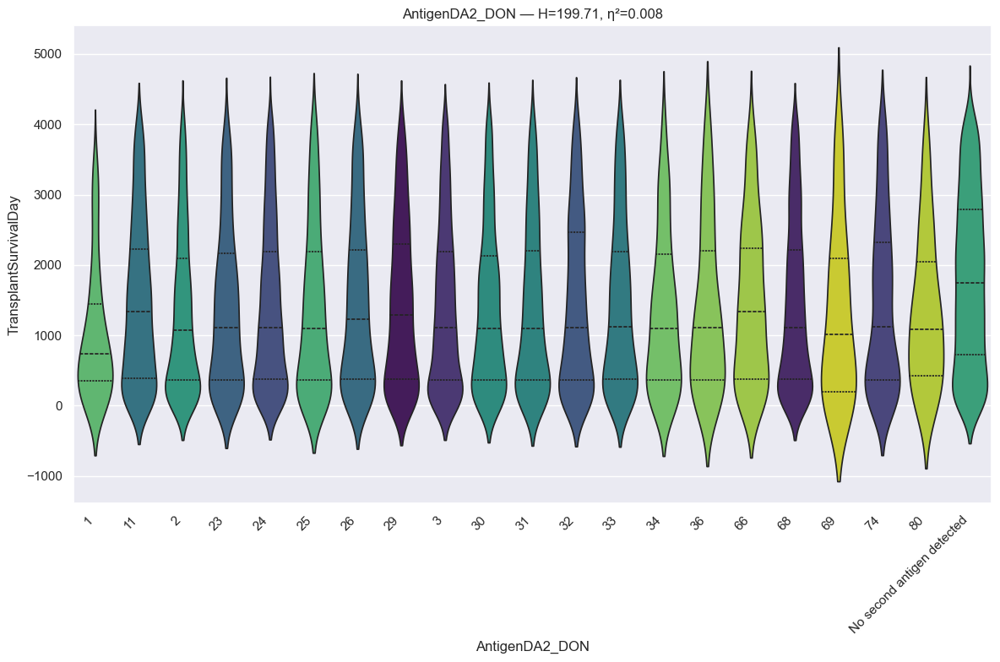

RANKING REPORT: AntigenDA2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :    124 records
 * 11                                                :   1270 records
 * 2                                                 :   2019 records
 * 23                                                :    693 records
 * 24                                                :   2341 records
 * 25                                                :    499 records
 * 26                                                :    757 records
 * 29                                                :   1111 records
 * 3                                                 :   2213 records
 * 30                                                :   1390 records
 * 31                                                :   1091 records
 * 32                                                :   1109 records
 * 33                                                :    943 records
 * 34                        

In [13]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [14]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDA2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :    124 records
 * 11                                                :   1270 records
 * 2                                                 :   2019 records
 * 23                                                :    693 records
 * 24                                                :   2341 records
 * 25                                                :    499 records
 * 26                                                :    757 records
 * 29                                                :   1111 records
 * 3                                                 :   2213 records
 * 30                                                :   1390 records
 * 31                                                :   1091 records
 * 32                                                :   1109 records
 * 33                                                :    943 records
 * 34                        

In [15]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDA2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :    124 records
 * 11                                                :   1270 records
 * 2                                                 :   2019 records
 * 23                                                :    693 records
 * 24                                                :   2341 records
 * 25                                                :    499 records
 * 26                                                :    757 records
 * 29                                                :   1111 records
 * 3                                                 :   2213 records
 * 30                                                :   1390 records
 * 31                                                :   1091 records
 * 32                                                :   1109 records
 * 33                                                :    943 records
 * 34                        

In [16]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

####  Antigen DB1
* Human Leukocyte Antigen (HLA) class I and II antibodies are critical factors in heart transplantation, serving as primary targets for immune-mediated rejection. Sensitization, caused by prior transplants, blood transfusions, or pregnancy, leads to donor-specific antibodies (DSAs). Identifying these antigens using Luminex solid-phase assays (mean fluorescent intensity, or MFI) is crucial for predicting antibody-mediated rejection (AMR) and managing high-risk candidates.

In [17]:
# info
feature = u.get_feature_info(df, 'AntigenDB1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenDB1_DON  21366     77   7  4253

:::: NaN Count:
AntigenDB1_DON    0 



{'AntigenDB1_DON': CategoricalDtype(categories=['07:02', '08:01', '13', '13:02', '14', '14:01', '14:02',
                   '15', '15:01', '15:03', '15:07', '15:10', '15:16', '15:17',
                   '15:18', '18', '27', '27:04', '27:05', '35', '35:01',
                   '35:02', '35:03', '35:08', '35:12', '37', '38', '38:01',
                   '39', '39:01', '39:02', '39:06', '40', '40:01', '40:02',
                   '40:05', '40:06', '41', '41:02', '42', '42:01', '42:02',
                   '44', '44:02', '44:03', '45', '46', '47', '48', '49', '50',
                   '50:01', '51', '51:01', '51:02', '52', '53', '54', '55',
                   '55:01', '56', '56:03', '57', '58', '59', '60', '61', '62',
                   '63', '64', '65', '7', '70', '703', '71', '72', '75', '76',
                   '77', '78', '8', '81', '82', 'Unknown'],
 , ordered=False, categories_dtype=str)}

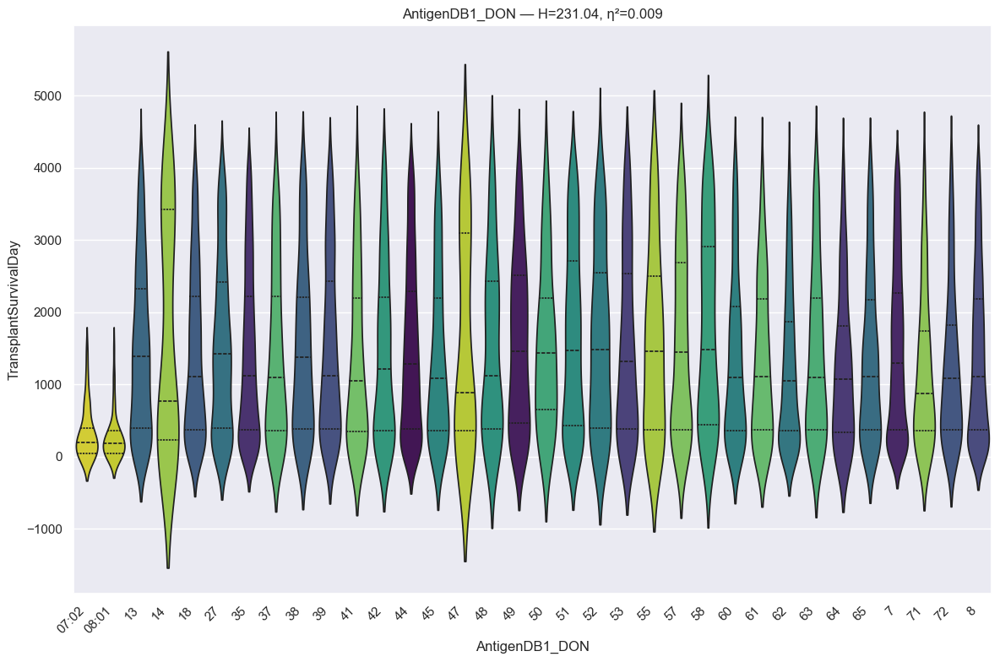

RANKING REPORT: AntigenDB1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 07:02                                             :     54 records
 * 08:01                                             :     47 records
 * 13                                                :    655 records
 * 14                                                :     34 records
 * 18                                                :   1164 records
 * 27                                                :    889 records
 * 35                                                :   2579 records
 * 37                                                :    261 records
 * 38                                                :    333 records
 * 39                                                :    623 records
 * 41                                                :    184 records
 * 42                                                :    297 records
 * 44                                                :   1903 records
 * 45                        

In [18]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [19]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDB1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 07:02                                             :     54 records
 * 08:01                                             :     47 records
 * 13                                                :    655 records
 * 14                                                :     34 records
 * 18                                                :   1164 records
 * 27                                                :    889 records
 * 35                                                :   2579 records
 * 37                                                :    261 records
 * 38                                                :    333 records
 * 39                                                :    623 records
 * 41                                                :    184 records
 * 42                                                :    297 records
 * 44                                                :   1903 records
 * 45                        

In [20]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDB1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 07:02                                             :     54 records
 * 08:01                                             :     47 records
 * 13                                                :    655 records
 * 14                                                :     34 records
 * 18                                                :   1164 records
 * 27                                                :    889 records
 * 35                                                :   2579 records
 * 37                                                :    261 records
 * 38                                                :    333 records
 * 39                                                :    623 records
 * 41                                                :    184 records
 * 42                                                :    297 records
 * 44                                                :   1903 records
 * 45                        

In [21]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DB2
* The presence of pre-existing antibodies (sensitization) against Human Leukocyte Antigens (HLA) poses a major challenge in heart transplantation, as these antibodies can lead to antibody-mediated rejection (AMR) and donor-specific antibodies (DSA). The "Antigen DB 2" likely refers to the management of HLA class II antibodies (like HLA-DR), which are critical to evaluate, particularly in high-risk patients.

In [22]:
# info
feature = u.get_feature_info(df, 'AntigenDB2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenDB2_DON  21366     86  44  2974

:::: NaN Count:
AntigenDB2_DON    0 



{'AntigenDB2_DON': CategoricalDtype(categories=['07:02', '08:01', '12', '13', '13:02', '14', '14:01',
                   '14:02', '15', '15:01', '15:10', '15:16', '15:17', '17',
                   '18', '22', '27', '27:05', '27:08', '35', '35:01', '35:02',
                   '35:03', '35:08', '35:12', '37', '38', '38:01', '39',
                   '39:01', '39:02', '39:05', '39:06', '40', '40:01', '40:02',
                   '40:05', '41', '41:01', '41:02', '42', '42:01', '42:02',
                   '44', '44:02', '44:03', '45', '46', '47', '48', '48:01',
                   '49', '50', '50:01', '51', '51:01', '51:02', '52', '53',
                   '54', '55', '55:01', '56', '56:01', '57', '57:01', '57:03',
                   '58', '59', '60', '61', '62', '63', '64', '65', '67', '7',
                   '70', '71', '72', '73', '75', '76', '77', '78', '8', '81',
                   '82', '82:01', 'No second antigen detected', 'Unknown'],
 , ordered=False, categories_dtype=str)}

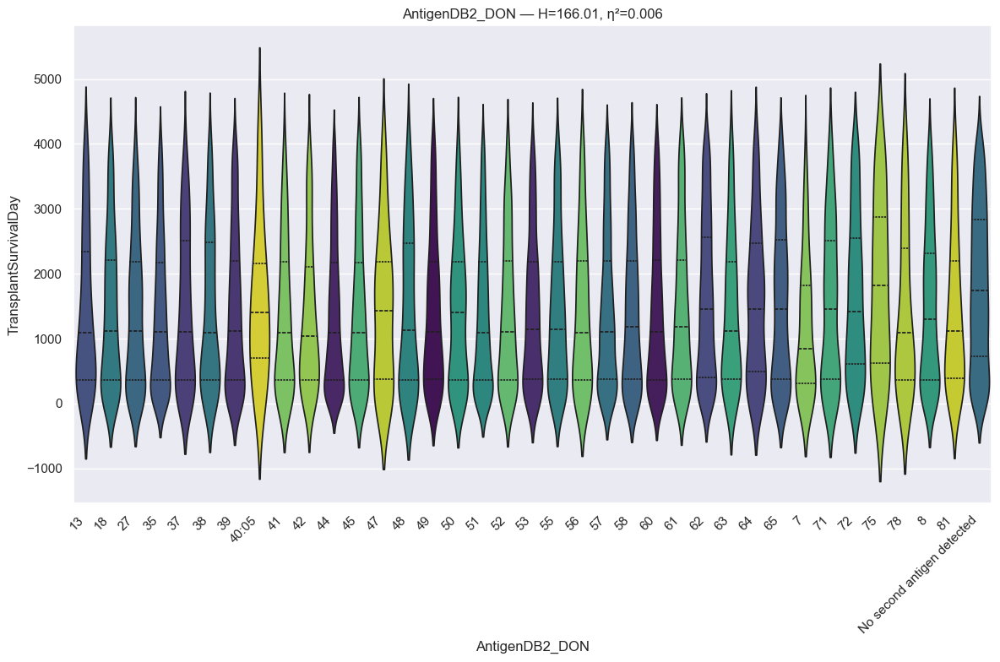

RANKING REPORT: AntigenDB2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    172 records
 * 18                                                :    502 records
 * 27                                                :    467 records
 * 35                                                :   1458 records
 * 37                                                :    254 records
 * 38                                                :    297 records
 * 39                                                :    675 records
 * 40:05                                             :     31 records
 * 41                                                :    241 records
 * 42                                                :    228 records
 * 44                                                :   2974 records
 * 45                                                :    454 records
 * 47                                                :     66 records
 * 48                        

In [23]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [24]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDB2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    172 records
 * 18                                                :    502 records
 * 27                                                :    467 records
 * 35                                                :   1458 records
 * 37                                                :    254 records
 * 38                                                :    297 records
 * 39                                                :    675 records
 * 40:05                                             :     31 records
 * 41                                                :    241 records
 * 42                                                :    228 records
 * 44                                                :   2974 records
 * 45                                                :    454 records
 * 47                                                :     66 records
 * 48                        

In [25]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR1
* HLA-DR antigen matching is crucial in heart transplantation, as mismatches (particularly HLA-DRB1) are associated with increased risk of mortality, antibody-mediated rejection, and chronic cardiac allograft vasculopathy. Minimizing HLA-DR mismatches improves survival and reduces the incidence of rejection episodes.

In [26]:
# info
feature = u.get_feature_info(df, 'AntigenDDR1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
AntigenDDR1_DON  21366     43   4  5363

:::: NaN Count:
AntigenDDR1_DON    0 



{'AntigenDDR1_DON': CategoricalDtype(categories=['01:01', '01:02', '01:03', '03:01', '03:02', '04:01',
                   '04:02', '04:03', '04:04', '04:05', '04:07', '04:11',
                   '08:01', '08:02', '09:01', '1', '10', '103', '11', '11:01',
                   '11:03', '11:04', '12', '12:01', '13', '13:01', '13:02',
                   '13:03', '13:05', '14', '14:02', '14:04', '14:54', '15',
                   '15:01', '16', '17', '18', '3', '4', '7', '8', '9',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

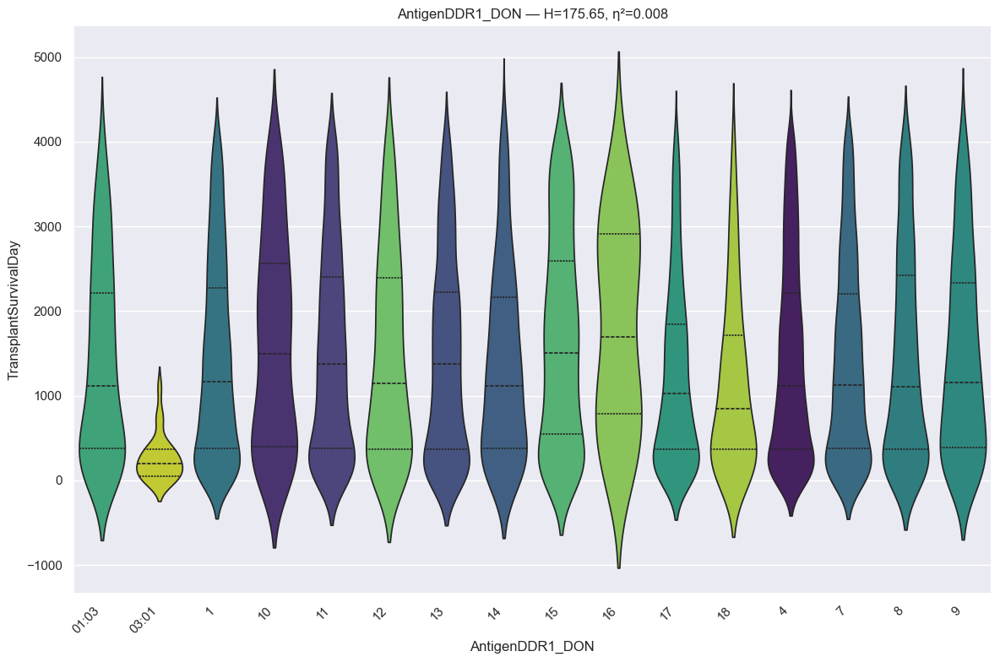

RANKING REPORT: AntigenDDR1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:03                                             :    361 records
 * 03:01                                             :     48 records
 * 1                                                 :   3386 records
 * 10                                                :    265 records
 * 11                                                :   1730 records
 * 12                                                :    335 records
 * 13                                                :   1564 records
 * 14                                                :    361 records
 * 15                                                :    834 records
 * 16                                                :     63 records
 * 17                                                :   2007 records
 * 18                                                :    266 records
 * 4                                                 :   5363 records
 * 7                        

In [27]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [28]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDDR1_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:03                                             :    361 records
 * 03:01                                             :     48 records
 * 1                                                 :   3386 records
 * 10                                                :    265 records
 * 11                                                :   1730 records
 * 12                                                :    335 records
 * 13                                                :   1564 records
 * 14                                                :    361 records
 * 15                                                :    834 records
 * 16                                                :     63 records
 * 17                                                :   2007 records
 * 18                                                :    266 records
 * 4                                                 :   5363 records
 * 7                        

In [29]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR2
* HLA-DR2 (a component of HLA class II) antigen status can influence heart transplant outcomes by acting as a marker for sensitization or increased immune reactivity, potentially leading to poorer graft survival, particularly if mismatched. While HLA-DQ is often cited as a more critical target for chronic rejection, DR mismatches are associated with increased cardiac allograft vasculopathy (CAV). 

In [30]:
# info
feature = u.get_feature_info(df, 'AntigenDDR2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
AntigenDDR2_DON  21366     44  15  4452

:::: NaN Count:
AntigenDDR2_DON    0 



{'AntigenDDR2_DON': CategoricalDtype(categories=['01:01', '01:03', '03:01', '04:01', '04:04', '04:05',
                   '04:07', '08:01', '08:02', '09:01', '1', '10', '103', '11',
                   '11:01', '11:03', '11:04', '12', '12:01', '12:02', '13',
                   '13:01', '13:02', '13:03', '13:05', '14', '14:01', '14:02',
                   '14:04', '14:06', '14:54', '15', '15:01', '15:02', '15:03',
                   '16', '16:01', '16:02', '17', '18', '3', '4', '5', '7', '8',
                   '9', 'No second antigen detected', 'Unknown'],
 , ordered=False, categories_dtype=str)}

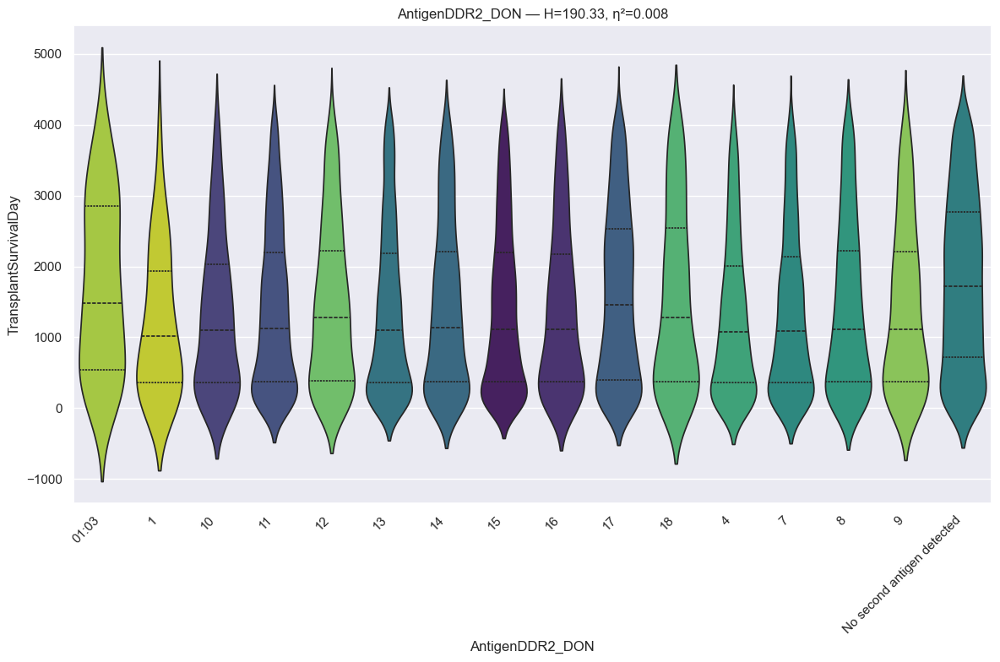

RANKING REPORT: AntigenDDR2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:03                                             :     64 records
 * 1                                                 :     67 records
 * 10                                                :    248 records
 * 11                                                :   2127 records
 * 12                                                :    568 records
 * 13                                                :   3347 records
 * 14                                                :   1225 records
 * 15                                                :   4452 records
 * 16                                                :    757 records
 * 17                                                :   1976 records
 * 18                                                :    328 records
 * 4                                                 :   1432 records
 * 7                                                 :   1813 records
 * 8                        

In [31]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [32]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDDR2_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 01:03                                             :     64 records
 * 1                                                 :     67 records
 * 10                                                :    248 records
 * 11                                                :   2127 records
 * 12                                                :    568 records
 * 13                                                :   3347 records
 * 14                                                :   1225 records
 * 15                                                :   4452 records
 * 16                                                :    757 records
 * 17                                                :   1976 records
 * 18                                                :    328 records
 * 4                                                 :   1432 records
 * 7                                                 :   1813 records
 * 8                        

In [33]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Citizenship

In [34]:
# info
feature = u.get_feature_info(df, 'Citizenship', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique         top   freq
Citizenship_DON  21366      6  US Citizen  19330

:::: NaN Count:
Citizenship_DON    0 



{'Citizenship_DON': CategoricalDtype(categories=['NON-RESIDENT ALIEN',
                   'Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant',
                   'Non-US Citizen/US Resident', 'RESIDENT ALIEN', 'US Citizen',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

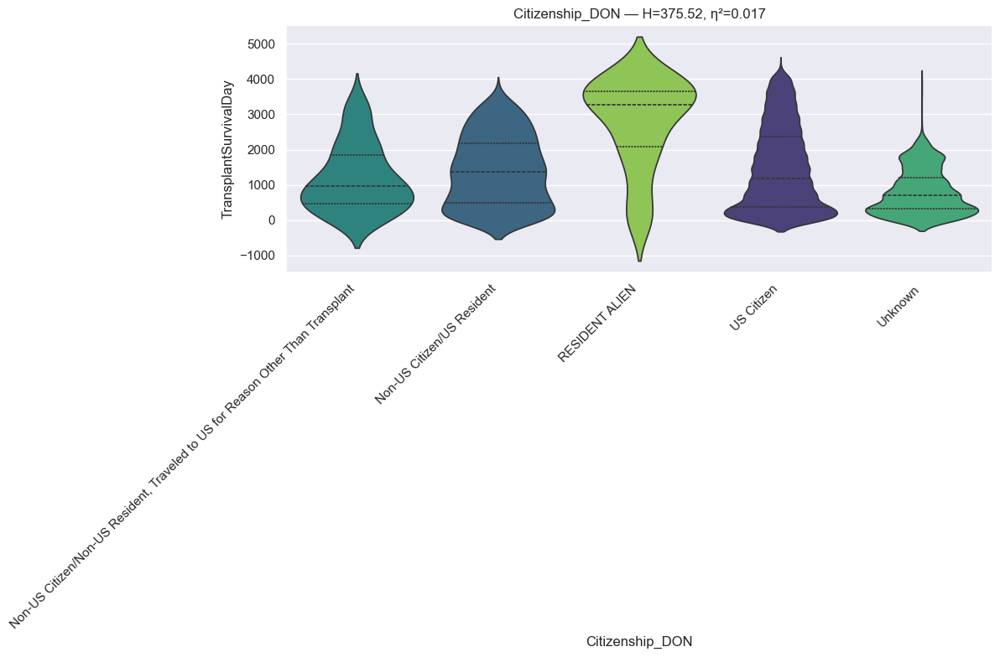

RANKING REPORT: Citizenship_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     74 records
 * Non-US Citizen/US Resident                        :    668 records
 * RESIDENT ALIEN                                    :     50 records
 * US Citizen                                        :  19330 records
 * Unknown                                           :   1227 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :     17 records
--------------------------------------------------------------------------------
Kruskal H: 375.5206 | P-value: 5.403076e-80 | Effect η²: 0.0174
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
US Citizen   vs Unknown      | p=5.2603e-73 | thr=0.0050 | r=-0.307 | *Sig*
Non-US Citizen/US Resident vs Unknown      | p=1.4187e-33 | 

In [35]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [36]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Citizenship_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     74 records
 * Non-US Citizen/US Resident                        :    668 records
 * RESIDENT ALIEN                                    :     50 records
 * US Citizen                                        :  19330 records
 * Unknown                                           :   1227 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :     17 records
--------------------------------------------------------------------------------
Kruskal H: 375.5206 | P-value: 5.403076e-80 | Effect η²: 0.0174
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED

In [37]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Past Cocaine Use

In [38]:
# info
feature = u.get_feature_info(df, 'PastCocaineUse_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique top   freq
PastCocaineUse_DON  21366      3  No  16058

:::: NaN Count:
PastCocaineUse_DON    0 



{'PastCocaineUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

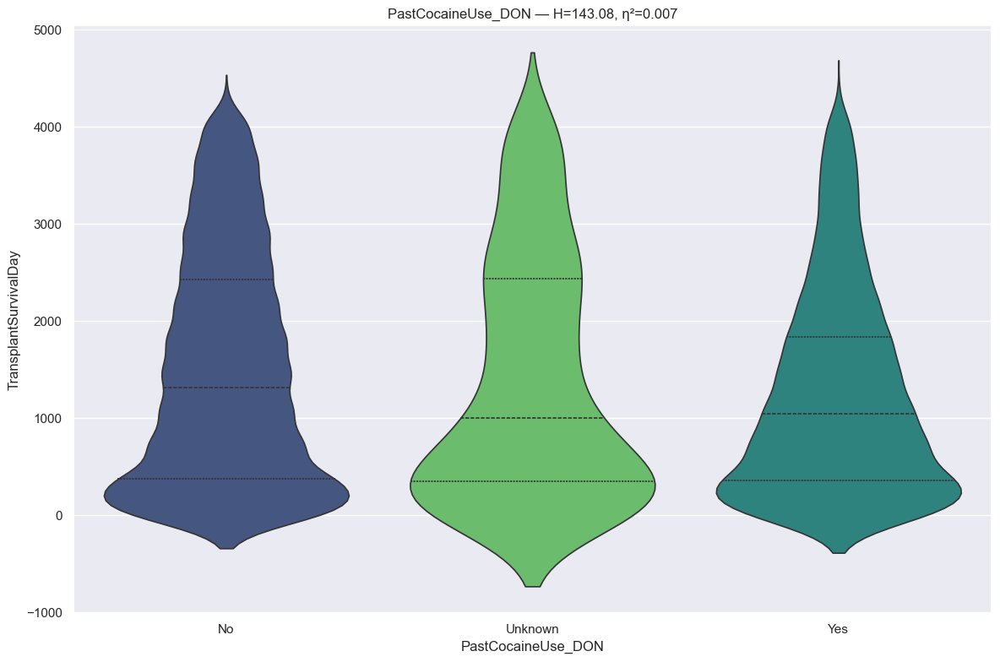

RANKING REPORT: PastCocaineUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  16058 records
 * Unknown                                           :    457 records
 * Yes                                               :   4851 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 143.0837 | P-value: 8.506861e-32 | Effect η²: 0.0066
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.8499e-32 | thr=0.0167 | r=-0.111 | *Sig*
No           vs Unknown      | p=2.1685e-03 | thr=0.0167 | r=-0.084 | *Sig*
Unknown      vs Yes          | p=6.9201e-01 | thr=0.0167 | r=-0.011 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_

In [39]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [40]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PastCocaineUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  16058 records
 * Unknown                                           :    457 records
 * Yes                                               :   4851 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 143.0837 | P-value: 8.506861e-32 | Effect η²: 0.0066
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (2 categories)
  - Unknown
  - Yes



In [41]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ethnicity

In [42]:
# info
feature = u.get_feature_info(df, 'Ethnicity', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique                  top   freq
Ethnicity_DON  21366      7  White, Non-Hispanic  13262

:::: NaN Count:
Ethnicity_DON    0 



{'Ethnicity_DON': CategoricalDtype(categories=['Amer Ind/Alaska Native', 'Asian', 'Black', 'Hispanic',
                   'Multiracial', 'Native Hawaiian/other Pacific Islander',
                   'White, Non-Hispanic'],
 , ordered=False, categories_dtype=str)}

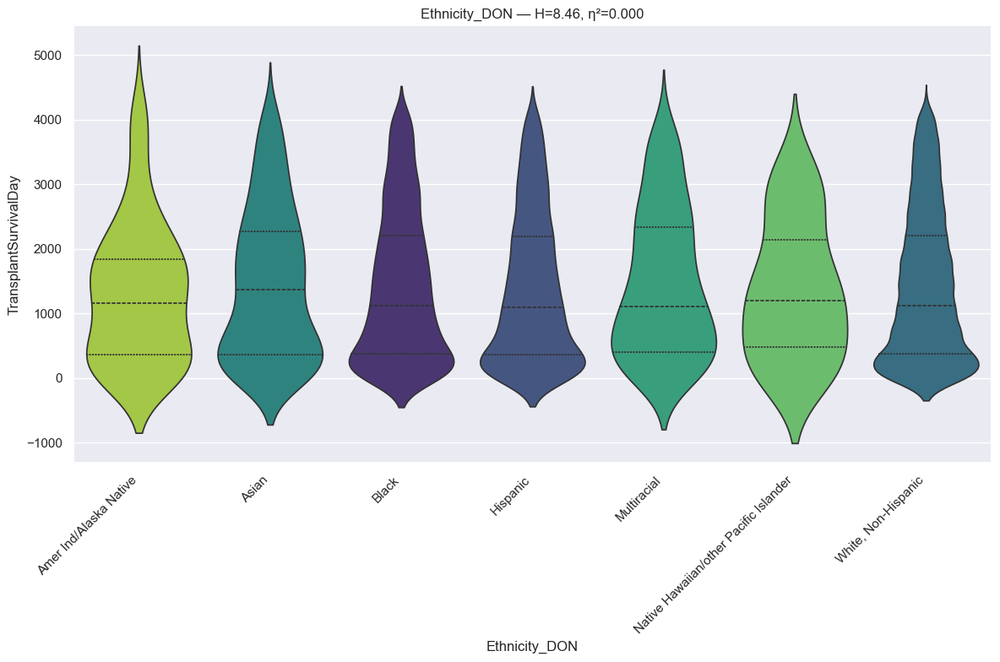

RANKING REPORT: Ethnicity_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Amer Ind/Alaska Native                            :    110 records
 * Asian                                             :    345 records
 * Black                                             :   3567 records
 * Hispanic                                          :   3863 records
 * Multiracial                                       :    181 records
 * Native Hawaiian/other Pacific Islander            :     38 records
 * White, Non-Hispanic                               :  13262 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 8.4583 | P-value: 2.064106e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Hispanic     vs White, Non-Hispanic | p=9.5857e-03 | thr=0.0024 | r= 0.027 | Not Sig
Black        vs Hispa

In [43]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [44]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Hepatitis B Core Antibody
* A positive Hepatitis B core antibody (HBcAb or anti-HBc) test indicates exposure to the hepatitis B virus (HBV), either from a current or past infection. Unlike surface antibodies, it does not provide immunity. It is a critical marker for diagnosing acute, chronic, or resolved hepatitis B. 

In [45]:
# info
feature = u.get_feature_info(df, 'Hepatitis_B_CoreAntibody', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique       top   freq
Hepatitis_B_CoreAntibody_DON  21366      5  Negative  20931

:::: NaN Count:
Hepatitis_B_CoreAntibody_DON    0 



{'Hepatitis_B_CoreAntibody_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Pending',
                   'Positive'],
 , ordered=False, categories_dtype=str)}

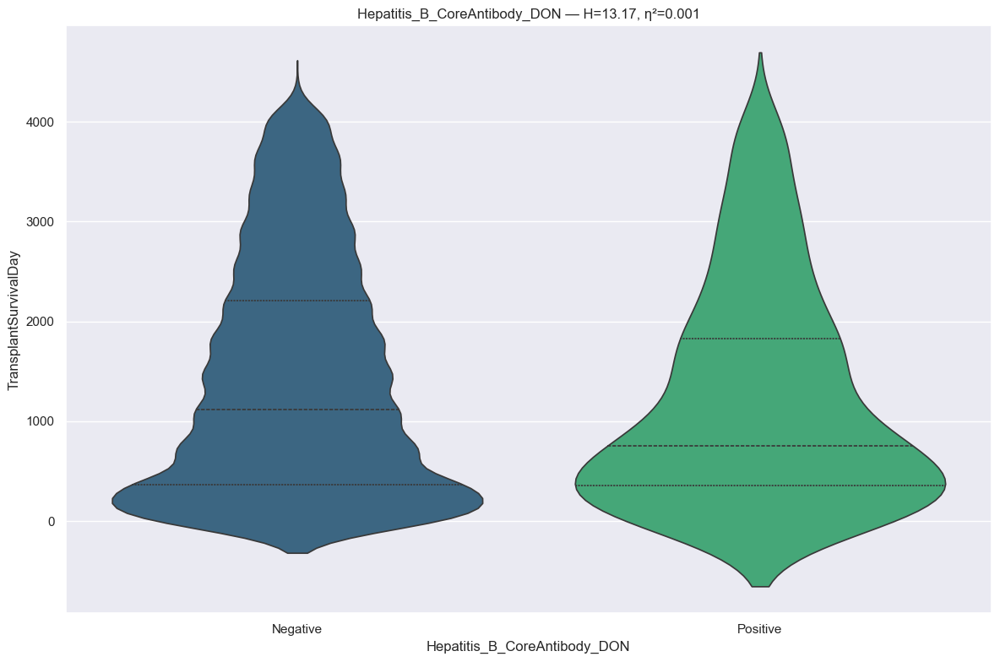

RANKING REPORT: Hepatitis_B_CoreAntibody_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  20931 records
 * Positive                                          :    422 records
BYPASSED CATEGORIES (n < min_n):
 * Indeterminate                                     :      1 records
 * Not Done                                          :     11 records
 * Pending                                           :      1 records
--------------------------------------------------------------------------------
Kruskal H: 13.1715 | P-value: 2.842330e-04 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Positive     | p=2.8424e-04 | thr=0.0500 | r=-0.103 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Grou

In [46]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [47]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Surface Antigen HEP B
* Hepatitis B surface antigen (HBsAg) is a protein on the surface of the hepatitis B virus (HBV) used to detect active infections. A positive or "reactive" result indicates acute or chronic HBV infection, meaning the person is infectious. It appears 6-16 weeks after exposure; persistence beyond 6 months indicates chronic infection.

In [48]:
# info
feature = u.get_feature_info(df, 'SurfaceAntigenHEP_B', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique       top   freq
SurfaceAntigenHEP_B_DON  21366      5  Negative  21327

:::: NaN Count:
SurfaceAntigenHEP_B_DON    0 



{'SurfaceAntigenHEP_B_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Positive',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

In [49]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for SurfaceAntigenHEP_B_DON
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

SurfaceAntigenHEP_B_DON  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
               Negative         1430.752005                1117.0                 4300.0                    0.0         21327
               Positive          801.500000                 740.0                 2191.0                    8.0            14
                Unknown         1535.083333                1451.0                 3940.0                  184.0            12
               Not Done         1584.636364                1459.0                 2899.0                  361.0            11
          Indeterminate         2717.500000                27

In [50]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** Unable to determine statistical significance due to small sample size, removing this feature is reasonable due to its extreme sparsity and imbalance.

#### Blood Group

In [51]:
# info
feature = u.get_feature_info(df, 'BloodGroup_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top   freq
BloodGroup_DON  21366      8   O  10715

:::: NaN Count:
BloodGroup_DON    0 



{'BloodGroup_DON': CategoricalDtype(categories=['A', 'A1', 'A1B', 'A2', 'A2B', 'AB', 'B', 'O'], ordered=False, categories_dtype=str)}

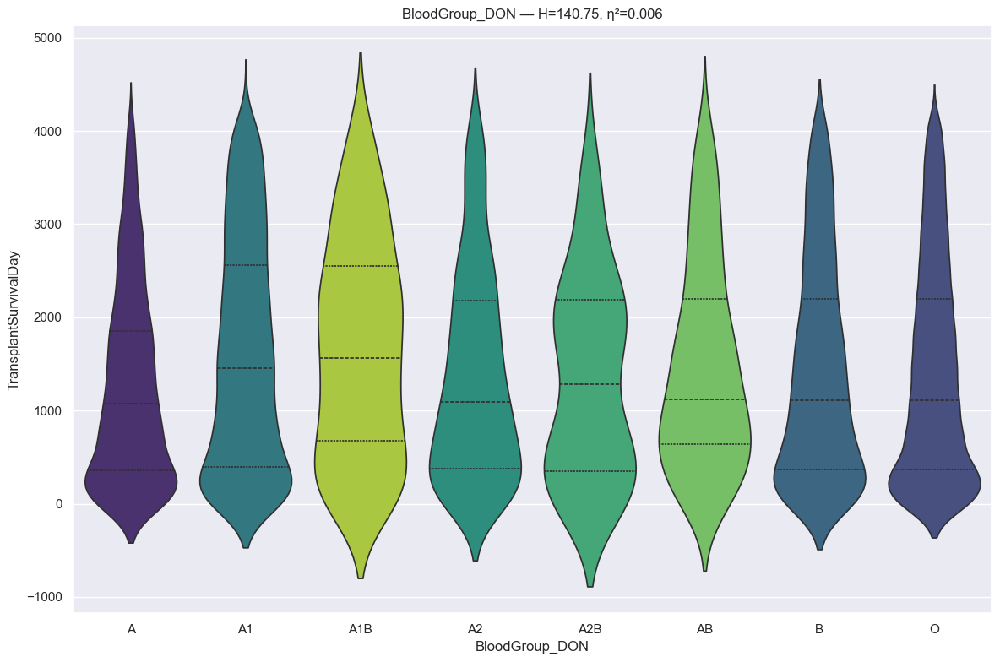

RANKING REPORT: BloodGroup_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * A                                                 :   3151 records
 * A1                                                :   3856 records
 * A1B                                               :    212 records
 * A2                                                :    646 records
 * A2B                                               :     78 records
 * AB                                                :    258 records
 * B                                                 :   2450 records
 * O                                                 :  10715 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 140.7492 | P-value: 3.541144e-27 | Effect η²: 0.0063
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0018 | r_threshold: 0.10)
--------------------------------------------------------------------------------
A            vs A1           | p=

In [52]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [53]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: BloodGroup_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * A                                                 :   3151 records
 * A1                                                :   3856 records
 * A1B                                               :    212 records
 * A2                                                :    646 records
 * A2B                                               :     78 records
 * AB                                                :    258 records
 * B                                                 :   2450 records
 * O                                                 :  10715 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 140.7492 | P-value: 3.541144e-27 | Effect η²: 0.0063
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppre

In [54]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Heavy Alcohol Use

In [55]:
# info
feature = u.get_feature_info(df, 'HeavyAlcoholUse_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique top   freq
HeavyAlcoholUse_DON  21366      3  No  16763

:::: NaN Count:
HeavyAlcoholUse_DON    0 



{'HeavyAlcoholUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

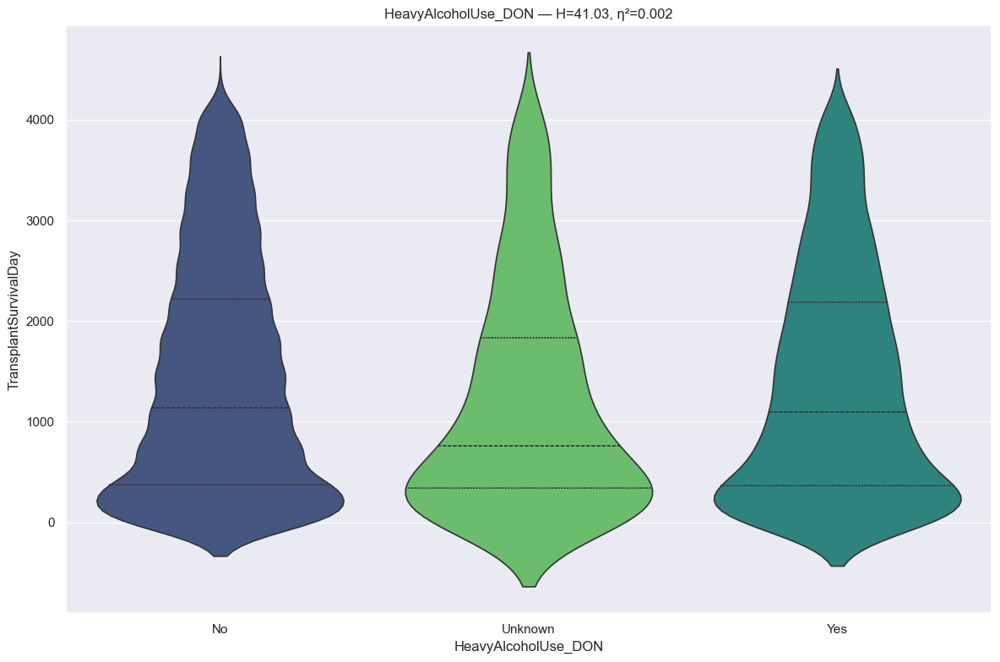

RANKING REPORT: HeavyAlcoholUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  16763 records
 * Unknown                                           :    550 records
 * Yes                                               :   4053 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 41.0346 | P-value: 1.228722e-09 | Effect η²: 0.0018
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=5.1104e-07 | thr=0.0167 | r=-0.126 | *Sig*
No           vs Yes          | p=1.3459e-05 | thr=0.0167 | r=-0.044 | *Sig*
Unknown      vs Yes          | p=1.6225e-03 | thr=0.0167 | r= 0.083 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 

In [56]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [57]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Deceased Or Living

In [58]:
# info
feature = u.get_feature_info(df, 'DeceasedOrLiving_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique             top   freq
DeceasedOrLiving_DON  21366      2  Deceased Donor  21364

:::: NaN Count:
DeceasedOrLiving_DON    0 



{'DeceasedOrLiving_DON': CategoricalDtype(categories=['Deceased Donor', 'Living Donor'], ordered=False, categories_dtype=str)}

In [59]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for DeceasedOrLiving_DON
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Deceased Donor

DeceasedOrLiving_DON  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
      Deceased Donor         1430.659895                1117.0                 4300.0                    0.0         21364
        Living Donor          769.000000                 769.0                 1435.0                  103.0             2


In [60]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** Unable to determine statistical significance due to small sample size, removing this feature is reasonable due to its extreme sparsity and imbalance.

#### Gender

In [61]:
# add to remove list
remove_cols.extend(['Gender_DON'])

#### Residency State

In [62]:
# info
feature = u.get_feature_info(df, 'ResidencyState', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique top  freq
ResidencyState_DON  21366     54  CA  2326

:::: NaN Count:
ResidencyState_DON    0 



{'ResidencyState_DON': CategoricalDtype(categories=['AK', 'AL', 'AR', 'AS', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE',
                   'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA',
                   'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND',
                   'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA',
                   'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'Unknown', 'VA',
                   'VT', 'WA', 'WI', 'WV', 'WY', 'ZZ'],
 , ordered=False, categories_dtype=str)}

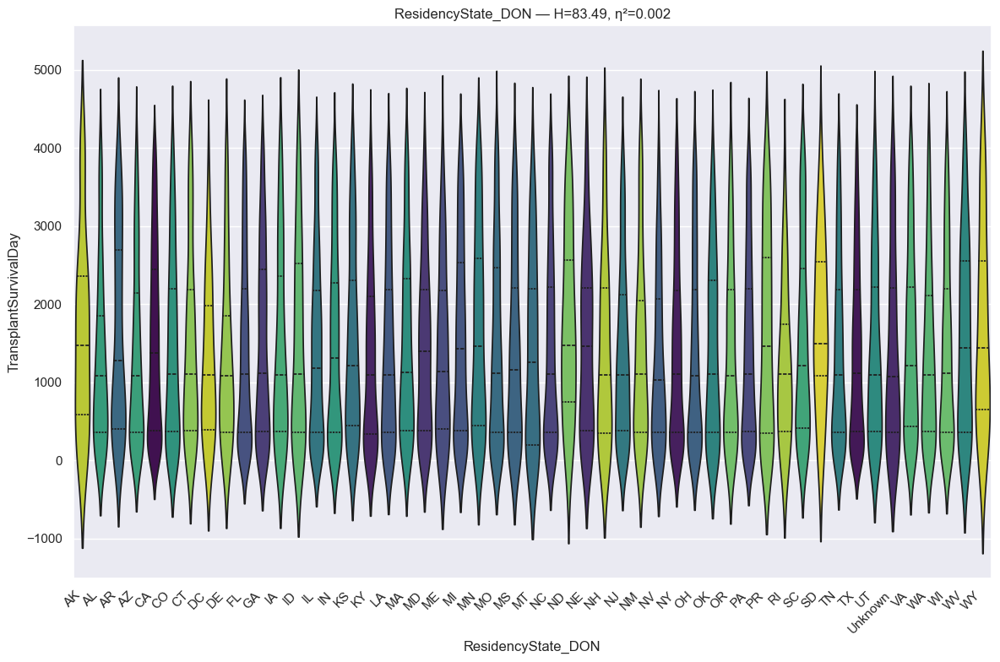

RANKING REPORT: ResidencyState_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * AK                                                :     52 records
 * AL                                                :    302 records
 * AR                                                :    224 records
 * AZ                                                :    510 records
 * CA                                                :   2326 records
 * CO                                                :    352 records
 * CT                                                :    212 records
 * DC                                                :     39 records
 * DE                                                :    104 records
 * FL                                                :   1366 records
 * GA                                                :    687 records
 * IA                                                :    167 records
 * ID                                                :    103 records
 * IL                    

In [63]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [64]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ResidencyState_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * AK                                                :     52 records
 * AL                                                :    302 records
 * AR                                                :    224 records
 * AZ                                                :    510 records
 * CA                                                :   2326 records
 * CO                                                :    352 records
 * CT                                                :    212 records
 * DC                                                :     39 records
 * DE                                                :    104 records
 * FL                                                :   1366 records
 * GA                                                :    687 records
 * IA                                                :    167 records
 * ID                                                :    103 records
 * IL                    

In [65]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Antibody HEP C
* Research shows that getting a kidney from a hepatitis C-positive donor does not lower a patient's or the kidney's survival for up to ten years after transplant. However, there may still be some risk, especially if the donor's virus type differs from the patients.'

In [66]:
# info
feature = u.get_feature_info(df, 'Antibody_HEP_C', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique       top   freq
Antibody_HEP_C_DON  21366      6  Negative  20404

:::: NaN Count:
Antibody_HEP_C_DON    0 



{'Antibody_HEP_C_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Pending',
                   'Positive', 'Unknown'],
 , ordered=False, categories_dtype=str)}

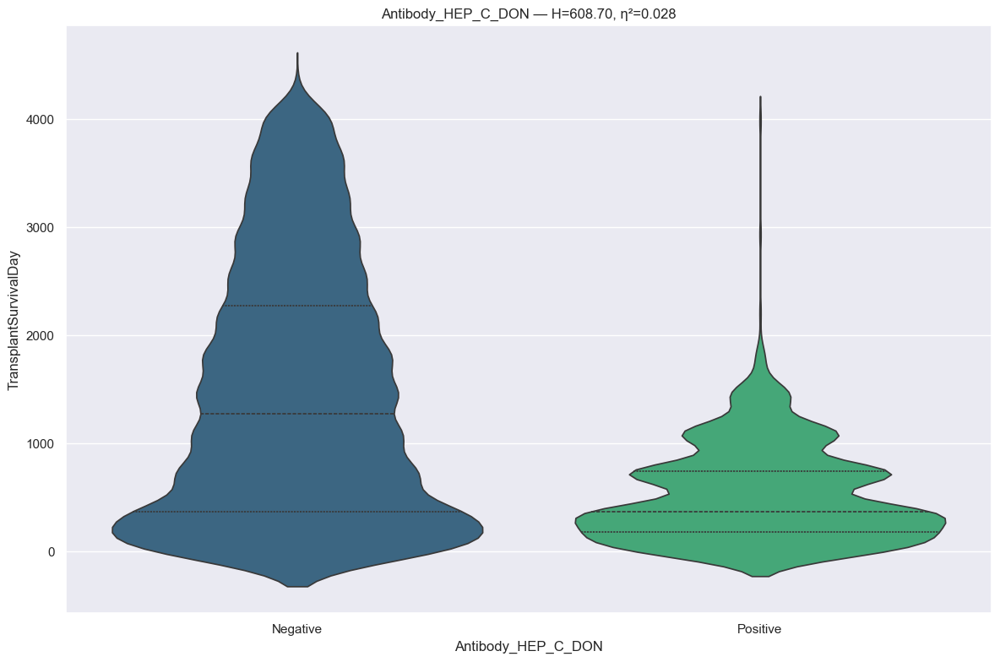

RANKING REPORT: Antibody_HEP_C_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  20404 records
 * Positive                                          :    957 records
BYPASSED CATEGORIES (n < min_n):
 * Indeterminate                                     :      1 records
 * Not Done                                          :      1 records
 * Pending                                           :      1 records
 * Unknown                                           :      2 records
--------------------------------------------------------------------------------
Kruskal H: 608.7045 | P-value: 2.140586e-134 | Effect η²: 0.0285
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Positive     | p=2.1407e-134 | thr=0.0500 | r=-0.471 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::

In [67]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [68]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Non Heart Beating

In [69]:
# info
feature = u.get_feature_info(df, 'NonHeartBeating', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique top   freq
NonHeartBeating_DON  21366      3  No  21125

:::: NaN Count:
NonHeartBeating_DON    0 



{'NonHeartBeating_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

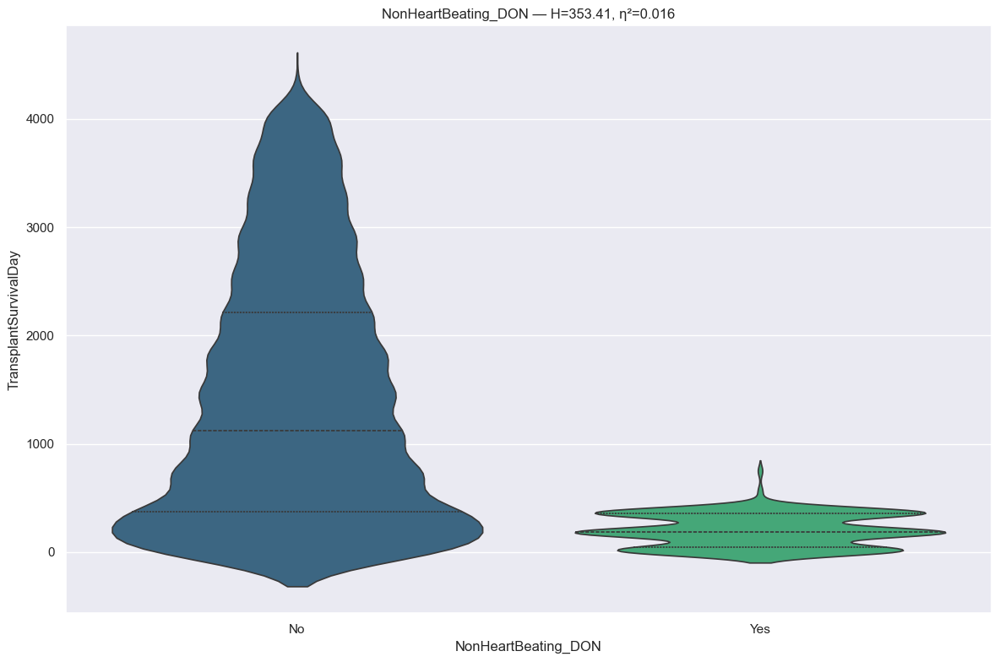

RANKING REPORT: NonHeartBeating_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21125 records
 * Yes                                               :    237 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 353.4054 | P-value: 7.683980e-79 | Effect η²: 0.0165
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.6847e-79 | thr=0.0500 | r=-0.709 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

NonHeartBeating_DON  mean_survival_days  median

In [70]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [71]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Anti-Hypertensive
* Antihypertensives are medications designed to lower high blood pressure (hypertension), reducing the risk of stroke, heart failure, and kidney disease. Common types include diuretics, ACE inhibitors, ARBs, and calcium channel blockers. They function by widening vessels, slowing heart rate, or removing excess salt/fluid. Common side effects include fatigue, dizziness, and headache. 

In [72]:
# info
feature = u.get_feature_info(df, 'AntiHypertensive_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique top   freq
AntiHypertensive_DON  21366      3  No  14452

:::: NaN Count:
AntiHypertensive_DON    0 



{'AntiHypertensive_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

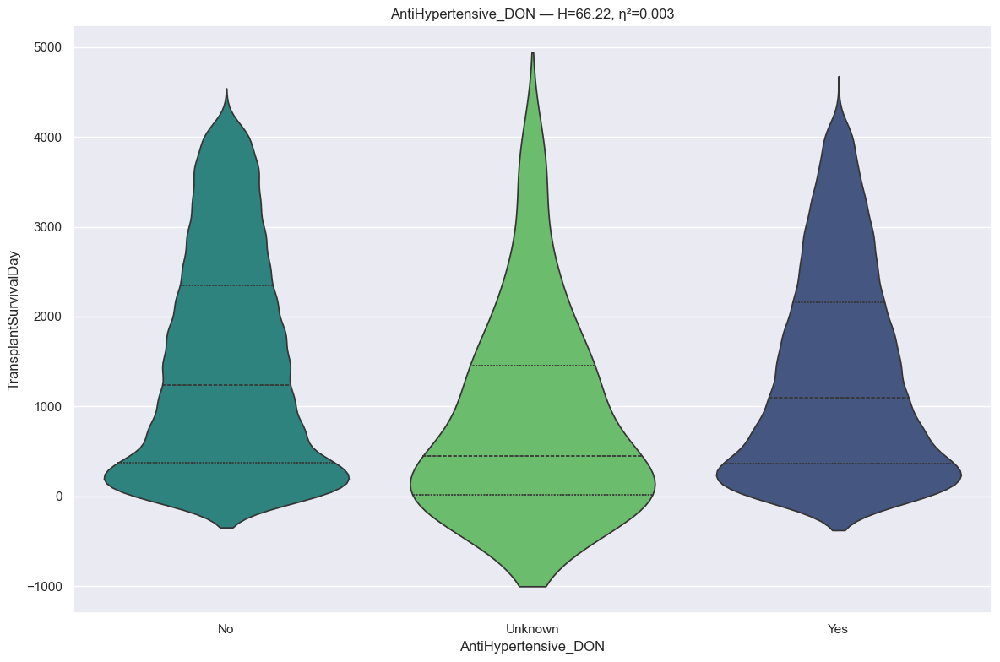

RANKING REPORT: AntiHypertensive_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14452 records
 * Unknown                                           :     46 records
 * Yes                                               :   6868 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 66.2198 | P-value: 4.174024e-15 | Effect η²: 0.0030
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.2254e-12 | thr=0.0167 | r=-0.059 | *Sig*
No           vs Unknown      | p=1.8438e-05 | thr=0.0167 | r=-0.365 | *Sig*
Unknown      vs Yes          | p=1.6008e-04 | thr=0.0167 | r= 0.322 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [73]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [74]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Blood Infection Source

In [75]:
# info
feature = u.get_feature_info(df, 'BloodInfectionSource', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique top   freq
BloodInfectionSource_DON  21366      3  No  19319

:::: NaN Count:
BloodInfectionSource_DON    0 



{'BloodInfectionSource_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

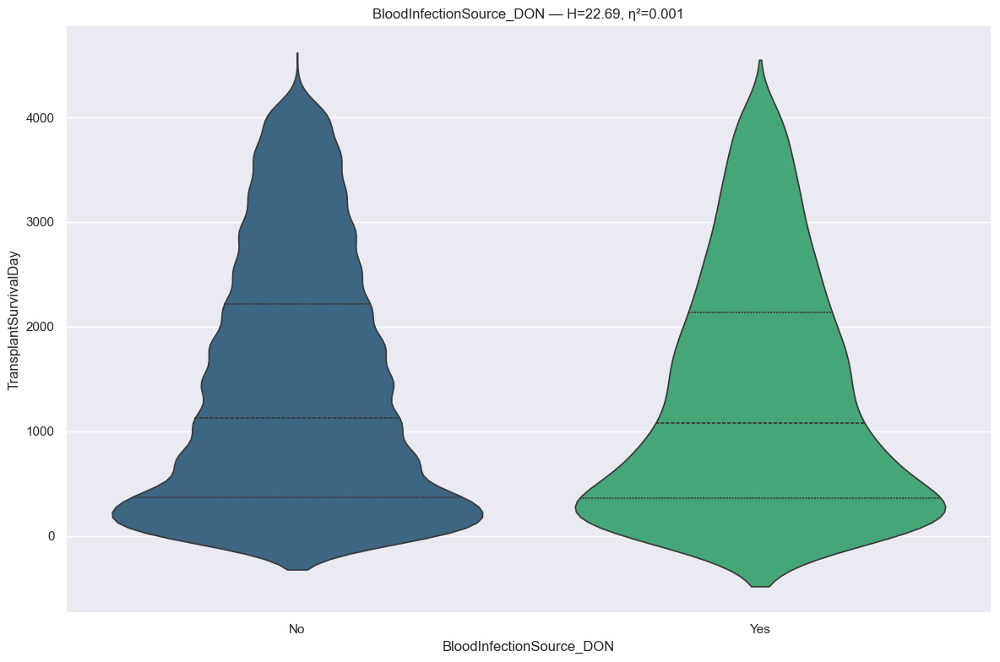

RANKING REPORT: BloodInfectionSource_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19319 records
 * Yes                                               :   2045 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      2 records
--------------------------------------------------------------------------------
Kruskal H: 22.6857 | P-value: 1.907816e-06 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.9078e-06 | thr=0.0500 | r=-0.064 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

BloodInfectionSource_DON  mean_survival_day

In [76]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [77]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### OtherInfectionSource_DON

In [78]:
# info
feature = u.get_feature_info(df, 'OtherInfectionSource', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique top   freq
OtherInfectionSource_DON  21366      3  No  14554

:::: NaN Count:
OtherInfectionSource_DON    0 



{'OtherInfectionSource_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

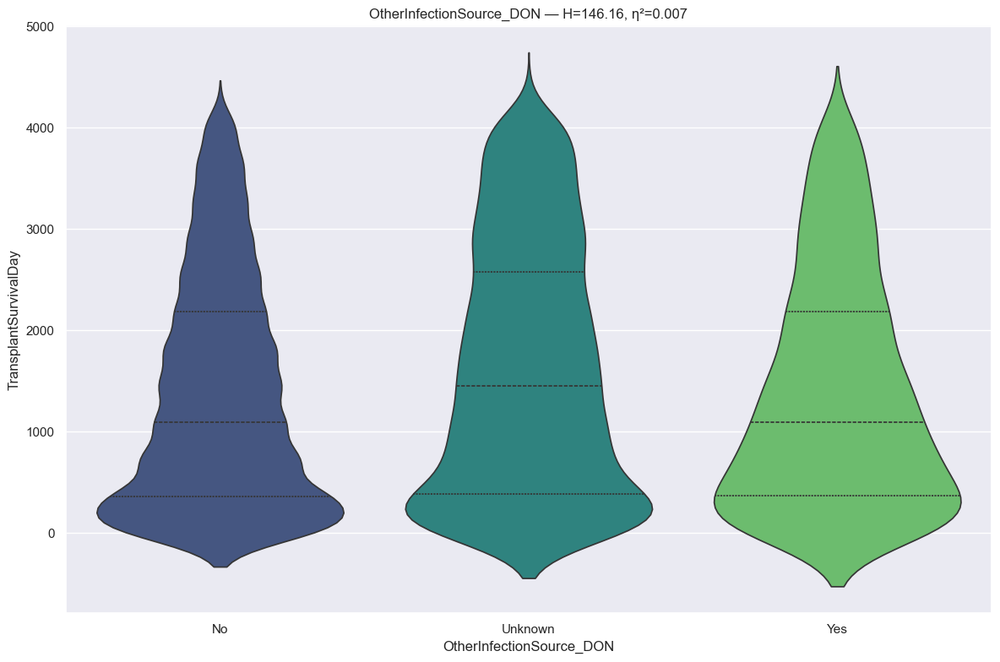

RANKING REPORT: OtherInfectionSource_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14554 records
 * Unknown                                           :   5306 records
 * Yes                                               :   1506 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 146.1635 | P-value: 1.823896e-32 | Effect η²: 0.0067
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=5.0563e-33 | thr=0.0167 | r= 0.111 | *Sig*
Unknown      vs Yes          | p=1.8992e-10 | thr=0.0167 | r=-0.107 | *Sig*
No           vs Yes          | p=8.4359e-01 | thr=0.0167 | r= 0.003 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> 

In [79]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [80]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: OtherInfectionSource_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14554 records
 * Unknown                                           :   5306 records
 * Yes                                               :   1506 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 146.1635 | P-value: 1.823896e-32 | Effect η²: 0.0067
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Unknown      | p=5.0563e-33 | thr=0.0167 | r= 0.111 | *Sig*
Unknown      vs Yes          | p=1.8992e-10 | thr=0.0250 | r=-0.107 | *Sig*
No           vs Yes          | p=8.4359e-01 | thr=0.0500 | r= 0.003 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>>

In [81]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: OtherInfectionSource_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14554 records
 * Unknown                                           :   5306 records
 * Yes                                               :   1506 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 146.1635 | P-value: 1.823896e-32 | Effect η²: 0.0067
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Unknown      | p=5.0563e-33 | fdr_alpha=0.05 | r= 0.111 | *Sig*
Unknown      vs Yes          | p=1.8992e-10 | fdr_alpha=0.05 | r=-0.107 | *Sig*
No           vs Yes          | p=8.4359e-01 | fdr_alpha=0.05 | r= 0.003 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::::

In [82]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diuretics
* Diuretics, or "water pills," help kidneys remove excess salt and water, primarily treating high blood pressure, heart failure, and edema (swelling) by increasing urine output. Common types include thiazide, loop, and potassium-sparing diuretics. Side effects often involve dizziness, electrolyte imbalances, and increased urination.

In [83]:
# info
feature = u.get_feature_info(df, 'Diuretics', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique  top   freq
Diuretics_DON  21366      3  Yes  14858

:::: NaN Count:
Diuretics_DON    0 



{'Diuretics_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

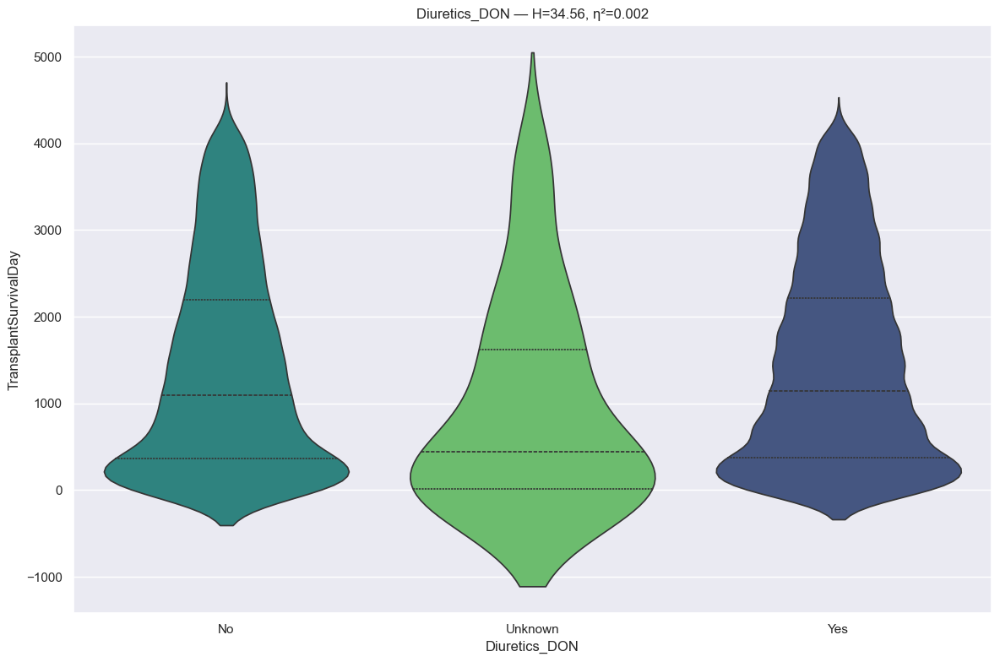

RANKING REPORT: Diuretics_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6464 records
 * Unknown                                           :     44 records
 * Yes                                               :  14858 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 34.5578 | P-value: 3.132273e-08 | Effect η²: 0.0015
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.2976e-06 | thr=0.0167 | r= 0.039 | *Sig*
Unknown      vs Yes          | p=1.3702e-04 | thr=0.0167 | r= 0.332 | *Sig*
No           vs Unknown      | p=4.6254e-04 | thr=0.0167 | r=-0.306 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 cat

In [84]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [85]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Steroids Use

In [86]:
# info
feature = u.get_feature_info(df, 'SteroidsUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique  top   freq
SteroidsUse_DON  21366      3  Yes  15239

:::: NaN Count:
SteroidsUse_DON    0 



{'SteroidsUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

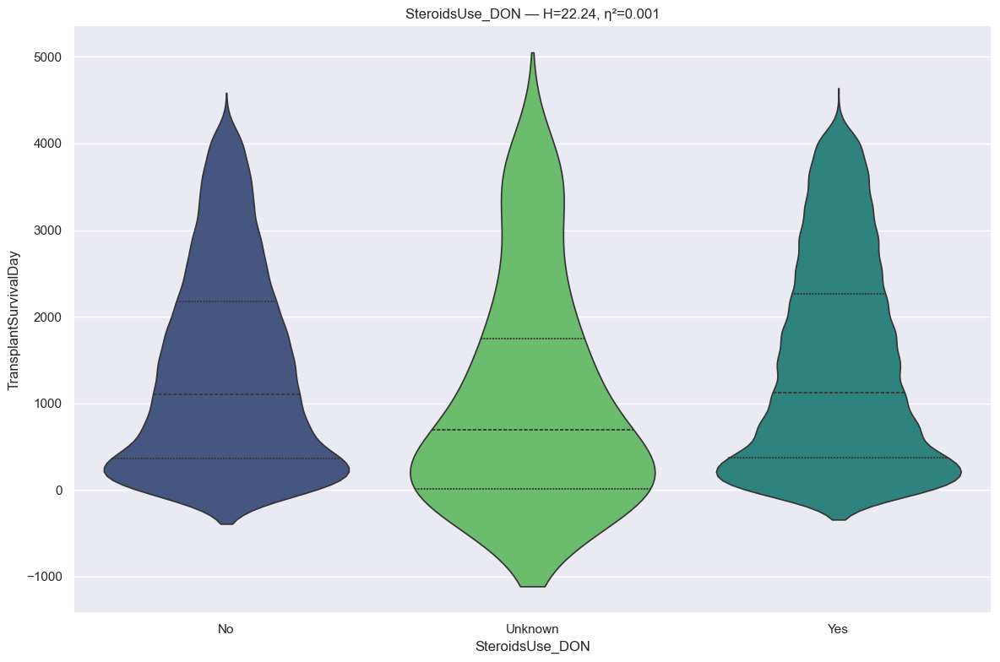

RANKING REPORT: SteroidsUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6072 records
 * Unknown                                           :     55 records
 * Yes                                               :  15239 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 22.2361 | P-value: 1.484196e-05 | Effect η²: 0.0009
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=6.7890e-04 | thr=0.0167 | r= 0.265 | *Sig*
No           vs Yes          | p=8.3234e-04 | thr=0.0167 | r= 0.029 | *Sig*
No           vs Unknown      | p=1.6648e-03 | thr=0.0167 | r=-0.246 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 c

In [87]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [88]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Triiodothyronine T3
* Triiodothyronine ($T_{3}$) is a vital thyroid hormone produced by the thyroid gland and by conversion from thyroxine ($T_{4}$), primarily regulating metabolism, body temperature, heart rate, and growth. It acts as the more active form of thyroid hormone. Normal adult ($T_{3}$) levels generally range from 70–205 nanograms per deciliter (ng/dL). 

In [89]:
# info
feature = u.get_feature_info(df, 'TriiodothyronineT3', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
TriiodothyronineT3_DON  21366      3  No  21225

:::: NaN Count:
TriiodothyronineT3_DON    0 



{'TriiodothyronineT3_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

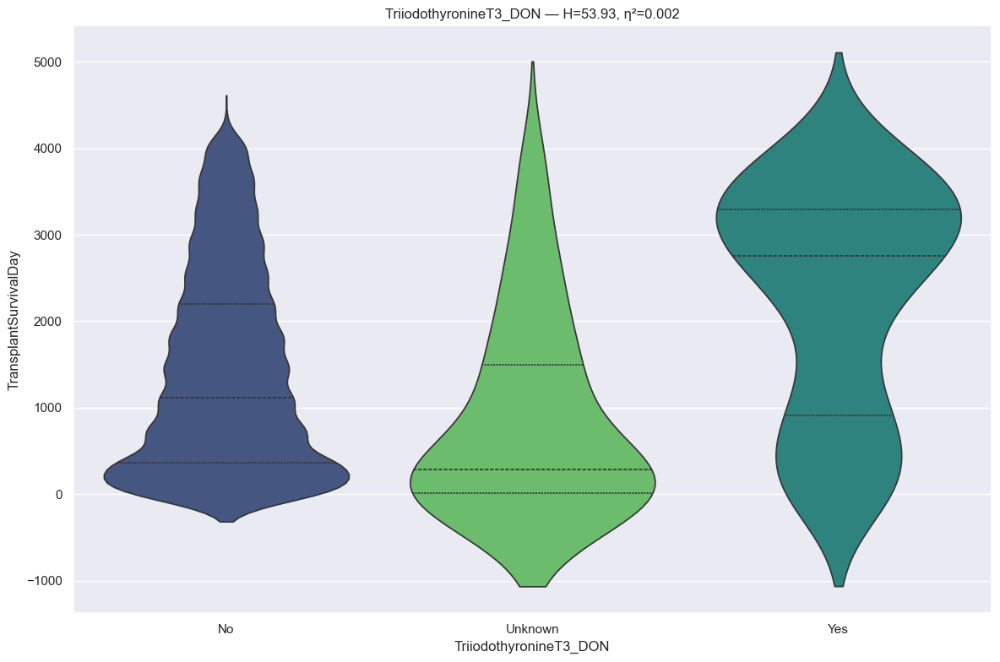

RANKING REPORT: TriiodothyronineT3_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21225 records
 * Unknown                                           :     44 records
 * Yes                                               :     97 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 53.9286 | P-value: 1.947879e-12 | Effect η²: 0.0024
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.0412e-09 | thr=0.0167 | r= 0.359 | *Sig*
Unknown      vs Yes          | p=3.6529e-08 | thr=0.0167 | r= 0.580 | *Sig*
No           vs Unknown      | p=4.5105e-05 | thr=0.0167 | r=-0.355 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [90]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [91]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Thyroxine T4
* Thyroxine $(T_{4}$) is a primary hormone produced by the thyroid gland, essential for regulating metabolism, heart rate, temperature, and brain development. It acts as a prohormone, converting to the more active $(T_{3})$ in tissues. Normal Free $(T_{4}$) levels are generally 0.8–1.9 ng/dL, while abnormalities cause hyperthyroidism (high) or hypothyroidism (low). 

In [92]:
# info
feature = u.get_feature_info(df, 'ThyroxineT4', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique  top   freq
ThyroxineT4_DON  21366      3  Yes  14314

:::: NaN Count:
ThyroxineT4_DON    0 



{'ThyroxineT4_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

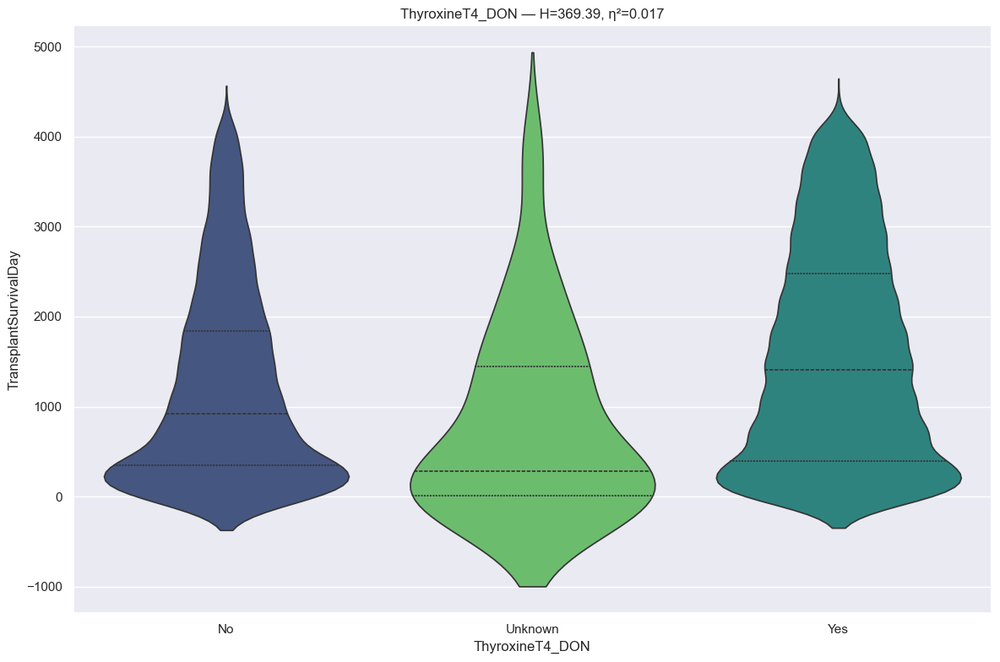

RANKING REPORT: ThyroxineT4_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7010 records
 * Unknown                                           :     42 records
 * Yes                                               :  14314 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 369.3869 | P-value: 6.146842e-81 | Effect η²: 0.0172
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.9808e-78 | thr=0.0167 | r= 0.158 | *Sig*
Unknown      vs Yes          | p=2.8396e-06 | thr=0.0167 | r= 0.418 | *Sig*
No           vs Unknown      | p=5.9542e-04 | thr=0.0167 | r=-0.307 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 

In [93]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [94]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Pulmonary Infection
* Pulmonary infections are infections in the lungs or airways caused by bacteria, viruses, or fungi, leading to inflammation and symptoms like cough, fever, chest pain, and difficulty breathing. Common types include pneumonia and bronchitis, often treated with antibiotics, antiviral medication, or self-care, depending on the cause.

In [95]:
# info
feature = u.get_feature_info(df, 'PulmonaryInfection', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique  top   freq
PulmonaryInfection_DON  21366      3  Yes  14948

:::: NaN Count:
PulmonaryInfection_DON    0 



{'PulmonaryInfection_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

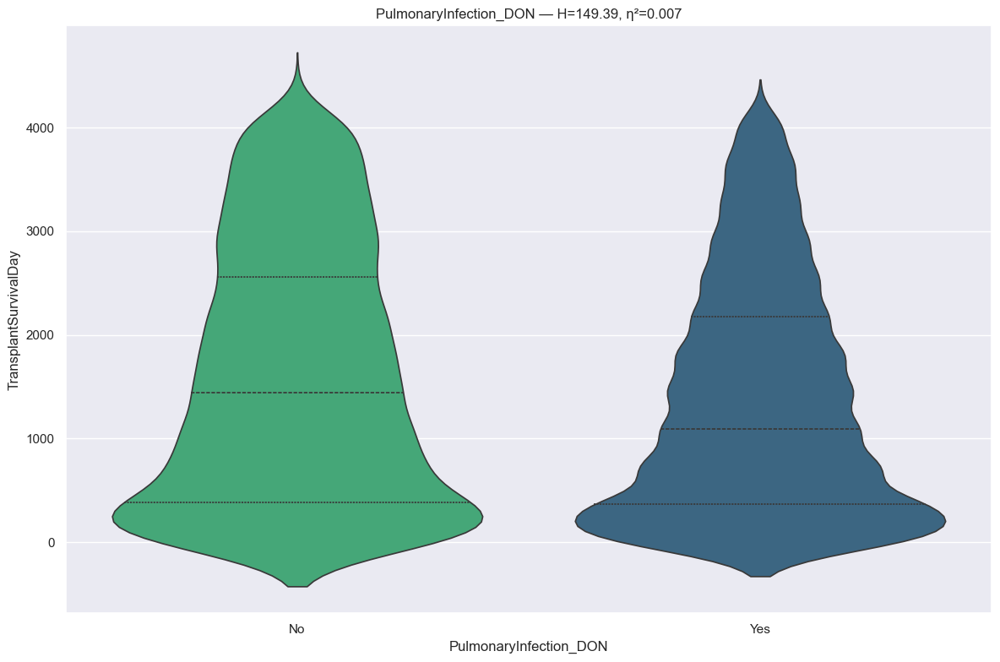

RANKING REPORT: PulmonaryInfection_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6416 records
 * Yes                                               :  14948 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      2 records
--------------------------------------------------------------------------------
Kruskal H: 149.3878 | P-value: 2.359191e-34 | Effect η²: 0.0069
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.3592e-34 | thr=0.0500 | r=-0.105 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

PulmonaryInfection_DON  mean_survival_days  

In [96]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [97]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### PULM INF CONF
* Pulmonary Function Tests (PFTs) are essential diagnostic tools that assess lung function by measuring volumes and flow, helping distinguish between obstructive diseases (e.g., COPD) and restrictive diseases (e.g., fibrosis). These tests measure FEV1, FVC, and flow-volume loops to guide treatment plans.

In [98]:
# info
feature = u.get_feature_info(df, 'PULM_INF_CONF_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique      top   freq
PULM_INF_CONF_DON  21366      3  Unknown  16606

:::: NaN Count:
PULM_INF_CONF_DON    0 



{'PULM_INF_CONF_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

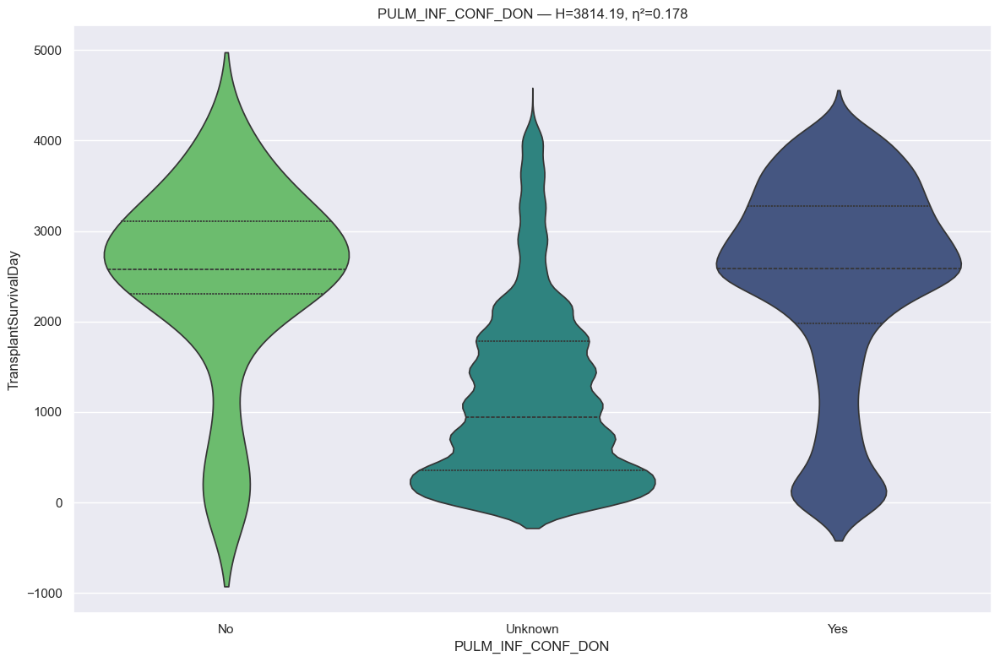

RANKING REPORT: PULM_INF_CONF_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :     54 records
 * Unknown                                           :  16606 records
 * Yes                                               :   4706 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3814.1877 | P-value: 0.000000e+00 | Effect η²: 0.1784
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=0.0000e+00 | thr=0.0167 | r= 0.586 | *Sig*
No           vs Unknown      | p=1.2197e-15 | thr=0.0167 | r=-0.630 | *Sig*
No           vs Yes          | p=9.7708e-01 | thr=0.0167 | r= 0.002 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_

In [99]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [100]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Urine Infection

In [101]:
# info
feature = u.get_feature_info(df, 'UrineInfection', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique top   freq
UrineInfection_DON  21366      3  No  20084

:::: NaN Count:
UrineInfection_DON    0 



{'UrineInfection_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

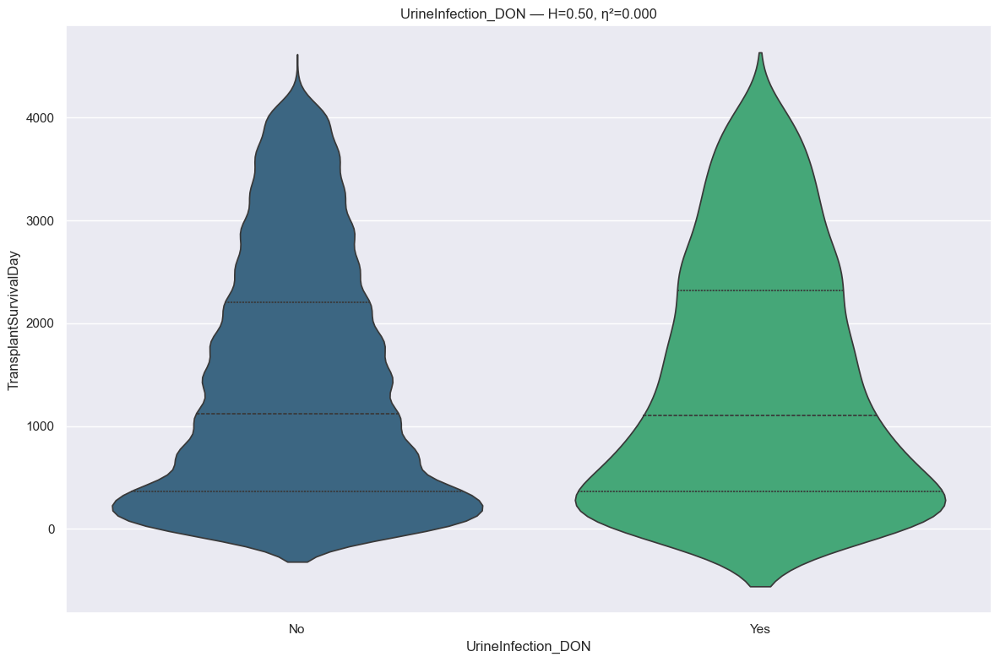

RANKING REPORT: UrineInfection_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20084 records
 * Yes                                               :   1280 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      2 records
--------------------------------------------------------------------------------
Kruskal H: 0.4992 | P-value: 4.798673e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.7987e-01 | thr=0.0500 | r=-0.012 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

UrineInfection_DON  mean_survival_days  median_survival_days  maximum_surviv

In [102]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [103]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Vasodilators
* Vasodilators are medications that widen blood vessels by relaxing smooth muscle cells in vessel walls, improving blood flow, and reducing blood pressure. They are primarily used to treat hypertension, heart failure, and angina. Common types include hydralazine, minoxidil, and nitroprusside. Common side effects include dizziness, headaches, flushing, and rapid heartbeat.

In [104]:
# info
feature = u.get_feature_info(df, 'Vasodilators', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique top   freq
Vasodilators_DON  21366      3  No  17828

:::: NaN Count:
Vasodilators_DON    0 



{'Vasodilators_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

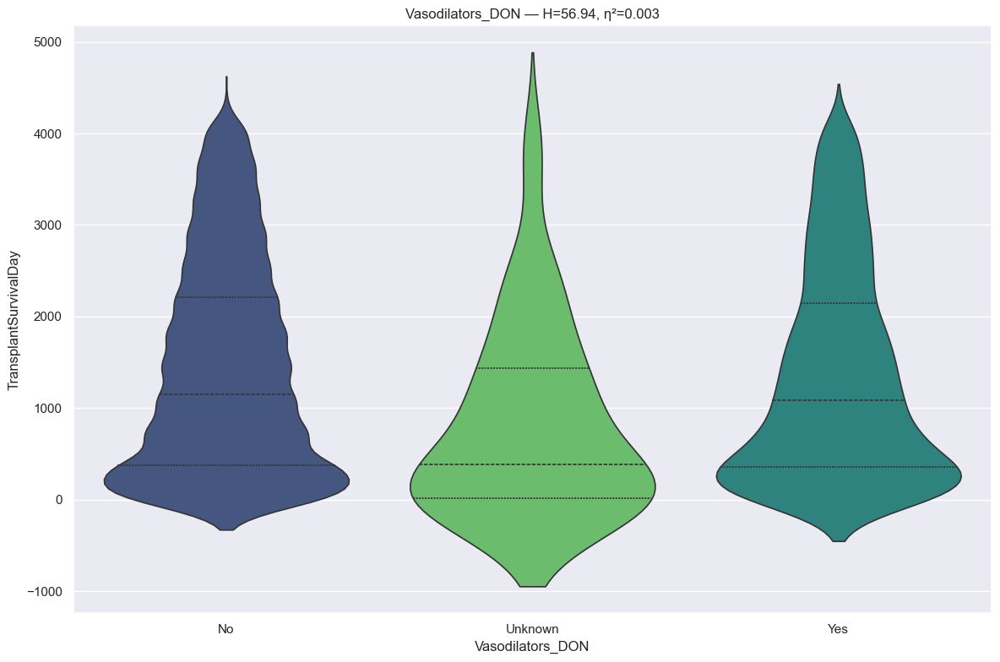

RANKING REPORT: Vasodilators_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  17828 records
 * Unknown                                           :     47 records
 * Yes                                               :   3491 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 56.9357 | P-value: 4.330714e-13 | Effect η²: 0.0026
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=8.7336e-10 | thr=0.0167 | r=-0.066 | *Sig*
No           vs Unknown      | p=6.8963e-06 | thr=0.0167 | r=-0.379 | *Sig*
Unknown      vs Yes          | p=9.6950e-05 | thr=0.0167 | r= 0.331 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 

In [105]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [106]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antibody Result RPR VDRL
* RPR (Rapid Plasma Reagin) and VDRL (Venereal Disease Research Laboratory) are essential non-treponemal screening tests used to detect active syphilis infection in both donors and recipients. A positive (reactive) RPR/VDRL result requires confirmation with a treponemal-specific test (such as TP-PA), as non-treponemal tests can yield false positives due to other conditions, including autoimmune disorders or infections.

In [107]:
# info
feature = u.get_feature_info(df, 'AntibodyResultRPR_VDRL', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique       top   freq
AntibodyResultRPR_VDRL_DON  21366      5  Negative  20826

:::: NaN Count:
AntibodyResultRPR_VDRL_DON    0 



{'AntibodyResultRPR_VDRL_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Positive',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

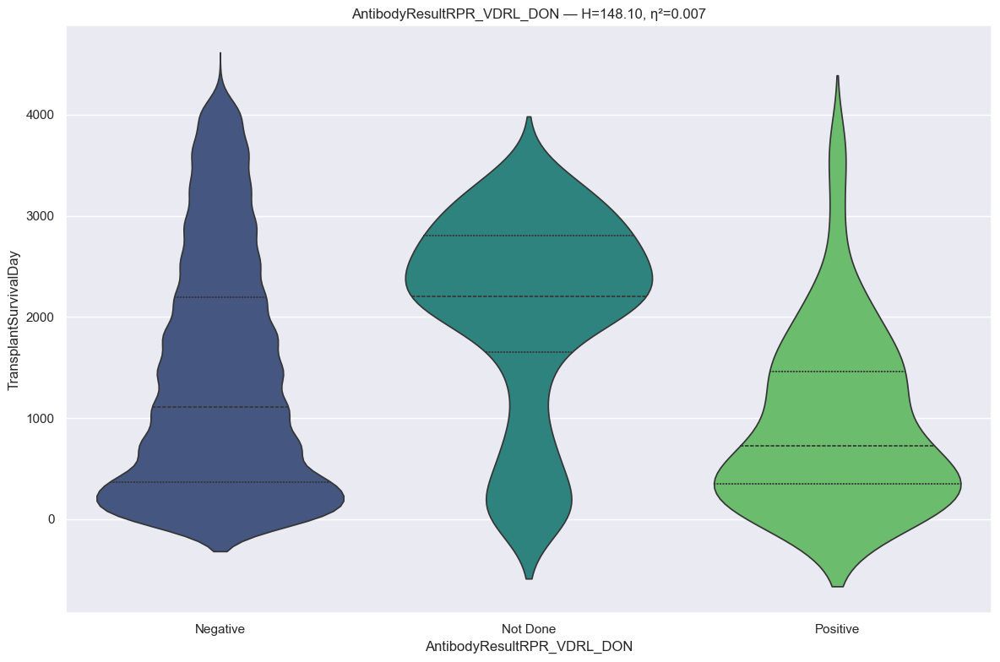

RANKING REPORT: AntibodyResultRPR_VDRL_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  20826 records
 * Not Done                                          :    410 records
 * Positive                                          :    114 records
BYPASSED CATEGORIES (n < min_n):
 * Indeterminate                                     :      1 records
 * Unknown                                           :     15 records
--------------------------------------------------------------------------------
Kruskal H: 148.0974 | P-value: 6.935333e-33 | Effect η²: 0.0068
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=2.4583e-30 | thr=0.0167 | r= 0.330 | *Sig*
Not Done     vs Positive     | p=1.4338e-21 | thr=0.0167 | r=-0.584 | *Sig*
Negative     vs Positive     | p=6.8258e-05 | thr=0.0167 | r=-0.216 | *S

In [108]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [109]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Infection Clinical
* Clinical infection occurs when pathogenic microorganisms—bacteria, viruses, fungi, or parasites—enter the body, multiply, and trigger a host immune response, causing symptoms like fever, fatigue, and pain. These diseases spread through person-to-person contact, contaminated food/water, surfaces, or insect bites. Treatments include antibiotics, antivirals, or antifungals, often guided by diagnostic tests like blood tests, urine tests, or throat swabs.

In [110]:
# info
feature = u.get_feature_info(df, 'InfectionClinical', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique  top   freq
InfectionClinical_DON  21366      3  Yes  16060

:::: NaN Count:
InfectionClinical_DON    0 



{'InfectionClinical_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

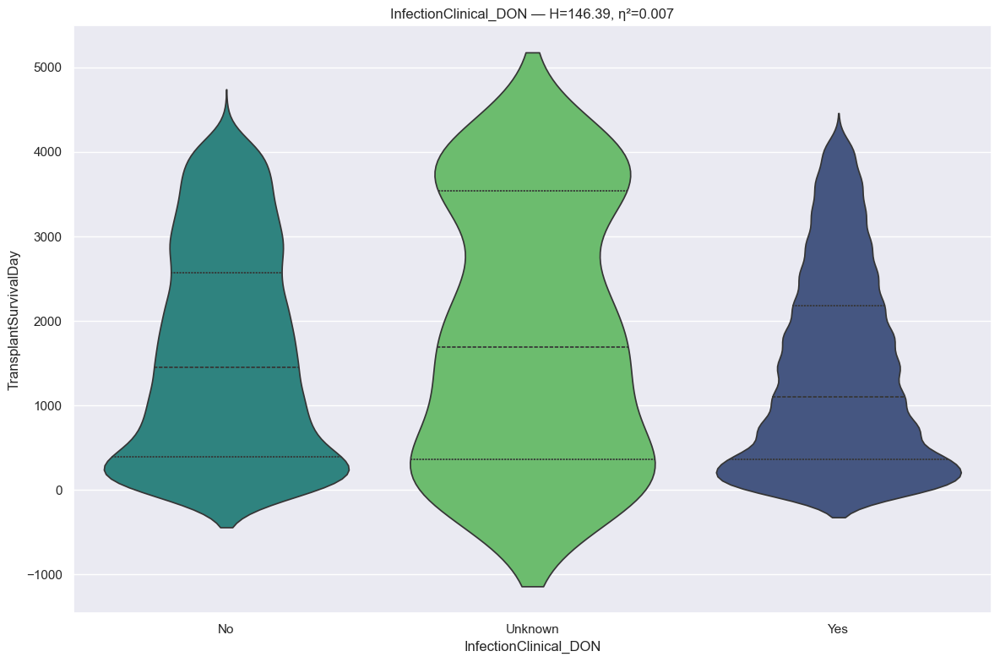

RANKING REPORT: InfectionClinical_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5187 records
 * Unknown                                           :    119 records
 * Yes                                               :  16060 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 146.3909 | P-value: 1.627853e-32 | Effect η²: 0.0068
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=8.0464e-33 | thr=0.0167 | r=-0.110 | *Sig*
Unknown      vs Yes          | p=1.3078e-02 | thr=0.0167 | r=-0.132 | *Sig*
No           vs Unknown      | p=3.9290e-01 | thr=0.0167 | r= 0.046 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gro

In [111]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [112]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04}  # more relaxed & retain these small-but-important differences
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InfectionClinical_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5187 records
 * Unknown                                           :    119 records
 * Yes                                               :  16060 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 146.3909 | P-value: 1.627853e-32 | Effect η²: 0.0068
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Yes          | p=8.0464e-33 | thr=0.0167 | r=-0.110 | *Sig*
Unknown      vs Yes          | p=1.3078e-02 | thr=0.0250 | r=-0.132 | *Sig*
No           vs Unknown      | p=3.9290e-01 | thr=0.0500 | r= 0.046 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gr

In [113]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cocaine Use

In [114]:
# info
feature = u.get_feature_info(df, '^CocaineUse_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique      top   freq
CocaineUse_DON  21366      3  Unknown  17181

:::: NaN Count:
CocaineUse_DON    0 



{'CocaineUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

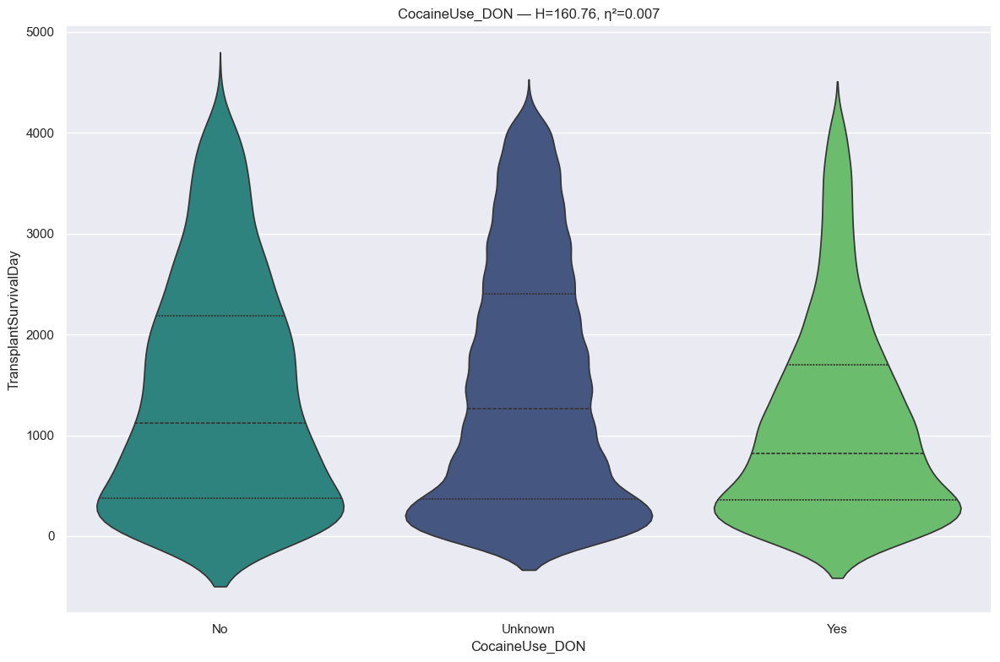

RANKING REPORT: CocaineUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1706 records
 * Unknown                                           :  17181 records
 * Yes                                               :   2479 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 160.7623 | P-value: 1.232880e-35 | Effect η²: 0.0074
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.5872e-36 | thr=0.0167 | r=-0.157 | *Sig*
No           vs Yes          | p=2.1399e-14 | thr=0.0167 | r=-0.139 | *Sig*
No           vs Unknown      | p=7.7976e-02 | thr=0.0167 | r= 0.026 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2

In [115]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [116]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CocaineUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1706 records
 * Unknown                                           :  17181 records
 * Yes                                               :   2479 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 160.7623 | P-value: 1.232880e-35 | Effect η²: 0.0074
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Unknown

>>> Group_2 (1 categories)
  - Yes



In [117]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Other Drug Use

In [118]:
# info
feature = u.get_feature_info(df, '^OtherDrugUse_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique      top  freq
OtherDrugUse_DON  21366      3  Unknown  9992

:::: NaN Count:
OtherDrugUse_DON    0 



{'OtherDrugUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

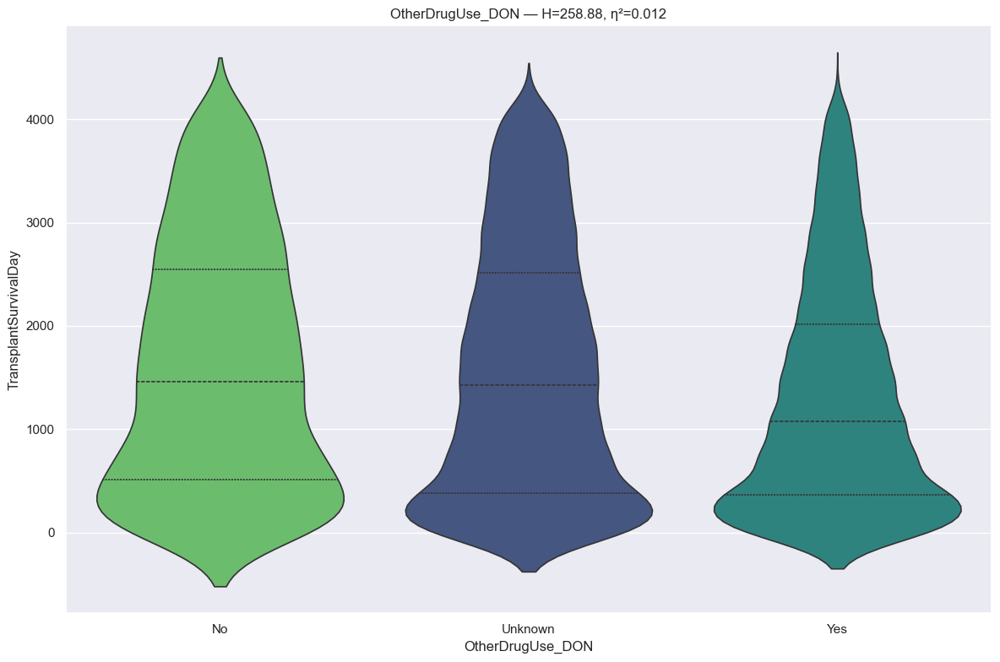

RANKING REPORT: OtherDrugUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1932 records
 * Unknown                                           :   9992 records
 * Yes                                               :   9442 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 258.8803 | P-value: 6.093253e-57 | Effect η²: 0.0120
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.3175e-48 | thr=0.0167 | r=-0.121 | *Sig*
No           vs Yes          | p=8.3913e-27 | thr=0.0167 | r=-0.155 | *Sig*
No           vs Unknown      | p=3.5050e-02 | thr=0.0167 | r=-0.030 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 

In [119]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [120]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: OtherDrugUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1932 records
 * Unknown                                           :   9992 records
 * Yes                                               :   9442 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 258.8803 | P-value: 6.093253e-57 | Effect η²: 0.0120
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [121]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cancer ExtraCranial
* Extracranial germ cell tumors (GCTs) are cancers that develop outside the brain, frequently occurring in children and young adults on the sacrum, coccyx, chest, or abdomen. They are classified as benign (mature teratoma) or malignant. Treatment options often include a combination of surgery, cisplatin-based chemotherapy (such as BEP), and radiation therapy.

In [122]:
# info
feature = u.get_feature_info(df, 'CancerExtraCranial', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
CancerExtraCranial_DON  21366      3  No  21150

:::: NaN Count:
CancerExtraCranial_DON    0 



{'CancerExtraCranial_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

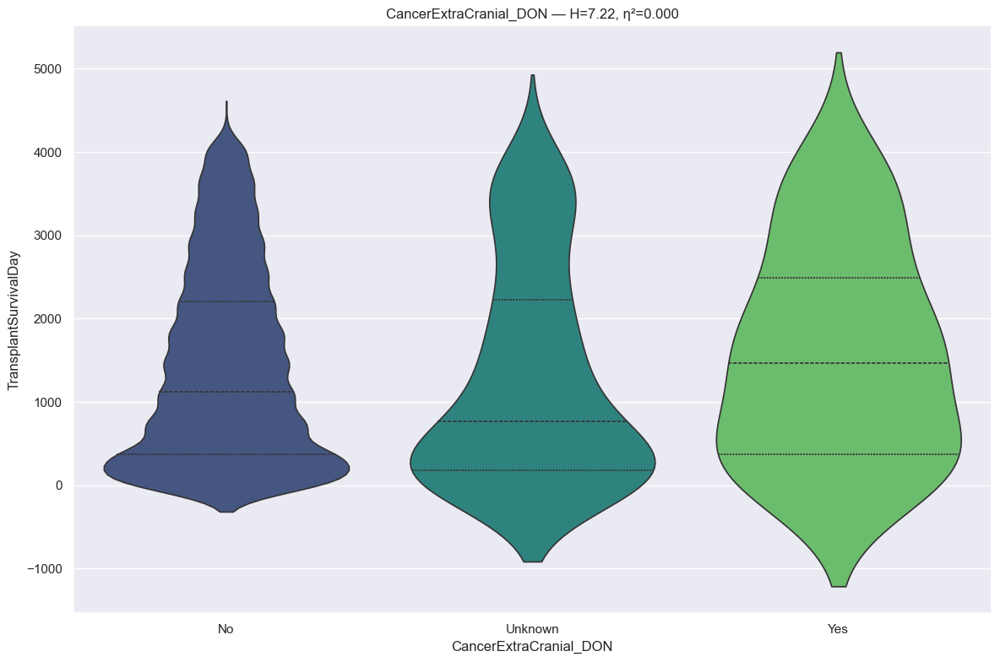

RANKING REPORT: CancerExtraCranial_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21150 records
 * Unknown                                           :    178 records
 * Yes                                               :     38 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.2160 | P-value: 2.710628e-02 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=8.5723e-03 | thr=0.0167 | r=-0.114 | *Sig*
Unknown      vs Yes          | p=1.3002e-01 | thr=0.0167 | r= 0.157 | Not Sig
No           vs Yes          | p=5.8538e-01 | thr=0.0167 | r= 0.051 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gr

In [123]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [124]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.05, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CancerExtraCranial_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21150 records
 * Unknown                                           :    178 records
 * Yes                                               :     38 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.2160 | P-value: 2.710628e-02 | Effect η²: 0.0002
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.05)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [125]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cancer Site

In [126]:
# info
feature = u.get_feature_info(df, 'CancerSite', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top   freq
CancerSite_DON  21366     18  NO  21037

:::: NaN Count:
CancerSite_DON    0 



{'CancerSite_DON': CategoricalDtype(categories=['BREAST', 'CNS TUMOR - ASTROCYTOMA',
                   'CNS TUMOR - GLIOBLASTOMA MULTIFORME',
                   'CNS TUMOR - MEDULLOBLASTOMA', 'CNS TUMOR - MENINGIOMA',
                   'CNS TUMOR - NEUROBLASTOMA', 'CNS TUMOR - OTHER',
                   'GASTROINTESTINAL - COLO-RECTAL',
                   'GASTROINTESTINAL - STOMACH', 'GENITOURINARY - BLADDER',
                   'GENITOURINARY - KIDNEY', 'GENITOURINARY - OVARIAN',
                   'GENITOURINARY - PENIS, TESTICULAR',
                   'GENITOURINARY - PROSTATE', 'GENITOURINARY - UNKNOWN',
                   'GENITOURINARY - UTERINE BODY CHORIOCARCINOMA',
                   'GENITOURINARY - UTERINE BODY ENDOMETRIAL',
                   'GENITOURINARY - UTERINE CERVIX', 'GENITOURINARY - VULVA',
                   'LEUKEMIA/LYMPHOMA', 'NO', 'OTHER, SPECIFY',
                   'SKIN - MELANOMA', 'SKIN - SQUAMOUS, BASAL CELL', 'THYROID',
                   'Unknown']

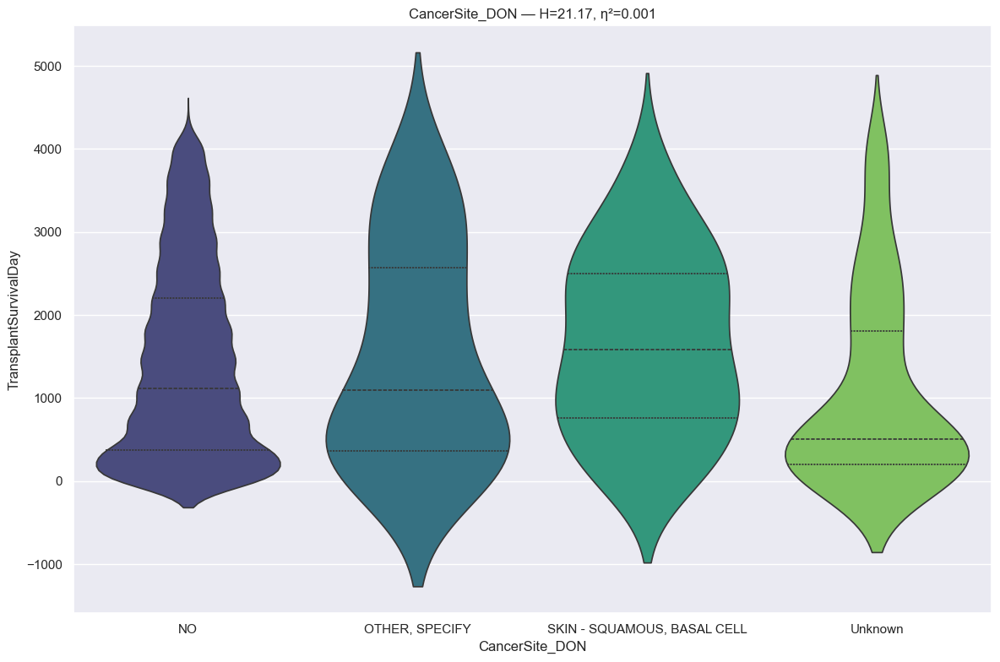

RANKING REPORT: CancerSite_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * NO                                                :  21037 records
 * OTHER, SPECIFY                                    :     32 records
 * SKIN - SQUAMOUS, BASAL CELL                       :     52 records
 * Unknown                                           :    149 records
BYPASSED CATEGORIES (n < min_n):
 * CNS TUMOR - ASTROCYTOMA                           :     14 records
 * CNS TUMOR - GLIOBLASTOMA MULTIFORME               :     11 records
 * CNS TUMOR - MEDULLOBLASTOMA                       :      1 records
 * CNS TUMOR - MENINGIOMA                            :      3 records
 * CNS TUMOR - OTHER                                 :     14 records
 * GASTROINTESTINAL - COLO-RECTAL                    :      3 records
 * GASTROINTESTINAL - STOMACH                        :      1 records
 * GENITOURINARY - BLADDER                           :      2 records
 * GENITOURINARY - KIDNEY                            :      7 reco

In [127]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [128]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CancerSite_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * NO                                                :  21037 records
 * OTHER, SPECIFY                                    :     32 records
 * SKIN - SQUAMOUS, BASAL CELL                       :     52 records
 * Unknown                                           :    149 records
BYPASSED CATEGORIES (n < min_n):
 * CNS TUMOR - ASTROCYTOMA                           :     14 records
 * CNS TUMOR - GLIOBLASTOMA MULTIFORME               :     11 records
 * CNS TUMOR - MEDULLOBLASTOMA                       :      1 records
 * CNS TUMOR - MENINGIOMA                            :      3 records
 * CNS TUMOR - OTHER                                 :     14 records
 * GASTROINTESTINAL - COLO-RECTAL                    :      3 records
 * GASTROINTESTINAL - STOMACH                        :      1 records
 * GENITOURINARY - BLADDER                           :      2 records
 * GENITOURINARY - KIDNEY                            :      7 reco

In [129]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cigarette History

In [130]:
# info
feature = u.get_feature_info(df, 'CigaretteHistory', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique top   freq
CigaretteHistory_DON  21366      3  No  18622

:::: NaN Count:
CigaretteHistory_DON    0 



{'CigaretteHistory_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

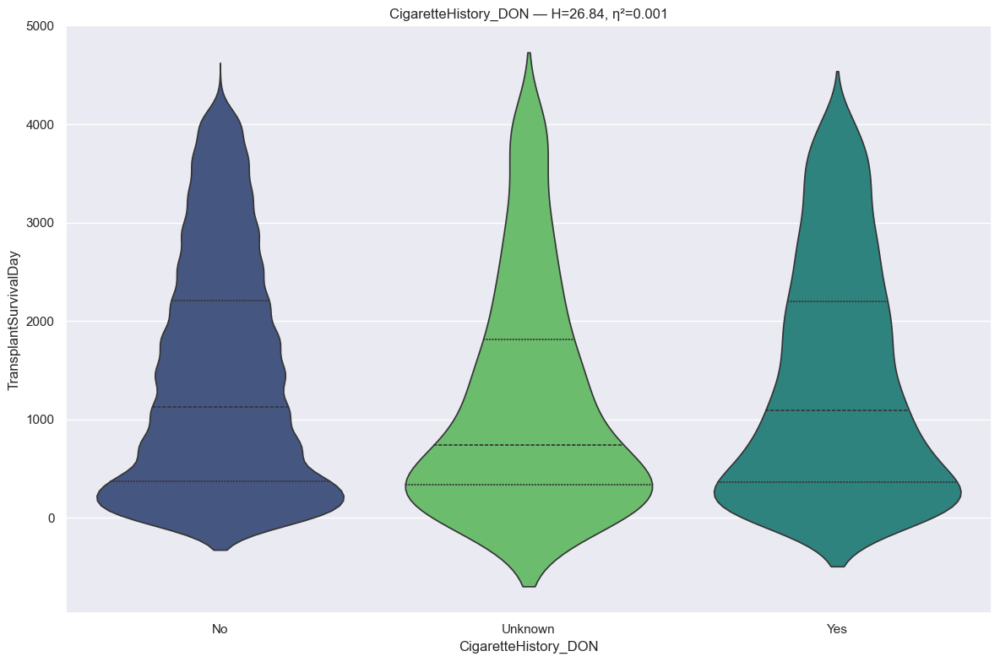

RANKING REPORT: CigaretteHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  18622 records
 * Unknown                                           :    364 records
 * Yes                                               :   2380 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 26.8411 | P-value: 1.484321e-06 | Effect η²: 0.0012
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=3.9278e-06 | thr=0.0167 | r=-0.141 | *Sig*
Unknown      vs Yes          | p=1.1076e-03 | thr=0.0167 | r= 0.106 | *Sig*
No           vs Yes          | p=9.8532e-03 | thr=0.0167 | r=-0.032 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [131]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [132]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Hypertension History
* Hypertension, or high blood pressure, is a chronic condition where blood forces against artery walls too strongly, often caused by lifestyle factors (poor diet, lack of exercise) or genetics.

In [133]:
# info
feature = u.get_feature_info(df, 'HypertensionHistory', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique top   freq
HypertensionHistory_DON  21366      3  No  18372

:::: NaN Count:
HypertensionHistory_DON    0 



{'HypertensionHistory_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

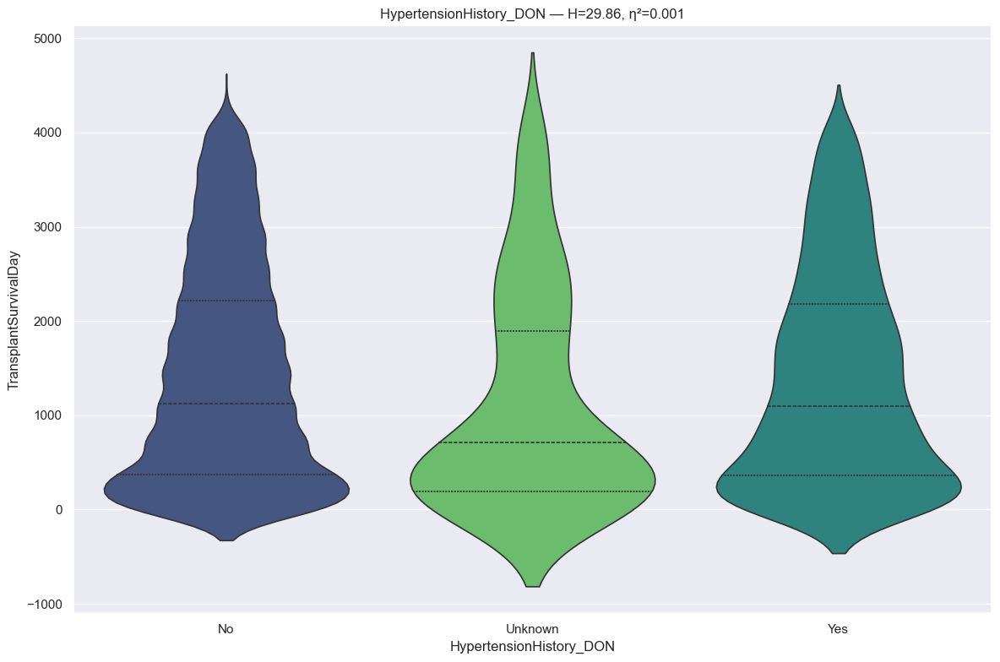

RANKING REPORT: HypertensionHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  18372 records
 * Unknown                                           :    180 records
 * Yes                                               :   2814 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 29.8553 | P-value: 3.288612e-07 | Effect η²: 0.0013
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.0915e-05 | thr=0.0167 | r=-0.190 | *Sig*
Unknown      vs Yes          | p=5.7364e-04 | thr=0.0167 | r= 0.153 | *Sig*
No           vs Yes          | p=6.9844e-04 | thr=0.0167 | r=-0.040 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Grou

In [134]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [135]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cancer Intra-Cranial
* Intracranial cancer involves tumors within the skull, either originating in the brain (primary) or spreading from elsewhere (metastatic). Key symptoms include severe headaches, seizures, nausea, vision changes, and personality shifts, which often progress quickly. Diagnosis involves imaging (MRI/CT), while treatments include surgery, radiation, and chemotherapy.

In [136]:
# info
feature = u.get_feature_info(df, 'CancerIntraCranial', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top   freq
CancerIntraCranial_DON  21366      3  No  21126

:::: NaN Count:
CancerIntraCranial_DON    0 



{'CancerIntraCranial_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

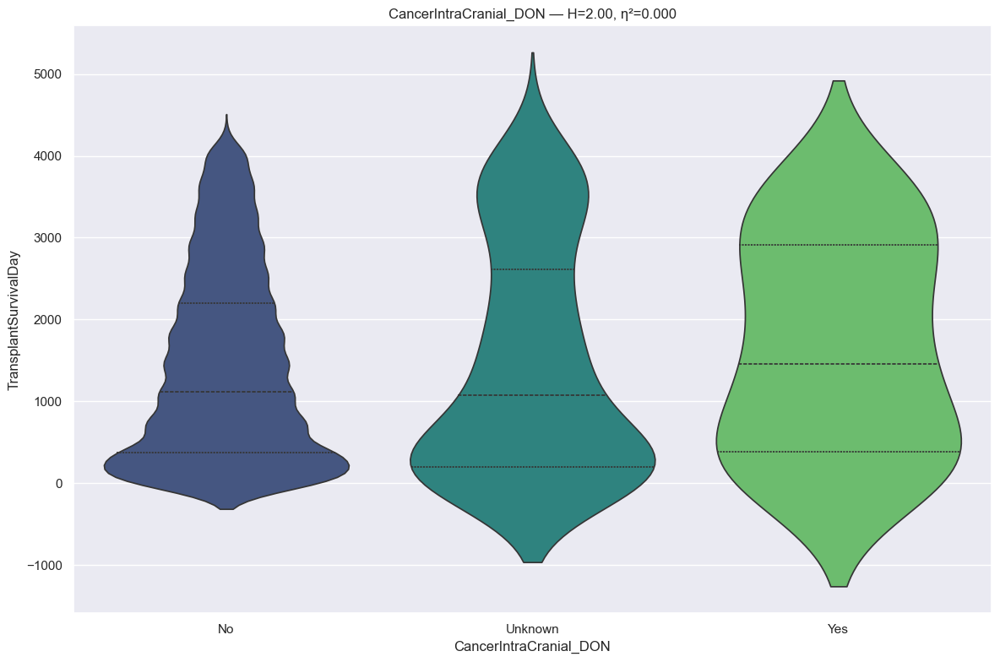

RANKING REPORT: CancerIntraCranial_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21126 records
 * Unknown                                           :    203 records
 * Yes                                               :     37 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.0001 | P-value: 3.678673e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=2.7833e-01 | thr=0.0167 | r=-0.044 | Not Sig
Unknown      vs Yes          | p=3.4997e-01 | thr=0.0167 | r= 0.097 | Not Sig
No           vs Yes          | p=3.6344e-01 | thr=0.0167 | r= 0.086 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> 

In [137]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [138]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Cancer History

In [139]:
# info
feature = u.get_feature_info(df, 'CancerHistory', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique top   freq
CancerHistory_DON  21366      3  No  21037

:::: NaN Count:
CancerHistory_DON    0 



{'CancerHistory_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

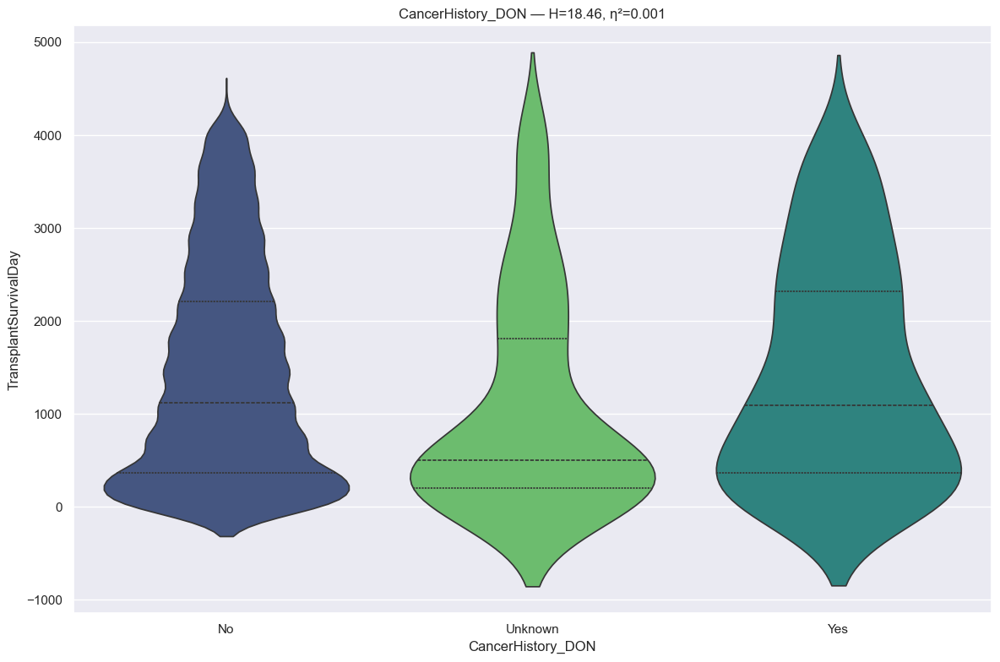

RANKING REPORT: CancerHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21037 records
 * Unknown                                           :    149 records
 * Yes                                               :    180 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 18.4645 | P-value: 9.783216e-05 | Effect η²: 0.0008
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.8130e-05 | thr=0.0167 | r=-0.203 | *Sig*
Unknown      vs Yes          | p=4.3254e-03 | thr=0.0167 | r= 0.183 | *Sig*
No           vs Yes          | p=7.3110e-01 | thr=0.0167 | r=-0.015 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 

In [140]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [141]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CancerHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21037 records
 * Unknown                                           :    149 records
 * Yes                                               :    180 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 18.4645 | P-value: 9.783216e-05 | Effect η²: 0.0008
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [142]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diabetes History
* Diabetes is a chronic condition characterized by high blood sugar (glucose) levels caused by a lack of insulin or the body’s inability to use it properly. Type 2 is the most common form, driven by insulin resistance, lifestyle factors, and genetics, while Type 1 is autoimmune. Common symptoms include frequent urination, extreme thirst, unexplained weight loss, and fatigue. While there is no cure, it is managed through lifestyle changes (diet/exercise) and medication, with complications like heart disease, nerve damage, and kidney issues possible if poorly managed.

In [143]:
# info
feature = u.get_feature_info(df, 'DiabetesHistory', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique top   freq
DiabetesHistory_DON  21366      6  No  20560

:::: NaN Count:
DiabetesHistory_DON    0 



{'DiabetesHistory_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes, 0-5 Years', 'Yes, 6-10 Years',
                   'Yes, >10 Years', 'Yes, Duration Unknown'],
 , ordered=False, categories_dtype=str)}

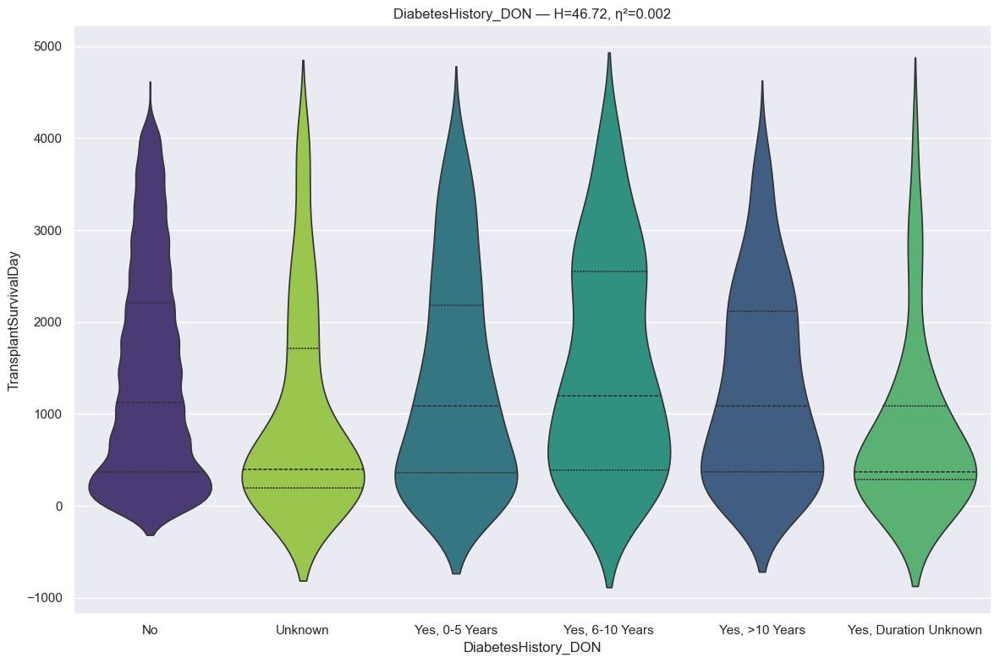

RANKING REPORT: DiabetesHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20560 records
 * Unknown                                           :    153 records
 * Yes, 0-5 Years                                    :    300 records
 * Yes, 6-10 Years                                   :    122 records
 * Yes, >10 Years                                    :    184 records
 * Yes, Duration Unknown                             :     47 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 46.7198 | P-value: 6.480085e-09 | Effect η²: 0.0020
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=2.9019e-07 | thr=0.0033 | r=-0.240 | *Sig*
Unknown      vs Yes, 6-10 Years | p=2.4683e-05 | thr=0.0033 | r= 0.296 | *Sig*
No           v

In [144]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [145]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DiabetesHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20560 records
 * Unknown                                           :    153 records
 * Yes, 0-5 Years                                    :    300 records
 * Yes, 6-10 Years                                   :    122 records
 * Yes, >10 Years                                    :    184 records
 * Yes, Duration Unknown                             :     47 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 46.7198 | P-value: 6.480085e-09 | Effect η²: 0.0020
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 5 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::

In [146]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diabetes
* Diabetes is a chronic condition characterized by high blood sugar (glucose) levels caused by a lack of insulin or the body’s inability to use it properly. Type 2 is the most common form, driven by insulin resistance, lifestyle factors, and genetics, while Type 1 is autoimmune. Common symptoms include frequent urination, extreme thirst, unexplained weight loss, and fatigue. While there is no cure, it is managed through lifestyle changes (diet/exercise) and medication, with complications like heart disease, nerve damage, and kidney issues possible if poorly managed.

In [147]:
# info
feature = u.get_feature_info(df, 'Diabetes_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

              count unique top   freq
Diabetes_DON  21366      3  No  20560

:::: NaN Count:
Diabetes_DON    0 



{'Diabetes_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

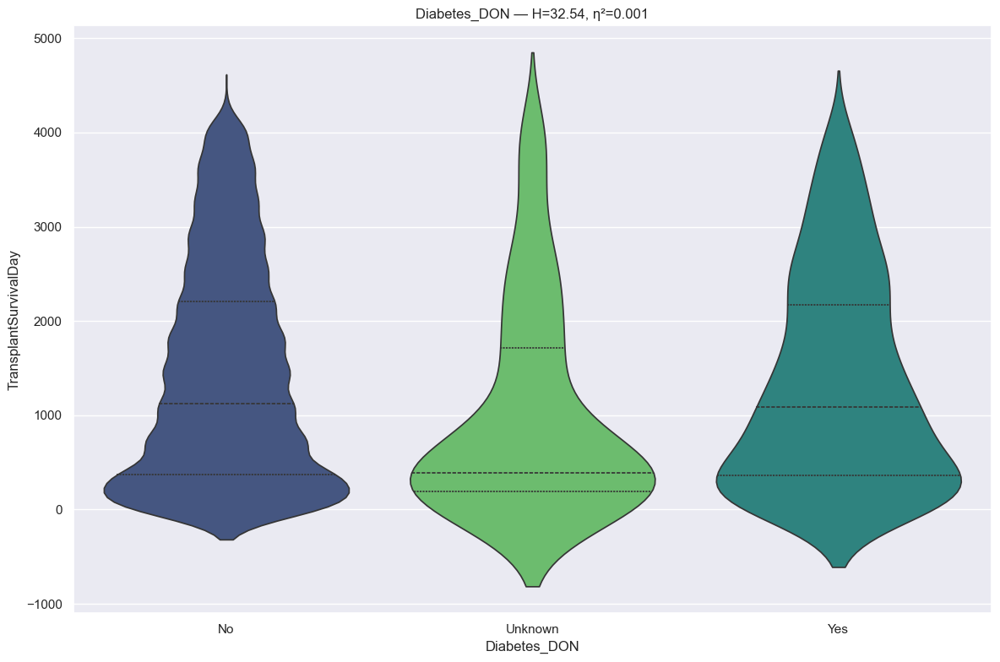

RANKING REPORT: Diabetes_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20560 records
 * Unknown                                           :    153 records
 * Yes                                               :    653 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 32.5378 | P-value: 8.600030e-08 | Effect η²: 0.0014
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=2.9019e-07 | thr=0.0167 | r=-0.240 | *Sig*
Unknown      vs Yes          | p=2.6523e-04 | thr=0.0167 | r= 0.189 | *Sig*
No           vs Yes          | p=1.0351e-02 | thr=0.0167 | r=-0.059 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 cate

In [148]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [149]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Past Other Drug Use

In [150]:
# info
feature = u.get_feature_info(df, 'PastOtherDrugUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique  top   freq
PastOtherDrugUse_DON  21366      3  Yes  12467

:::: NaN Count:
PastOtherDrugUse_DON    0 



{'PastOtherDrugUse_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

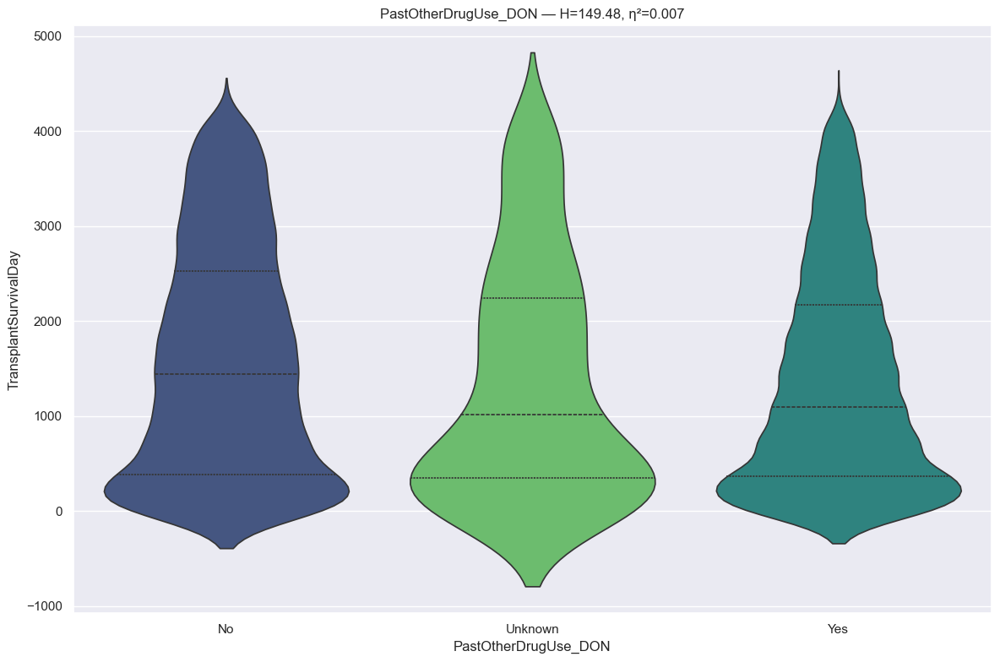

RANKING REPORT: PastOtherDrugUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   8600 records
 * Unknown                                           :    299 records
 * Yes                                               :  12467 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 149.4842 | P-value: 3.466758e-33 | Effect η²: 0.0069
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.6344e-33 | thr=0.0167 | r=-0.098 | *Sig*
No           vs Unknown      | p=3.4667e-04 | thr=0.0167 | r=-0.122 | *Sig*
Unknown      vs Yes          | p=2.8691e-01 | thr=0.0167 | r= 0.036 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Grou

In [151]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [152]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": False,}  # more relaxed

# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PastOtherDrugUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   8600 records
 * Unknown                                           :    299 records
 * Yes                                               :  12467 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 149.4842 | P-value: 3.466758e-33 | Effect η²: 0.0069
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.6344e-33 | thr=0.0167 | r=-0.098 | *Sig*
No           vs Unknown      | p=3.4667e-04 | thr=0.0250 | r=-0.122 | *Sig*
Unknown      vs Yes          | p=2.8691e-01 | thr=0.0500 | r= 0.036 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Gro

In [153]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False,}  # more relaxed

# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PastOtherDrugUse_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   8600 records
 * Unknown                                           :    299 records
 * Yes                                               :  12467 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 149.4842 | P-value: 3.466758e-33 | Effect η²: 0.0069
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.6344e-33 | fdr_alpha=0.05 | r=-0.098 | *Sig*
No           vs Unknown      | p=3.4667e-04 | fdr_alpha=0.05 | r=-0.122 | *Sig*
Unknown      vs Yes          | p=2.8691e-01 | fdr_alpha=0.05 | r= 0.036 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::::::::

In [154]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cancer Skin

In [155]:
# info
feature = u.get_feature_info(df, 'CancerSkin', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top   freq
CancerSkin_DON  21366      3  No  21170

:::: NaN Count:
CancerSkin_DON    0 



{'CancerSkin_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

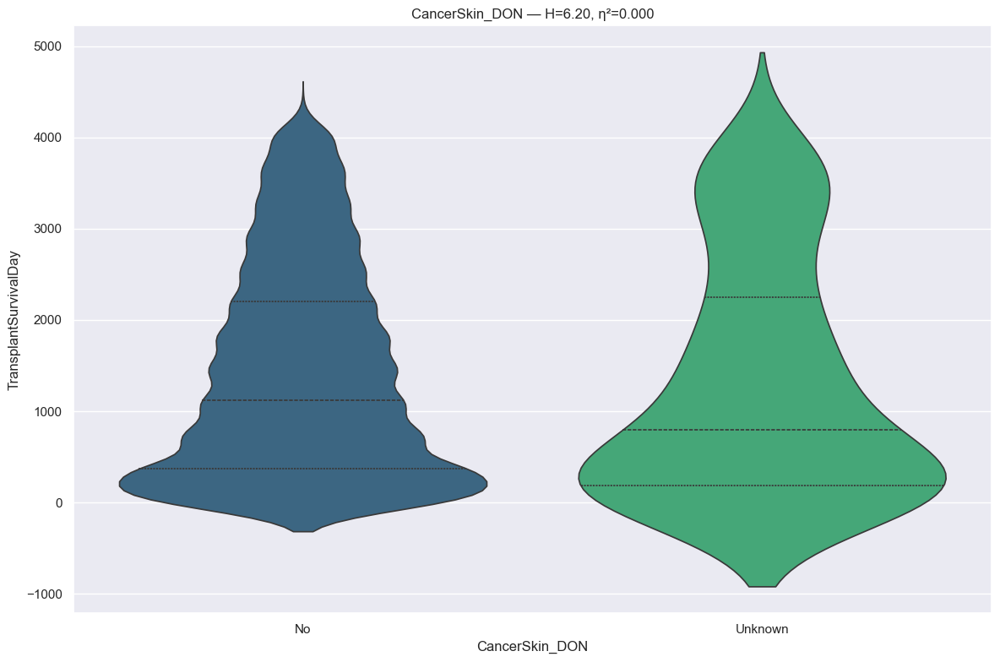

RANKING REPORT: CancerSkin_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21170 records
 * Unknown                                           :    181 records
BYPASSED CATEGORIES (n < min_n):
 * Yes                                               :     15 records
--------------------------------------------------------------------------------
Kruskal H: 6.1976 | P-value: 1.279260e-02 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.2793e-02 | thr=0.0500 | r=-0.107 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Other (1 categories)
  - Yes

CancerSkin_DON  mean_survival_days  median_survival_da

In [156]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [157]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Serology Anti CMV
* Serology Anti-CMV tests detect IgG and IgM antibodies to diagnose current, past, or reactivated Cytomegalovirus (CMV) infection. Typically measured by ELISA, IgM indicates recent infection, while IgG indicates past or latent infection and immunity. These tests are crucial for pregnant women, immunocompromised individuals, and transplant candidates

In [158]:
# info
feature = u.get_feature_info(df, 'SerologyAntiCMV', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique       top   freq
SerologyAntiCMV_DON  21366      5  Positive  12478

:::: NaN Count:
SerologyAntiCMV_DON    0 



{'SerologyAntiCMV_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Positive',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

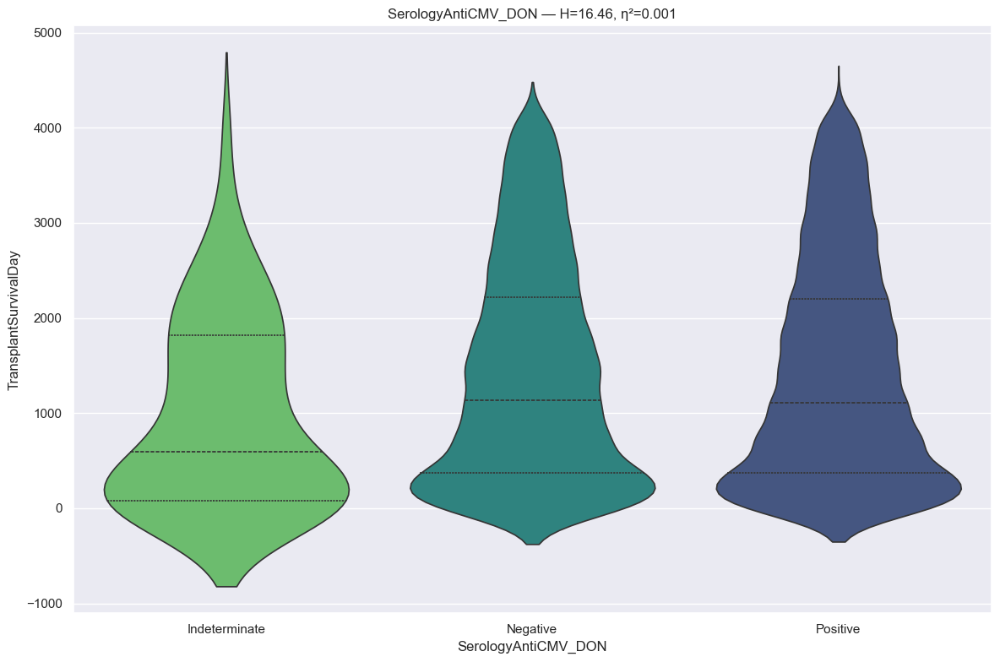

RANKING REPORT: SerologyAntiCMV_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     79 records
 * Negative                                          :   8787 records
 * Positive                                          :  12478 records
BYPASSED CATEGORIES (n < min_n):
 * Not Done                                          :     15 records
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 16.4559 | P-value: 2.670837e-04 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Indeterminate vs Negative     | p=5.3157e-05 | thr=0.0167 | r= 0.264 | *Sig*
Indeterminate vs Positive     | p=6.8238e-05 | thr=0.0167 | r= 0.260 | *Sig*
Negative     vs Positive     | p=5.5866e-01 | thr=0.0167 | r=-0.005 | Not Sig


In [159]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [160]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: SerologyAntiCMV_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     79 records
 * Negative                                          :   8787 records
 * Positive                                          :  12478 records
BYPASSED CATEGORIES (n < min_n):
 * Not Done                                          :     15 records
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 16.4559 | P-value: 2.670837e-04 | Effect η²: 0.0007
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Indeterminate

>>> Gr

In [161]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cause Of Death

In [162]:
# info
feature = u.get_feature_info(df, 'CauseOfDeath', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique          top   freq
CauseOfDeath_DON  21366      6  HEAD TRAUMA  11588

:::: NaN Count:
CauseOfDeath_DON    0 



{'CauseOfDeath_DON': CategoricalDtype(categories=['ANOXIA', 'CEREBROVASCULAR/STROKE', 'CNS TUMOR',
                   'HEAD TRAUMA', 'OTHER SPECIFY', 'Unknown'],
 , ordered=False, categories_dtype=str)}

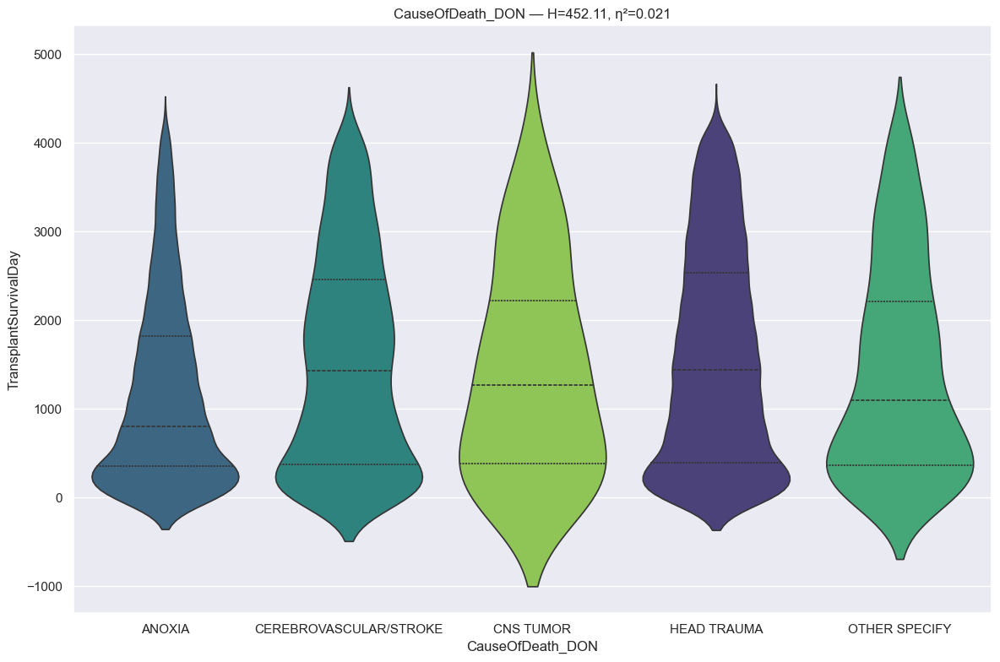

RANKING REPORT: CauseOfDeath_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * ANOXIA                                            :   6637 records
 * CEREBROVASCULAR/STROKE                            :   2611 records
 * CNS TUMOR                                         :     72 records
 * HEAD TRAUMA                                       :  11588 records
 * OTHER SPECIFY                                     :    455 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      3 records
--------------------------------------------------------------------------------
Kruskal H: 452.1121 | P-value: 1.517881e-96 | Effect η²: 0.0210
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
ANOXIA       vs HEAD TRAUMA  | p=2.3688e-97 | thr=0.0050 | r= 0.186 | *Sig*
ANOXIA       vs CEREBROVASCULAR/STROKE | p=7.7186e-35 | thr=0.0050 | r= 0.164 | *Sig*
AN

In [163]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [164]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CauseOfDeath_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * ANOXIA                                            :   6637 records
 * CEREBROVASCULAR/STROKE                            :   2611 records
 * CNS TUMOR                                         :     72 records
 * HEAD TRAUMA                                       :  11588 records
 * OTHER SPECIFY                                     :    455 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      3 records
--------------------------------------------------------------------------------
Kruskal H: 452.1121 | P-value: 1.517881e-96 | Effect η²: 0.0210
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
ANOXIA       vs HEAD TRAUMA  | p=2.3688e-97 | thr=0.0050 | r= 0.186 | *Sig*
ANOXIA       vs CEREBROVASCULAR/STROKE | p=7.7186e-35 | thr=0.0056 | r= 0.164 | *Sig*
A

In [165]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CauseOfDeath_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * ANOXIA                                            :   6637 records
 * CEREBROVASCULAR/STROKE                            :   2611 records
 * CNS TUMOR                                         :     72 records
 * HEAD TRAUMA                                       :  11588 records
 * OTHER SPECIFY                                     :    455 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      3 records
--------------------------------------------------------------------------------
Kruskal H: 452.1121 | P-value: 1.517881e-96 | Effect η²: 0.0210
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
ANOXIA       vs HEAD TRAUMA  | p=2.3688e-97 | fdr_alpha=0.05 | r= 0.186 | *Sig*
ANOXIA       vs CEREBROVASCULAR/STROKE | p=7.7186e-35 | fdr_alpha=0.05 | r= 0.164 | *

In [166]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Synthetic AntiDiuretic Hormone
* Synthetic Antidiuretic Hormone (ADH), or vasopressin, mimics the natural hormone to manage body water balance by increasing water reabsorption in the kidneys. Common synthetic forms include vasopressin and desmopressin (DDAVP), which are used to treat diabetes insipidus, nocturnal enuresis, and low blood pressure. These drugs are essential to maintain fluid homeostasis, often administered intravenously or intranasally.

In [167]:
# info
feature = u.get_feature_info(df, 'SyntheticAntiDiureticHormone', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                  count unique top   freq
SyntheticAntiDiureticHormone_DON  21366      3  No  18256

:::: NaN Count:
SyntheticAntiDiureticHormone_DON    0 



{'SyntheticAntiDiureticHormone_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

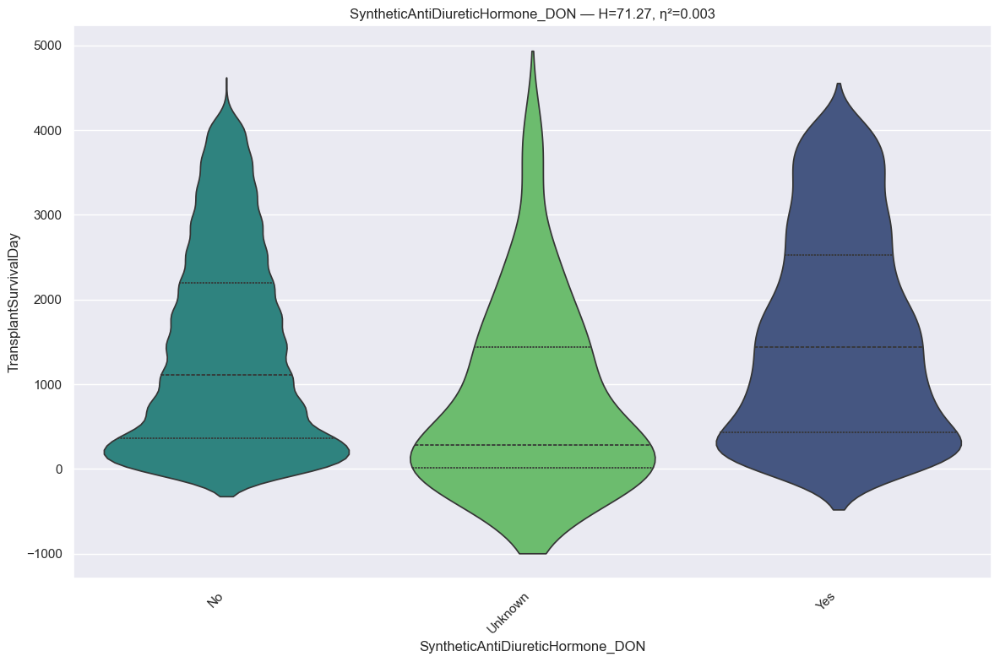

RANKING REPORT: SyntheticAntiDiureticHormone_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  18256 records
 * Unknown                                           :     42 records
 * Yes                                               :   3068 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 71.2720 | P-value: 3.337938e-16 | Effect η²: 0.0032
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes

SyntheticAntiDiureticHormone_DON  mean_survival_days  median_survival_days  

In [168]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [169]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Death Circumstance

In [170]:
# info
feature = u.get_feature_info(df, 'DeathCircumstance', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique  top  freq
DeathCircumstance_DON  21366      7  MVA  5077

:::: NaN Count:
DeathCircumstance_DON    0 



{'DeathCircumstance_DON': CategoricalDtype(categories=['Accident, Non-MVA', 'CHILD-ABUSE',
                   'DEATH FROM NATURAL CAUSES', 'HOMICIDE', 'MVA',
                   'NONE OF THE ABOVE', 'SUICIDE', 'Unknown'],
 , ordered=False, categories_dtype=str)}

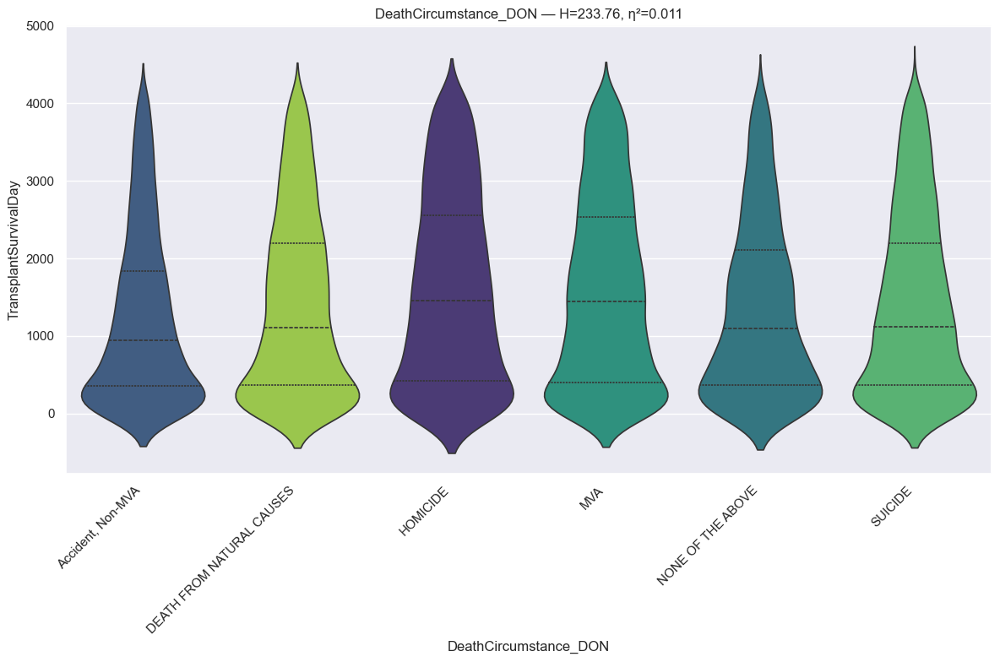

RANKING REPORT: DeathCircumstance_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Accident, Non-MVA                                 :   3811 records
 * DEATH FROM NATURAL CAUSES                         :   3767 records
 * HOMICIDE                                          :   2421 records
 * MVA                                               :   5077 records
 * NONE OF THE ABOVE                                 :   2362 records
 * SUICIDE                                           :   3921 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 233.7555 | P-value: 1.675552e-48 | Effect η²: 0.0107
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Accident, Non-MVA vs MVA          | p=1.2679e-39 | thr=0.0033 | r= 0.163 | *Sig*
Accident

In [171]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [172]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DeathCircumstance_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Accident, Non-MVA                                 :   3811 records
 * DEATH FROM NATURAL CAUSES                         :   3767 records
 * HOMICIDE                                          :   2421 records
 * MVA                                               :   5077 records
 * NONE OF THE ABOVE                                 :   2362 records
 * SUICIDE                                           :   3921 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 233.7555 | P-value: 1.675552e-48 | Effect η²: 0.0107
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
Accident, Non-MVA vs MVA          | p=1.2679e-39 | thr=0.0033 | r= 0.163 | *Sig*
Acciden

In [173]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Death Mechanism

In [174]:
# info
feature = u.get_feature_info(df, 'DeathMechanism', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique           top  freq
DeathMechanism_DON  21366     13  BLUNT INJURY  6755

:::: NaN Count:
DeathMechanism_DON    0 



{'DeathMechanism_DON': CategoricalDtype(categories=['ASPHYXIATION', 'BLUNT INJURY', 'CARDIOVASCULAR',
                   'DEATH FROM NATURAL CAUSES', 'DROWNING', 'DRUG INTOXICATION',
                   'ELECTRICAL', 'GUNSHOT WOUND',
                   'INTRACRANIAL HEMORRHAGE/STROKE', 'NONE OF THE ABOVE',
                   'SEIZURE', 'STAB', 'Unknwn'],
 , ordered=False, categories_dtype=str)}

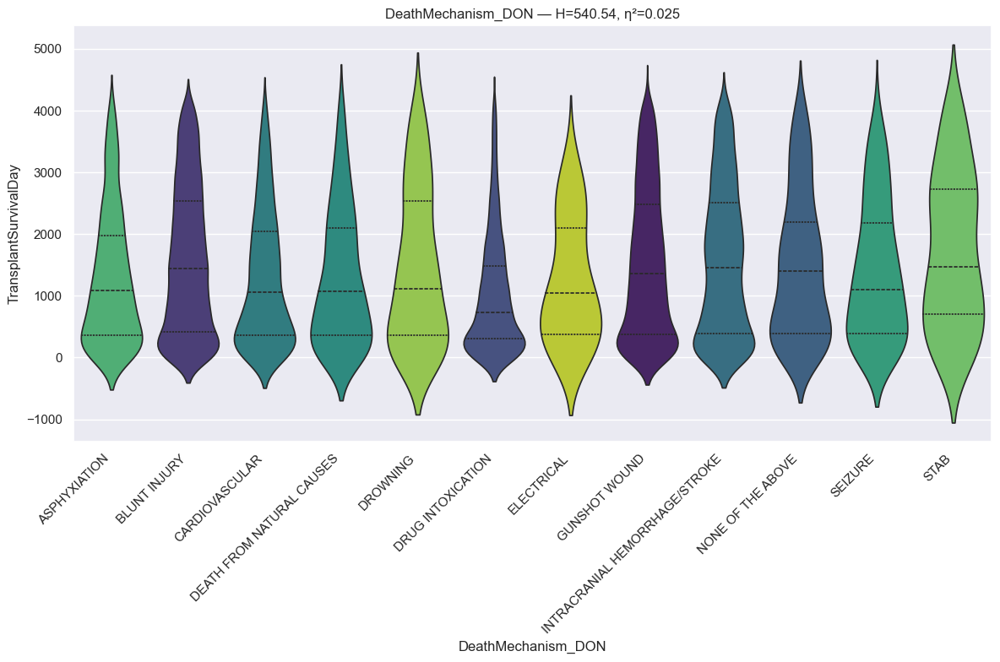

RANKING REPORT: DeathMechanism_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * ASPHYXIATION                                      :   1236 records
 * BLUNT INJURY                                      :   6755 records
 * CARDIOVASCULAR                                    :   1535 records
 * DEATH FROM NATURAL CAUSES                         :    293 records
 * DROWNING                                          :    135 records
 * DRUG INTOXICATION                                 :   3167 records
 * ELECTRICAL                                        :     38 records
 * GUNSHOT WOUND                                     :   4728 records
 * INTRACRANIAL HEMORRHAGE/STROKE                    :   2896 records
 * NONE OF THE ABOVE                                 :    339 records
 * SEIZURE                                           :    166 records
 * STAB                                              :     73 records
BYPASSED CATEGORIES (n < min_n):
 * Unknwn                                            :      5 

In [175]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [176]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DeathMechanism_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * ASPHYXIATION                                      :   1236 records
 * BLUNT INJURY                                      :   6755 records
 * CARDIOVASCULAR                                    :   1535 records
 * DEATH FROM NATURAL CAUSES                         :    293 records
 * DROWNING                                          :    135 records
 * DRUG INTOXICATION                                 :   3167 records
 * ELECTRICAL                                        :     38 records
 * GUNSHOT WOUND                                     :   4728 records
 * INTRACRANIAL HEMORRHAGE/STROKE                    :   2896 records
 * NONE OF THE ABOVE                                 :    339 records
 * SEIZURE                                           :    166 records
 * STAB                                              :     73 records
BYPASSED CATEGORIES (n < min_n):
 * Unknwn                                            :      5 

In [177]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Heparin Management
* Heparin is a fast-acting, injectable anticoagulant ("blood thinner") used to treat or prevent blood clots in conditions like deep vein thrombosis (DVT), pulmonary embolism, and atrial fibrillation. It works by inhibiting coagulation factors, with intravenous (IV) administration taking effect immediately and subcutaneous injections taking 1-2 hours to take effect. Major risks include bleeding, skin irritation, and rare HIT syndrome. 

In [178]:
# info
feature = u.get_feature_info(df, 'HeparinManagement', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique  top   freq
HeparinManagement_DON  21366      3  Yes  20957

:::: NaN Count:
HeparinManagement_DON    0 



{'HeparinManagement_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

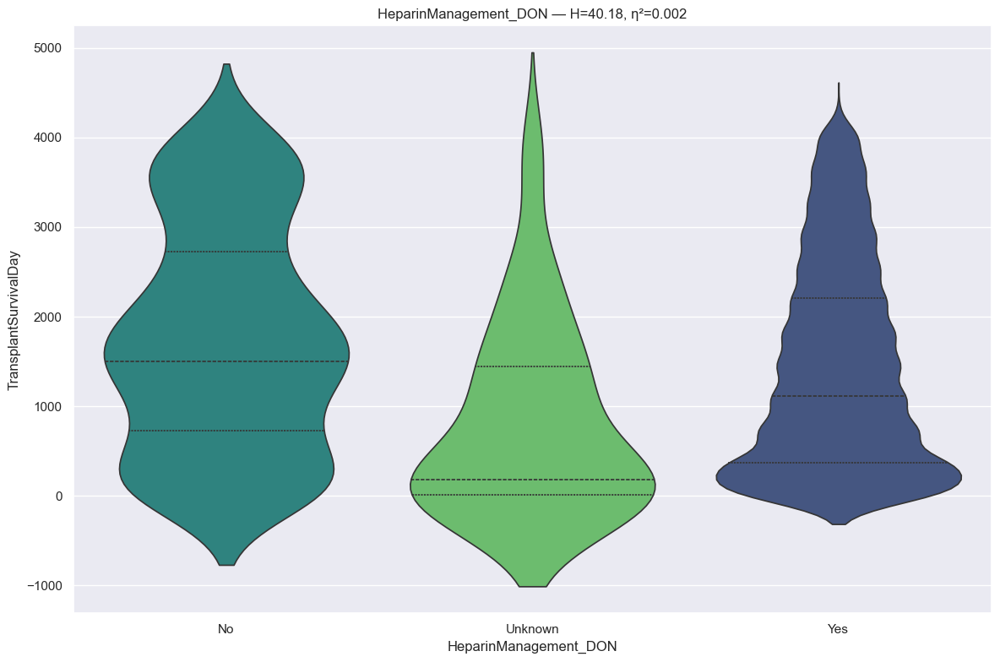

RANKING REPORT: HeparinManagement_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :    368 records
 * Unknown                                           :     41 records
 * Yes                                               :  20957 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 40.1772 | P-value: 1.886384e-09 | Effect η²: 0.0018
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=6.1799e-07 | thr=0.0167 | r=-0.475 | *Sig*
No           vs Yes          | p=3.1196e-06 | thr=0.0167 | r=-0.142 | *Sig*
Unknown      vs Yes          | p=1.8658e-05 | thr=0.0167 | r= 0.386 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_

In [179]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [180]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Arginnie Management
* L-arginine is an amino acid used to manage cardiovascular conditions like high blood pressure, angina, and erectile dysfunction by promoting vasodilation (widening of blood vessels) via nitric oxide production. Generally safe, daily doses often range from 2.5 to 9 grams, with potential benefits for metabolic health, wound healing, and immune support, though long-term efficacy is not fully established.

In [181]:
# info
feature = u.get_feature_info(df, 'ArginnieManagement', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique  top   freq
ArginnieManagement_DON  21366      3  Yes  14911

:::: NaN Count:
ArginnieManagement_DON    0 



{'ArginnieManagement_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

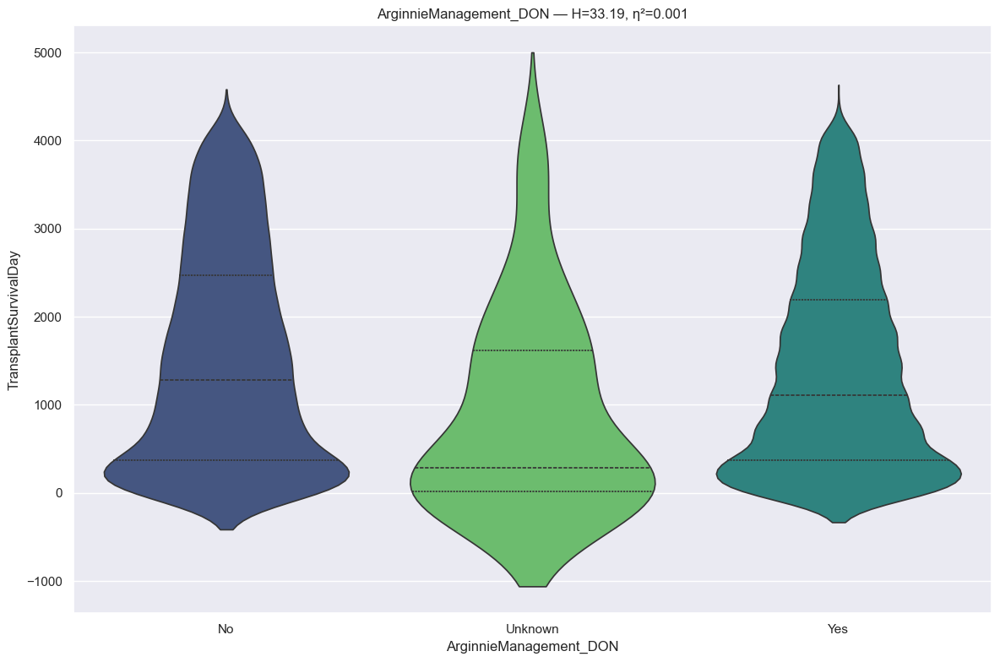

RANKING REPORT: ArginnieManagement_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6411 records
 * Unknown                                           :     44 records
 * Yes                                               :  14911 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 33.1860 | P-value: 6.219474e-08 | Effect η²: 0.0015
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.5818e-05 | thr=0.0167 | r=-0.036 | *Sig*
No           vs Unknown      | p=3.5597e-05 | thr=0.0167 | r=-0.361 | *Sig*
Unknown      vs Yes          | p=1.1971e-04 | thr=0.0167 | r= 0.335 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [182]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [183]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Insulin Management
* Insulin management involves matching insulin type and dosage to blood sugar levels, diet, and activity, typically using a basal-bolus regimen (long-acting for background, rapid-acting for meals) via pens, syringes, or pumps. Effective management requires regular glucose monitoring to adjust doses, prevent hypoglycemia, and reduce complications.

In [184]:
# info
feature = u.get_feature_info(df, 'InsulinManagement', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique  top   freq
InsulinManagement_DON  21366      3  Yes  12257

:::: NaN Count:
InsulinManagement_DON    0 



{'InsulinManagement_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

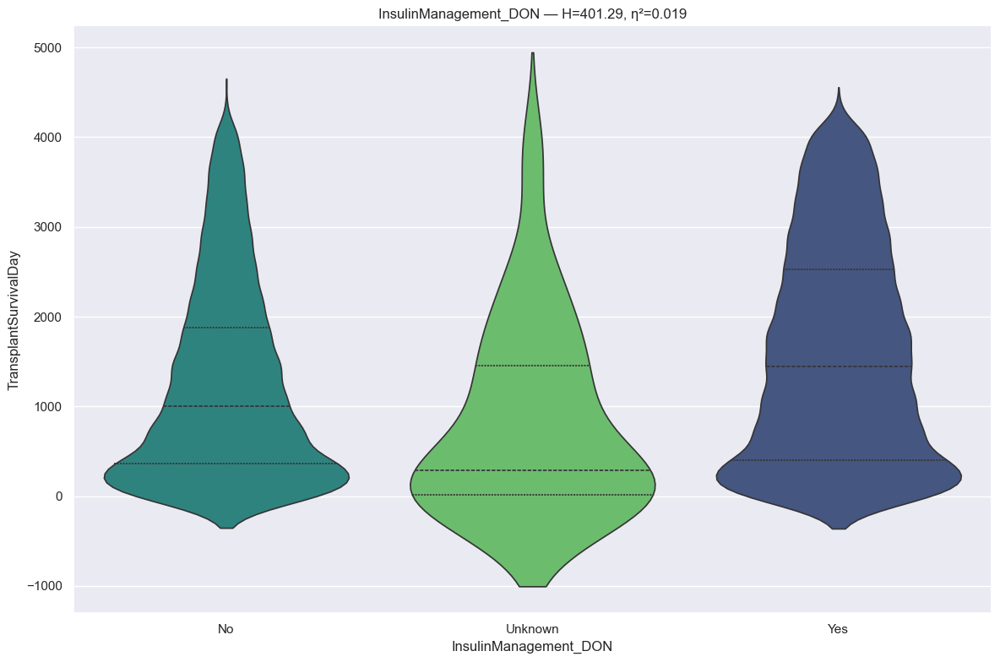

RANKING REPORT: InsulinManagement_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   9067 records
 * Unknown                                           :     42 records
 * Yes                                               :  12257 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 401.2940 | P-value: 7.246243e-88 | Effect η²: 0.0187
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.5878e-85 | thr=0.0167 | r= 0.157 | *Sig*
Unknown      vs Yes          | p=2.4013e-06 | thr=0.0167 | r= 0.421 | *Sig*
No           vs Unknown      | p=4.7441e-04 | thr=0.0167 | r=-0.312 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [185]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [186]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HBV NAT Result
* HBV NAT (Nucleic Acid Testing) for identifying Hepatitis B virus DNA in blood, plasma, or organs. A positive NAT result indicates the presence of HBV DNA, signaling active infection (often during the window period before antibodies appear). 

In [187]:
# info
feature = u.get_feature_info(df, 'HBV_NAT_Result', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique       top   freq
HBV_NAT_Result_DON  21366      4  Negative  13910

:::: NaN Count:
HBV_NAT_Result_DON    0 



{'HBV_NAT_Result_DON': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

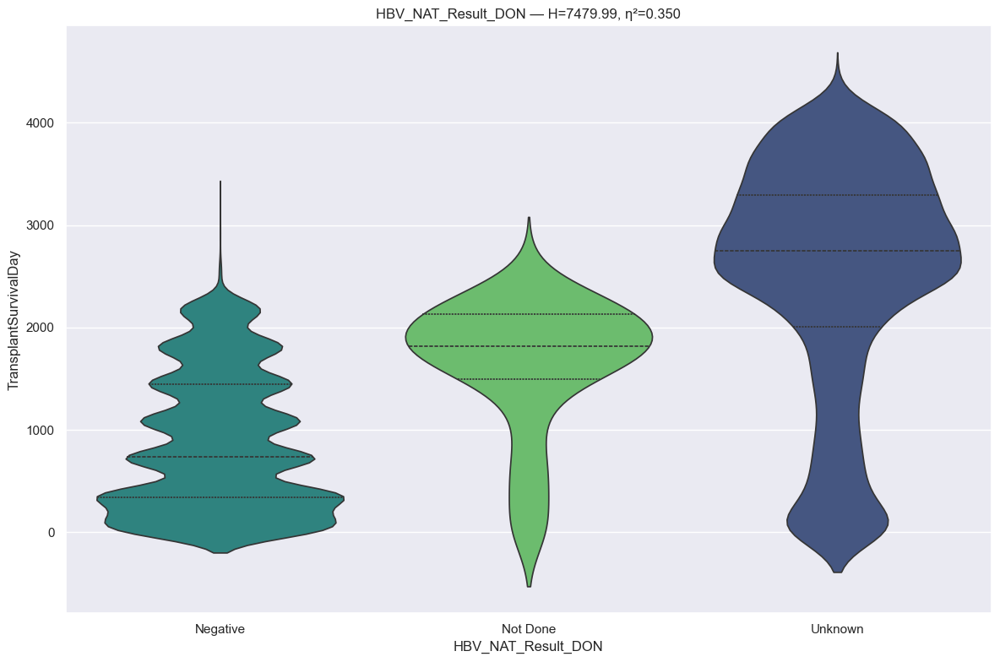

RANKING REPORT: HBV_NAT_Result_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  13910 records
 * Not Done                                          :     75 records
 * Unknown                                           :   7369 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :     12 records
--------------------------------------------------------------------------------
Kruskal H: 7479.9889 | P-value: 0.000000e+00 | Effect η²: 0.3502
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.718 | *Sig*
Negative     vs Not Done     | p=1.1614e-18 | thr=0.0167 | r= 0.589 | *Sig*
Not Done     vs Unknown      | p=6.1881e-17 | thr=0.0167 | r= 0.560 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

::::::::::::::::

In [188]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [189]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HCV NAT Result
* An HCV NAT (Nucleic Acid Test/PCR) result confirms active hepatitis C infection by detecting the virus's genetic material (RNA). A positive result means current infection (usually 1-2 weeks after exposure) requiring treatment. A negative result indicates no current virus in the blood (no active infection).

In [190]:
# info
feature = u.get_feature_info(df, 'HCV_NAT_Result', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique       top   freq
HCV_NAT_Result_DON  21366      5  Negative  13311

:::: NaN Count:
HCV_NAT_Result_DON    0 



{'HCV_NAT_Result_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Positive',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

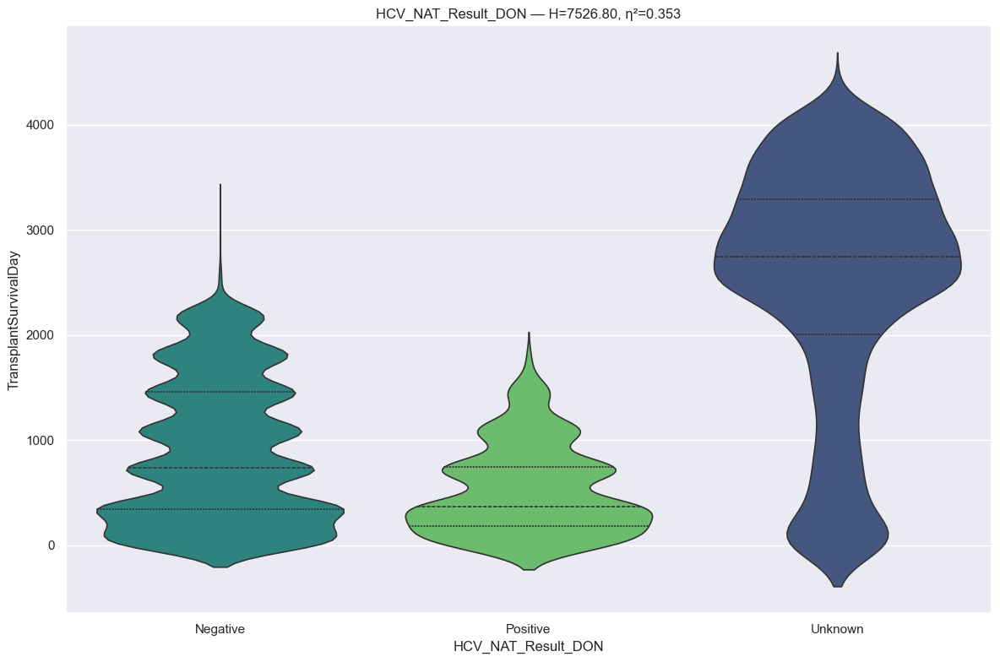

RANKING REPORT: HCV_NAT_Result_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  13311 records
 * Positive                                          :    671 records
 * Unknown                                           :   7367 records
BYPASSED CATEGORIES (n < min_n):
 * Indeterminate                                     :      1 records
 * Not Done                                          :     16 records
--------------------------------------------------------------------------------
Kruskal H: 7526.8003 | P-value: 0.000000e+00 | Effect η²: 0.3525
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.713 | *Sig*
Positive     vs Unknown      | p=3.5310e-249 | thr=0.0167 | r= 0.785 | *Sig*
Negative     vs Positive     | p=1.8737e-37 | thr=0.0167 | r=-0.292 | *Sig*
::

In [191]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [192]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: HCV_NAT_Result_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  13311 records
 * Positive                                          :    671 records
 * Unknown                                           :   7367 records
BYPASSED CATEGORIES (n < min_n):
 * Indeterminate                                     :      1 records
 * Not Done                                          :     16 records
--------------------------------------------------------------------------------
Kruskal H: 7526.8003 | P-value: 0.000000e+00 | Effect η²: 0.3525
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_

In [193]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV NAT Result
* An HIV Nucleic Acid Test (NAT) (or RNA test) detects the virus directly in the blood, often within 10–33 days of exposure. A negative result after the window period means you are likely not living with HIV. A positive NAT (often used for confirmation or early detection) detects the presence of the virus (viral load).

In [194]:
# info
feature = u.get_feature_info(df, 'HIV_NAT_Result', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique       top   freq
HIV_NAT_Result_DON  21366      3  Negative  13963

:::: NaN Count:
HIV_NAT_Result_DON    0 



{'HIV_NAT_Result_DON': CategoricalDtype(categories=['Negative', 'Not Done', 'Unknown'], ordered=False, categories_dtype=str)}

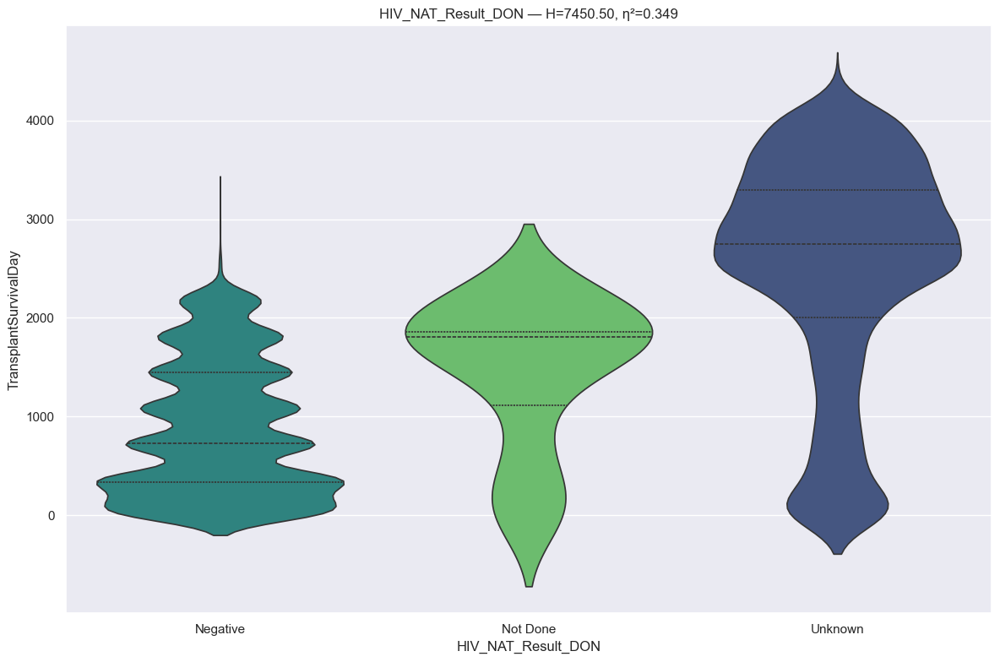

RANKING REPORT: HIV_NAT_Result_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :  13963 records
 * Not Done                                          :     36 records
 * Unknown                                           :   7367 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7450.4987 | P-value: 0.000000e+00 | Effect η²: 0.3487
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.717 | *Sig*
Not Done     vs Unknown      | p=3.8701e-10 | thr=0.0167 | r= 0.604 | *Sig*
Negative     vs Not Done     | p=2.8547e-06 | thr=0.0167 | r= 0.451 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [195]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [196]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Allocation Type

In [197]:
# info
feature = u.get_feature_info(df, 'AllocationType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique    top   freq
AllocationType_DON  21366      4  Local  11729

:::: NaN Count:
AllocationType_DON    0 



{'AllocationType_DON': CategoricalDtype(categories=['Foreign Donor', 'Local', 'National', 'Regional'], ordered=False, categories_dtype=str)}

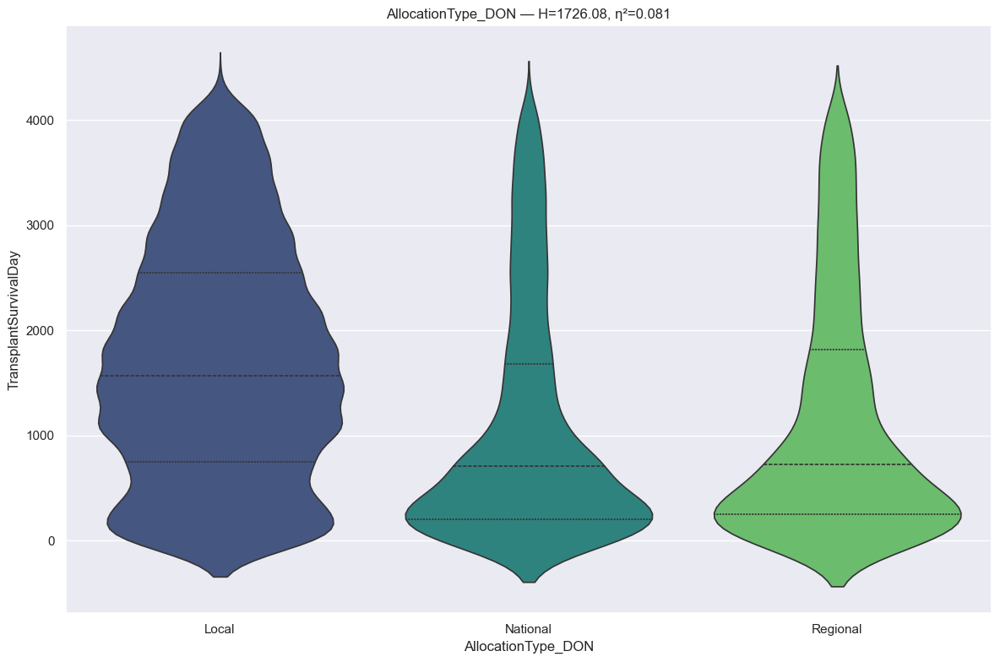

RANKING REPORT: AllocationType_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Local                                             :  11729 records
 * National                                          :   5746 records
 * Regional                                          :   3872 records
BYPASSED CATEGORIES (n < min_n):
 * Foreign Donor                                     :     19 records
--------------------------------------------------------------------------------
Kruskal H: 1726.0758 | P-value: 0.000000e+00 | Effect η²: 0.0808
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Local        vs National     | p=1.3079e-298 | thr=0.0167 | r=-0.343 | *Sig*
Local        vs Regional     | p=2.0956e-182 | thr=0.0167 | r=-0.308 | *Sig*
National     vs Regional     | p=8.0998e-03 | thr=0.0167 | r= 0.032 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

::::::::::::::

In [198]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [199]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Urine Protein
* Urine protein (proteinuria) is an excess of protein, usually albumin, in the urine, with normal levels being less than 150 mg per day. It is often a sign of kidney damage or disease (e.g., diabetes, high blood pressure). It is usually diagnosed via a urinalysis (dipstick or lab test) and often causes no symptoms early on, though foamy urine or swelling (edema) in hands/feet can occur.

In [200]:
# info
feature = u.get_feature_info(df, 'UrineProtein', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique top   freq
UrineProtein_DON  21366      3  No  11186

:::: NaN Count:
UrineProtein_DON    0 



{'UrineProtein_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

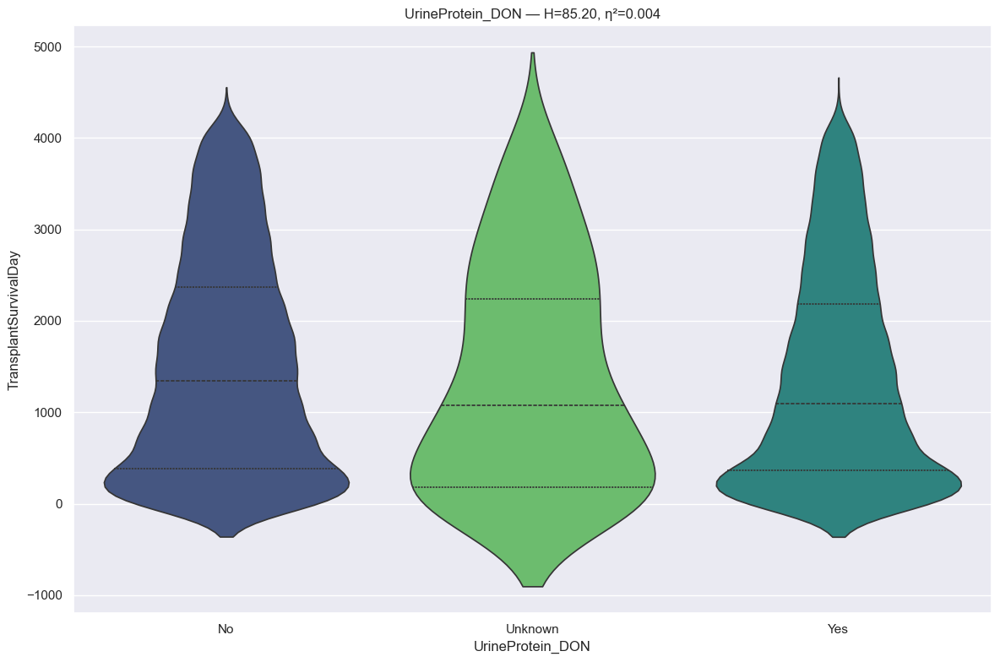

RANKING REPORT: UrineProtein_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  11186 records
 * Unknown                                           :    138 records
 * Yes                                               :  10042 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 85.1991 | P-value: 3.156774e-19 | Effect η²: 0.0039
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.3351e-20 | thr=0.0167 | r=-0.073 | *Sig*
No           vs Unknown      | p=6.9328e-02 | thr=0.0167 | r=-0.090 | Not Sig
Unknown      vs Yes          | p=5.7049e-01 | thr=0.0167 | r= 0.028 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [201]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [202]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: UrineProtein_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  11186 records
 * Unknown                                           :    138 records
 * Yes                                               :  10042 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 85.1991 | P-value: 3.156774e-19 | Effect η²: 0.0039
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (2 categories)
  - Unknown
  - Yes



In [203]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cardiac Arrest

In [204]:
# info
feature = u.get_feature_info(df, 'CardiacArrest', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique top   freq
CardiacArrest_DON  21366      3  No  19636

:::: NaN Count:
CardiacArrest_DON    0 



{'CardiacArrest_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

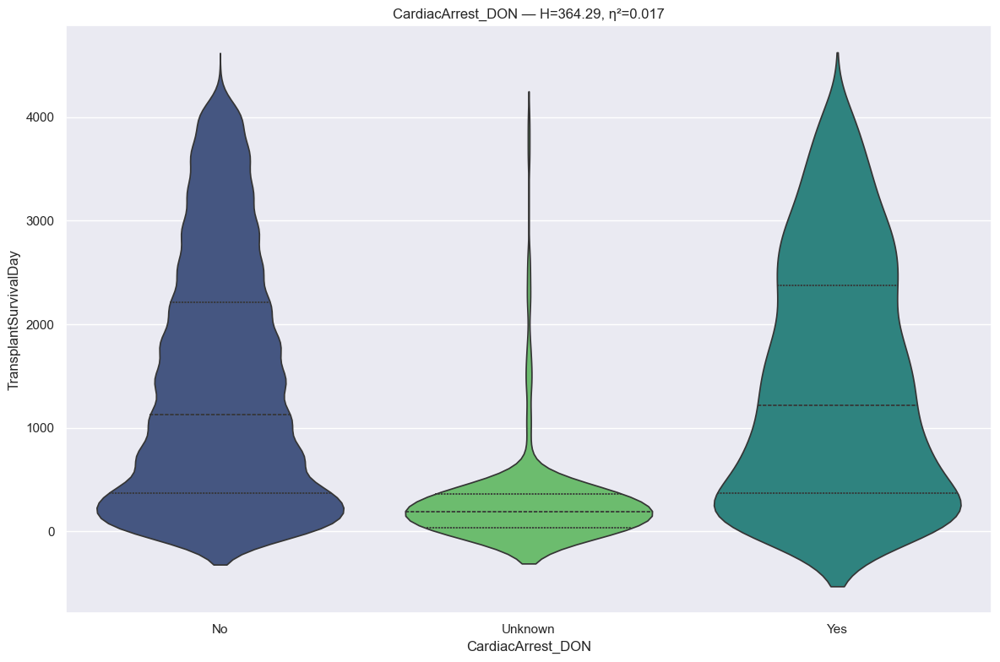

RANKING REPORT: CardiacArrest_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19636 records
 * Unknown                                           :    276 records
 * Yes                                               :   1454 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 364.2876 | P-value: 7.869769e-80 | Effect η²: 0.0170
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=2.3755e-81 | thr=0.0167 | r=-0.669 | *Sig*
Unknown      vs Yes          | p=1.0718e-66 | thr=0.0167 | r= 0.654 | *Sig*
No           vs Yes          | p=7.7494e-01 | thr=0.0167 | r=-0.004 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [205]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [206]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CardiacArrest_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19636 records
 * Unknown                                           :    276 records
 * Yes                                               :   1454 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 364.2876 | P-value: 7.869769e-80 | Effect η²: 0.0170
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [207]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Myocardial Infarction History

In [208]:
# info
feature = u.get_feature_info(df, 'MyocardialInfarctionHistory', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top   freq
MyocardialInfarctionHistory_DON  21366      3  No  21000

:::: NaN Count:
MyocardialInfarctionHistory_DON    0 



{'MyocardialInfarctionHistory_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

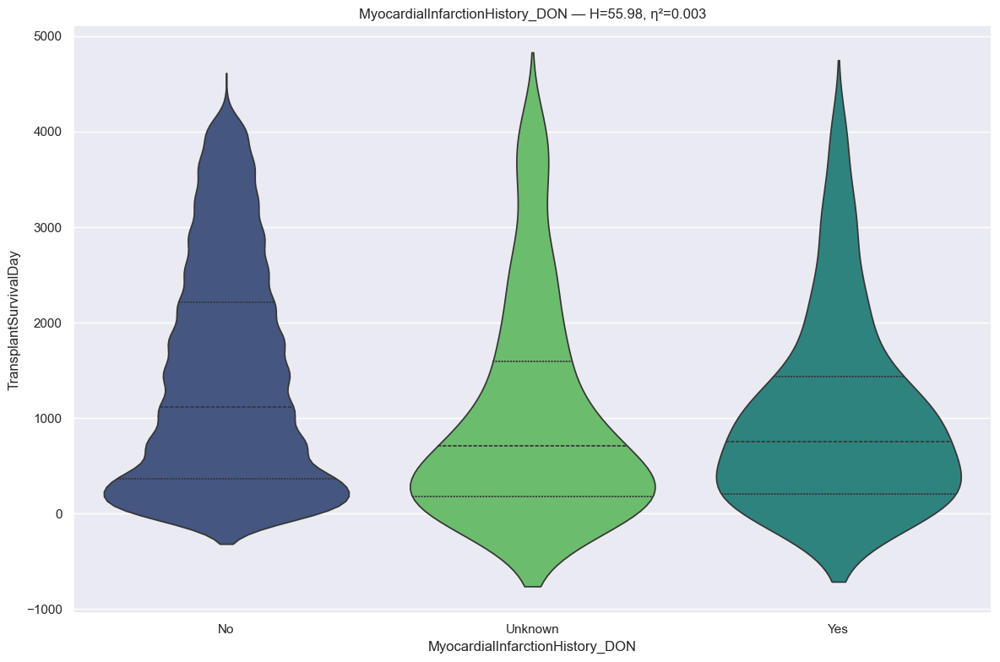

RANKING REPORT: MyocardialInfarctionHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21000 records
 * Unknown                                           :    213 records
 * Yes                                               :    153 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 55.9835 | P-value: 6.971542e-13 | Effect η²: 0.0025
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.0241e-09 | thr=0.0167 | r=-0.243 | *Sig*
No           vs Yes          | p=1.2111e-05 | thr=0.0167 | r=-0.205 | *Sig*
Unknown      vs Yes          | p=2.6749e-01 | thr=0.0167 | r= 0.068 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

In [209]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [210]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: MyocardialInfarctionHistory_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  21000 records
 * Unknown                                           :    213 records
 * Yes                                               :    153 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 55.9835 | P-value: 6.971542e-13 | Effect η²: 0.0025
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Group_3 (1 categories)
  - Yes



In [211]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### LV Ejection Fraction Medthod

In [212]:
# info
feature = u.get_feature_info(df, 'LV_EjectionFractionMedthod', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique   top   freq
LV_EjectionFractionMedthod_DON  21366      3  Echo  20918

:::: NaN Count:
LV_EjectionFractionMedthod_DON    0 



{'LV_EjectionFractionMedthod_DON': CategoricalDtype(categories=['Angiogram', 'Echo', 'Unknown'], ordered=False, categories_dtype=str)}

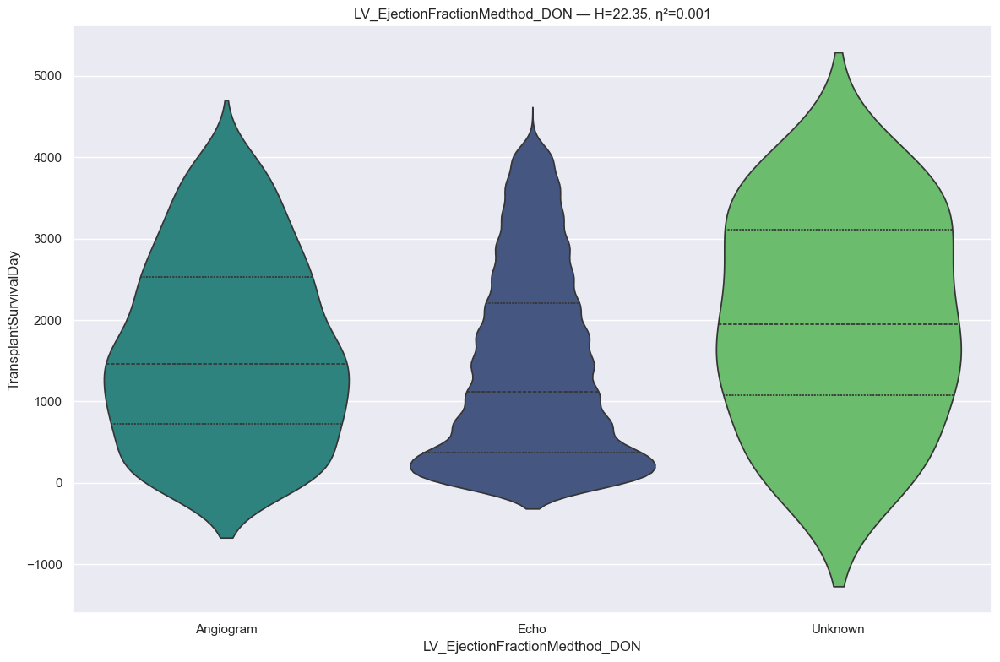

RANKING REPORT: LV_EjectionFractionMedthod_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Angiogram                                         :    418 records
 * Echo                                              :  20918 records
 * Unknown                                           :     30 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 22.3527 | P-value: 1.400163e-05 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Angiogram    vs Echo         | p=4.9796e-05 | thr=0.0167 | r=-0.116 | *Sig*
Echo         vs Unknown      | p=1.4395e-02 | thr=0.0167 | r= 0.258 | *Sig*
Angiogram    vs Unknown      | p=1.2711e-01 | thr=0.0167 | r= 0.167 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::


In [213]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [214]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Coronary Angiogram

In [215]:
# info
feature = u.get_feature_info(df, 'CoronaryAngiogram', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top   freq
CoronaryAngiogram_DON  21366      4  No  14115

:::: NaN Count:
CoronaryAngiogram_DON    0 



{'CoronaryAngiogram_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes, normal', 'Yes, not normal'], ordered=False, categories_dtype=str)}

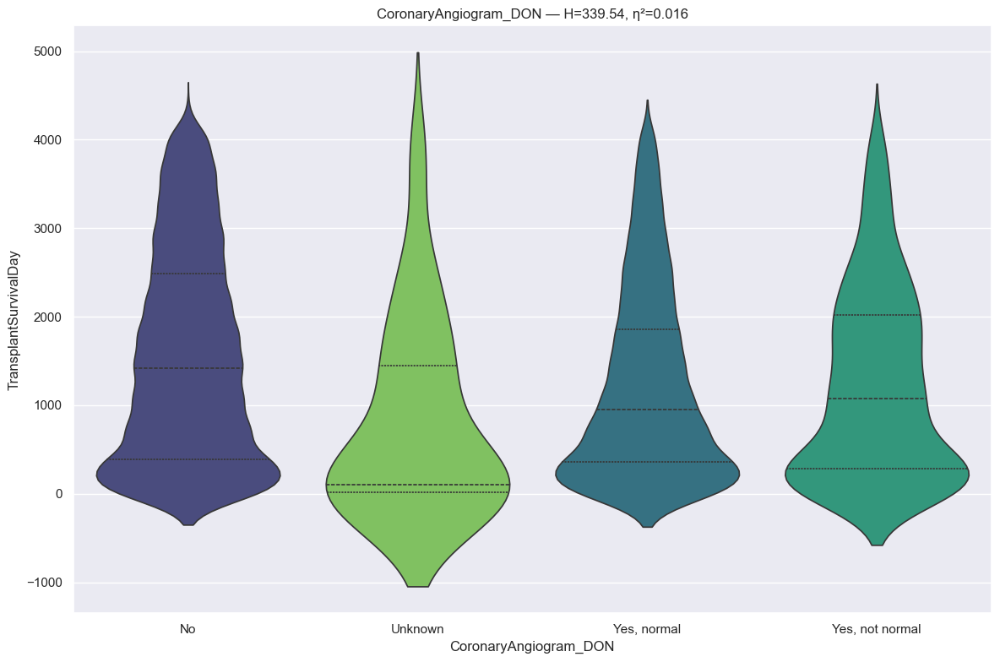

RANKING REPORT: CoronaryAngiogram_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14115 records
 * Unknown                                           :     39 records
 * Yes, normal                                       :   6509 records
 * Yes, not normal                                   :    703 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 339.5371 | P-value: 2.748600e-73 | Effect η²: 0.0158
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes, normal  | p=3.8490e-66 | thr=0.0083 | r=-0.149 | *Sig*
No           vs Yes, not normal | p=9.2054e-13 | thr=0.0083 | r=-0.159 | *Sig*
No           vs Unknown      | p=2.5454e-06 | thr=0.0083 | r=-0.436 | *Sig*
Unknown      vs Yes, normal  | p=2.3304e-04 | thr=0.0083 | r= 0.341 | *Sig*

In [216]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [217]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CoronaryAngiogram_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  14115 records
 * Unknown                                           :     39 records
 * Yes, normal                                       :   6509 records
 * Yes, not normal                                   :    703 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 339.5371 | P-value: 2.748600e-73 | Effect η²: 0.0158
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
No           vs Yes, normal  | p=3.8490e-66 | fdr_alpha=0.05 | r=-0.149 | *Sig*
No           vs Yes, not normal | p=9.2054e-13 | fdr_alpha=0.05 | r=-0.159 | *Sig*
No           vs Unknown      | p=2.5454e-06 | fdr_alpha=0.05 | r=-0.436 | *Sig*
Unknown      vs Yes, normal  | p=2.3304e-04 | fdr_alpha=0.05 | r

In [218]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Biopsy

In [219]:
# info
feature = u.get_feature_info(df, 'Biopsy', cat=False)
# dtype
{col: df[col].dtype for col in feature}

            count unique              top   freq
Biopsy_DON  21366      4  Biopsy not done  21303

:::: NaN Count:
Biopsy_DON    0 



{'Biopsy_DON': CategoricalDtype(categories=['Biopsy not done', 'Unknown', 'Yes, rejection confirmed',
                   'Yes, rejection not confirmed'],
 , ordered=False, categories_dtype=str)}

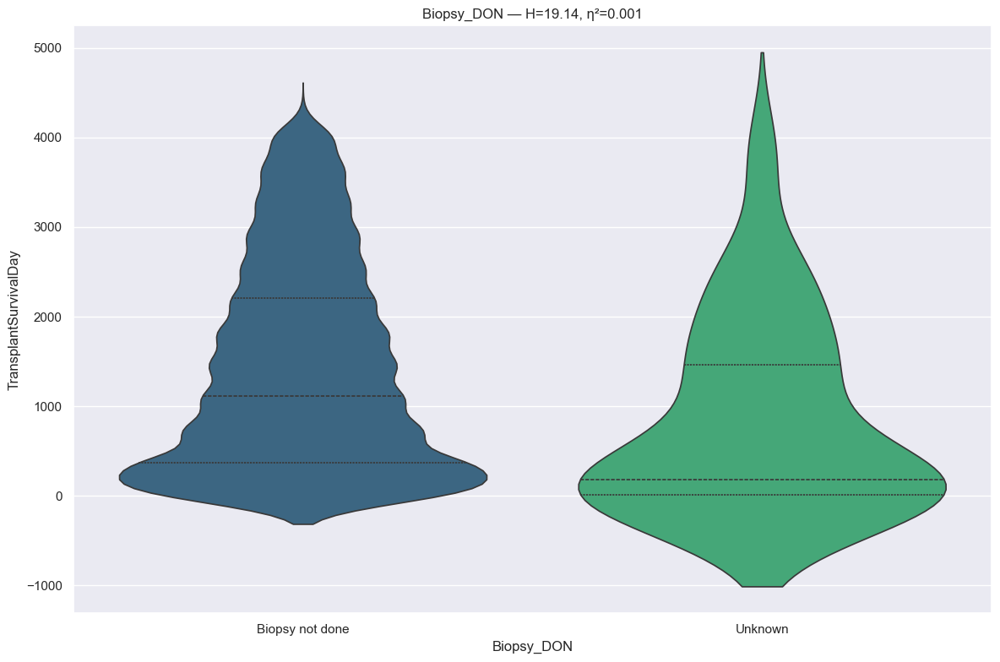

RANKING REPORT: Biopsy_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Biopsy not done                                   :  21303 records
 * Unknown                                           :     45 records
BYPASSED CATEGORIES (n < min_n):
 * Yes, rejection confirmed                          :      8 records
 * Yes, rejection not confirmed                      :     10 records
--------------------------------------------------------------------------------
Kruskal H: 19.1354 | P-value: 1.217674e-05 | Effect η²: 0.0008
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Biopsy not done vs Unknown      | p=1.2177e-05 | thr=0.0500 | r=-0.377 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Biopsy not done

>>> Group_2 (1 categories)
  - Unknown

>>> O

In [220]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [221]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Biopsy_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Biopsy not done                                   :  21303 records
 * Unknown                                           :     45 records
BYPASSED CATEGORIES (n < min_n):
 * Yes, rejection confirmed                          :      8 records
 * Yes, rejection not confirmed                      :     10 records
--------------------------------------------------------------------------------
Kruskal H: 19.1354 | P-value: 1.217674e-05 | Effect η²: 0.0008
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Biopsy not done

>>> Group_2 (1 categories)
  - Unknown

>>> Other (2 categories)
  - Yes, rejection

In [222]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Tatoos

In [223]:
# info
feature = u.get_feature_info(df, 'Tatoos', cat=False)
# dtype
{col: df[col].dtype for col in feature}

            count unique  top   freq
Tatoos_DON  21366      3  Yes  11797

:::: NaN Count:
Tatoos_DON    0 



{'Tatoos_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

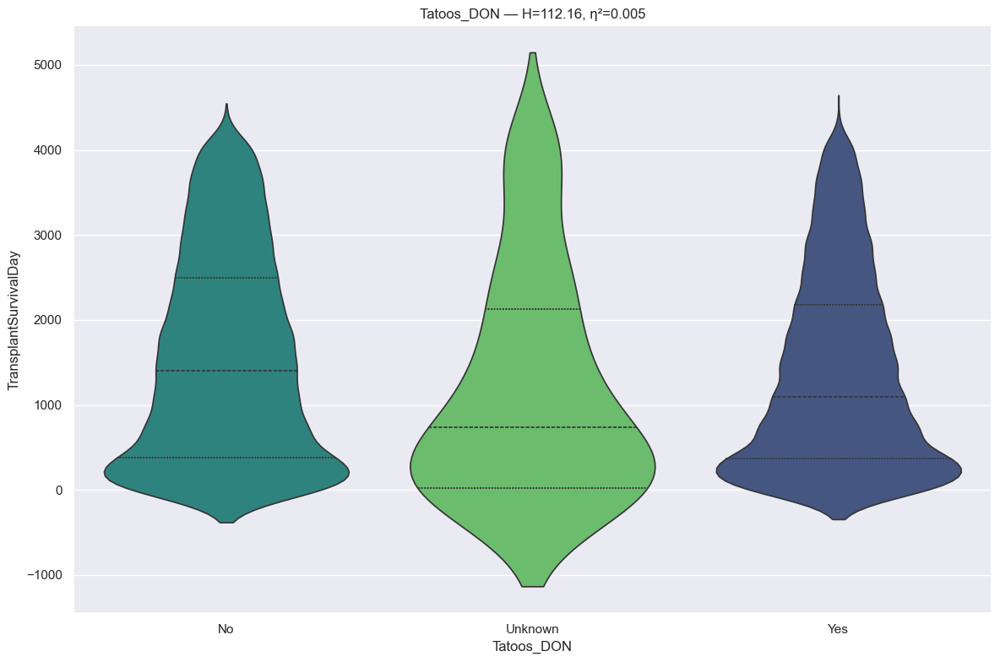

RANKING REPORT: Tatoos_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   9503 records
 * Unknown                                           :     66 records
 * Yes                                               :  11797 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 112.1623 | P-value: 4.408179e-25 | Effect η²: 0.0052
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.0776e-24 | thr=0.0167 | r=-0.082 | *Sig*
No           vs Unknown      | p=1.8044e-03 | thr=0.0167 | r=-0.223 | *Sig*
Unknown      vs Yes          | p=2.2269e-02 | thr=0.0167 | r= 0.163 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 cat

In [224]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [225]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antibody Result HBSAB
* A positive or reactive HBsAb (Hepatitis B surface antibody) test indicates immunity to Hepatitis B, resulting from either vaccination or recovery from a past infection. A level of 
 10 mIU/mL is typically considered protective against future infections. If negative, you may not be protected and may need to be vaccinated.

In [226]:
# info
feature = u.get_feature_info(df, 'AntibodyResultHBSAB', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique       top   freq
AntibodyResultHBSAB_DON  21366      5  Not Done  17985

:::: NaN Count:
AntibodyResultHBSAB_DON    0 



{'AntibodyResultHBSAB_DON': CategoricalDtype(categories=['Cannot Disclose', 'Indeterminate', 'Negative', 'Not Done',
                   'Positive', 'Unknown'],
 , ordered=False, categories_dtype=str)}

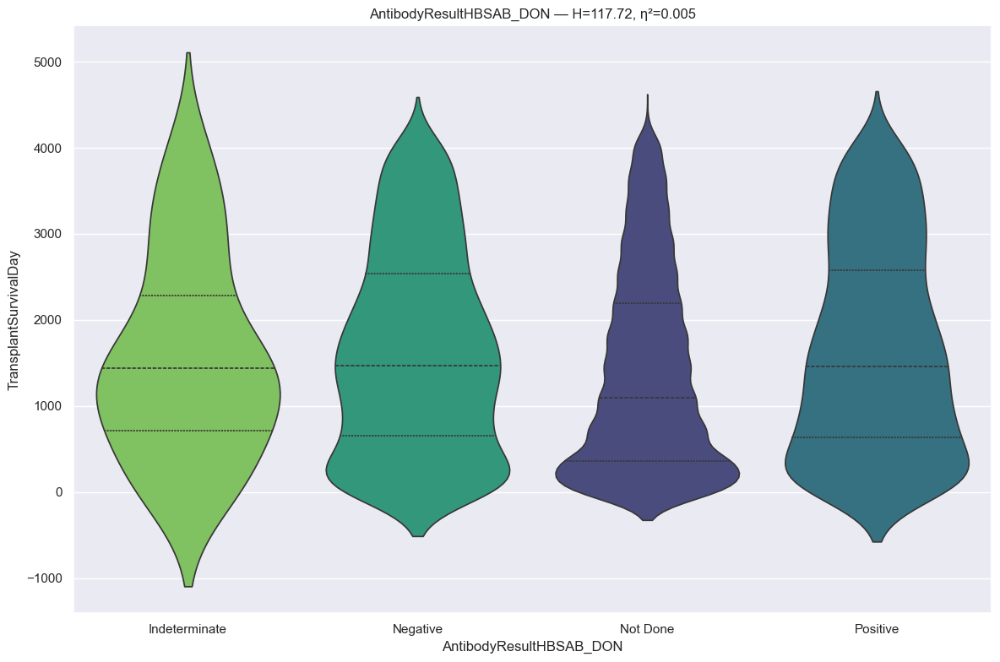

RANKING REPORT: AntibodyResultHBSAB_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     40 records
 * Negative                                          :   1998 records
 * Not Done                                          :  17985 records
 * Positive                                          :   1319 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     24 records
--------------------------------------------------------------------------------
Kruskal H: 117.7215 | P-value: 2.388462e-25 | Effect η²: 0.0054
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=1.1038e-17 | thr=0.0083 | r=-0.117 | *Sig*
Not Done     vs Positive     | p=2.8131e-13 | thr=0.0083 | r= 0.120 | *Sig*
Indeterminate vs Not Done     | p=3.3034e-01 | thr=0.0083 | r=-0.089 | Not 

In [227]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [228]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntibodyResultHBSAB_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     40 records
 * Negative                                          :   1998 records
 * Not Done                                          :  17985 records
 * Positive                                          :   1319 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     24 records
--------------------------------------------------------------------------------
Kruskal H: 117.7215 | P-value: 2.388462e-25 | Effect η²: 0.0054
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=1.1038e-17 | fdr_alpha=0.05 | r=-0.117 | *Sig*
Not Done     vs Positive     | p=2.8131e-13 | fdr_alpha=0.05 | r= 0.120 | *Sig*
Indeterminate vs Not Done     | p=3.3034e-01 | fdr_alpha=0.05 | r=-0

In [229]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Epstein-Barr IGG
* EBV IgG tests detect IgG-class antibodies to the Epstein-Barr virus (EBV), indicating either past infection, immunity, or recent infection, depending on the specific antigen (VCA or EBNA). Positive VCA-IgG and negative EBNA suggest recent infection, while positive EBNA-IgG usually indicates infection from months or years ago, as over 90% of adults are infected.

In [230]:
# info
feature = u.get_feature_info(df, 'EpsteinBarr_IGG', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique       top   freq
EpsteinBarr_IGG_DON  21366      6  Positive  18872

:::: NaN Count:
EpsteinBarr_IGG_DON    0 



{'EpsteinBarr_IGG_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Pending',
                   'Positive', 'Unknown'],
 , ordered=False, categories_dtype=str)}

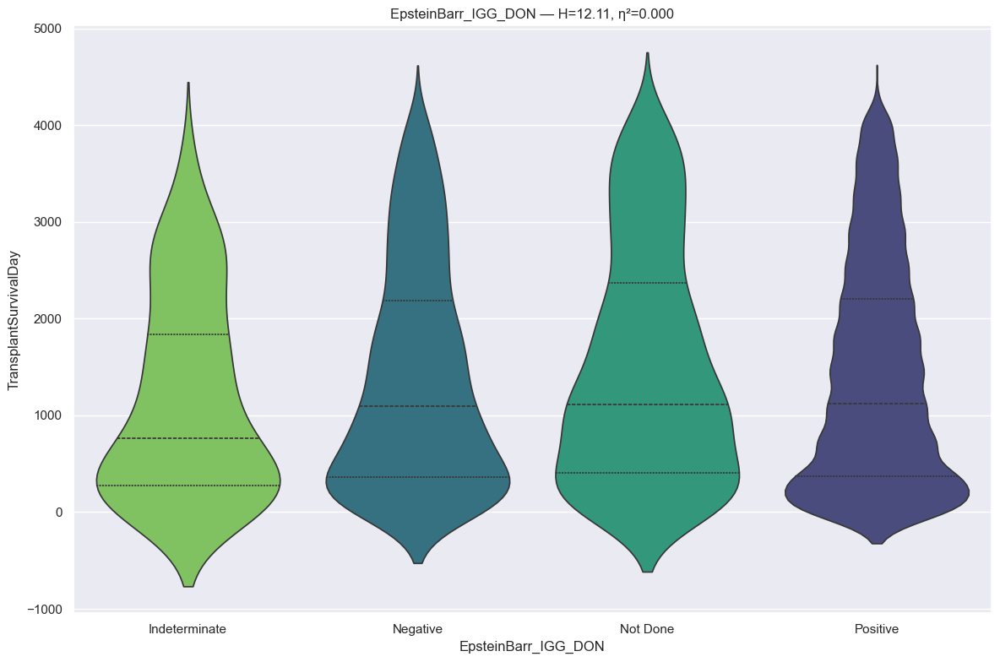

RANKING REPORT: EpsteinBarr_IGG_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :    135 records
 * Negative                                          :   1461 records
 * Not Done                                          :    878 records
 * Positive                                          :  18872 records
BYPASSED CATEGORIES (n < min_n):
 * Pending                                           :      2 records
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 12.1132 | P-value: 7.005230e-03 | Effect η²: 0.0004
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Indeterminate vs Not Done     | p=2.6852e-03 | thr=0.0083 | r= 0.160 | *Sig*
Negative     vs Not Done     | p=1.0177e-02 | thr=0.0083 | r= 0.063 | Not Sig
Indeter

In [231]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [232]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EpsteinBarr_IGG_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :    135 records
 * Negative                                          :   1461 records
 * Not Done                                          :    878 records
 * Positive                                          :  18872 records
BYPASSED CATEGORIES (n < min_n):
 * Pending                                           :      2 records
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 12.1132 | P-value: 7.005230e-03 | Effect η²: 0.0004
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
Indeterminate vs Not Done     | p=2.6852e-03 | fdr_alpha=0.05 | r= 0.160 | *Sig*
Negative     vs Not Done     | p=1.0177e-02 | fdr_alpha=0.05 | r= 0.063 | *Sig*
In

In [233]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Epstein-Barr IGM
* Epstein-Barr Virus (EBV) VCA IgM is a blood test detecting antibodies that appear early in an EBV infection, indicating a recent or acute primary infection. These antibodies usually disappear within 4 to 6 weeks but can last up to 3 months. A positive result often diagnoses infectious mononucleosis, which causes fatigue, fever, and swollen lymph nodes.

In [234]:
# info
feature = u.get_feature_info(df, 'EpsteinBarr_IGM', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique       top   freq
EpsteinBarr_IGM_DON  21366      6  Negative  17171

:::: NaN Count:
EpsteinBarr_IGM_DON    0 



{'EpsteinBarr_IGM_DON': CategoricalDtype(categories=['Indeterminate', 'Negative', 'Not Done', 'Pending',
                   'Positive', 'Unknown'],
 , ordered=False, categories_dtype=str)}

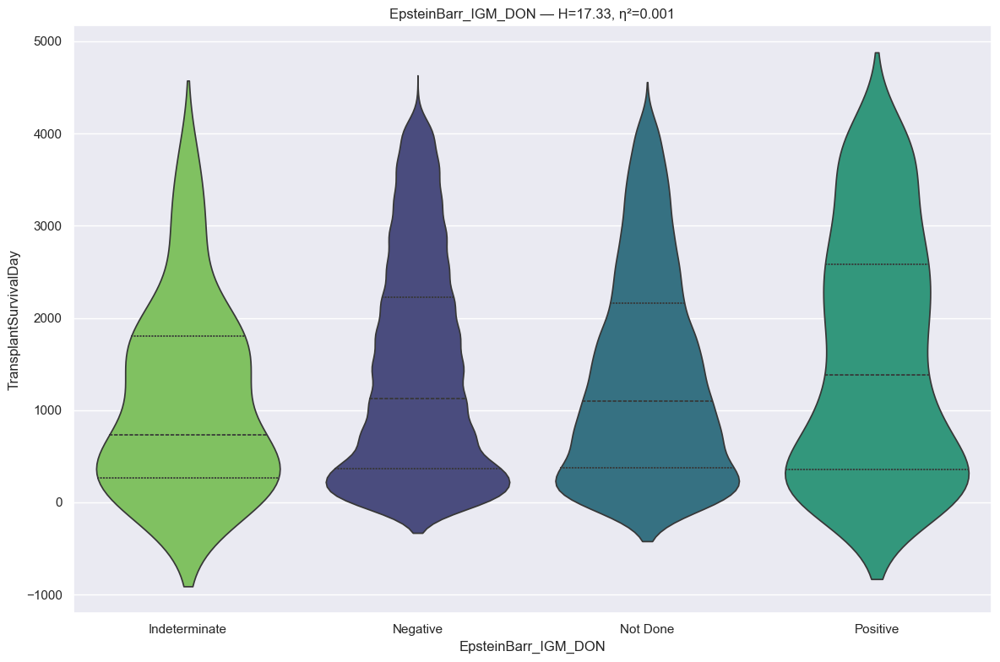

RANKING REPORT: EpsteinBarr_IGM_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     46 records
 * Negative                                          :  17171 records
 * Not Done                                          :   3828 records
 * Positive                                          :    297 records
BYPASSED CATEGORIES (n < min_n):
 * Pending                                           :      1 records
 * Unknown                                           :     23 records
--------------------------------------------------------------------------------
Kruskal H: 17.3276 | P-value: 6.051325e-04 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=4.7952e-04 | thr=0.0083 | r=-0.036 | *Sig*
Not Done     vs Positive     | p=2.9047e-02 | thr=0.0083 | r= 0.076 | Not Sig
Indeterm

In [235]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [236]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EpsteinBarr_IGM_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Indeterminate                                     :     46 records
 * Negative                                          :  17171 records
 * Not Done                                          :   3828 records
 * Positive                                          :    297 records
BYPASSED CATEGORIES (n < min_n):
 * Pending                                           :      1 records
 * Unknown                                           :     23 records
--------------------------------------------------------------------------------
Kruskal H: 17.3276 | P-value: 6.051325e-04 | Effect η²: 0.0007
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::

In [237]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV Risk

In [238]:
# info
feature = u.get_feature_info(df, 'HIV_Risk', cat=False)
# dtype
{col: df[col].dtype for col in feature}

              count unique top   freq
HIV_Risk_DON  21366      3  No  15700

:::: NaN Count:
HIV_Risk_DON    0 



{'HIV_Risk_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

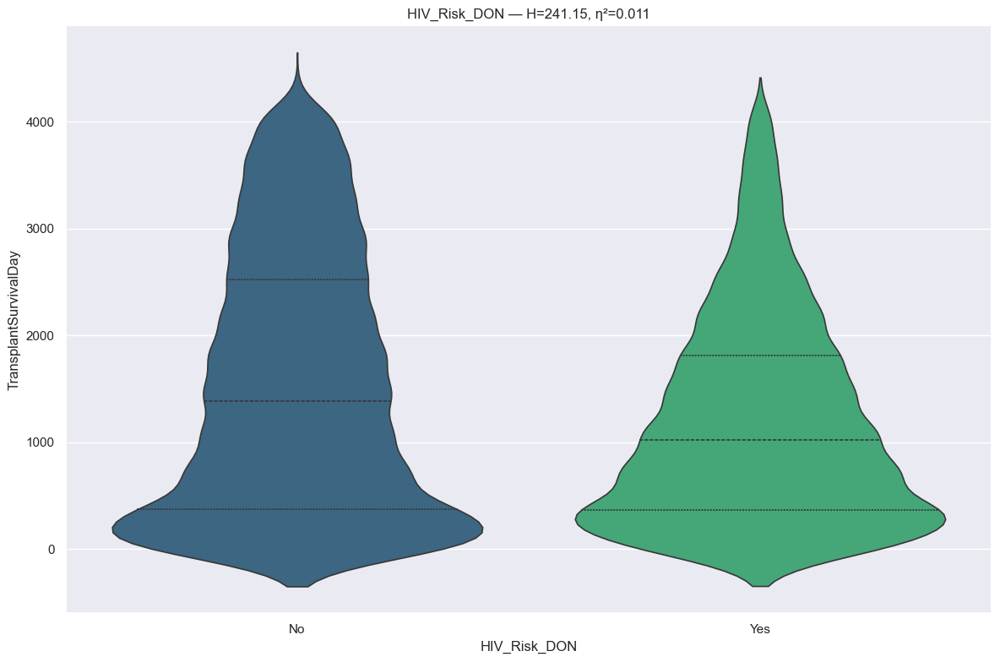

RANKING REPORT: HIV_Risk_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  15700 records
 * Yes                                               :   5654 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     12 records
--------------------------------------------------------------------------------
Kruskal H: 241.1534 | P-value: 2.203986e-54 | Effect η²: 0.0112
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.2040e-54 | thr=0.0500 | r=-0.139 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

HIV_Risk_DON  mean_survival_days  median_survival_days

In [239]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [240]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropic Agent

In [241]:
# info
feature = u.get_feature_info(df, 'InotropicAgent', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                    count unique      top   freq
InotropicAgent_DON  21366      7  Unknown  12929

:::: NaN Count:
InotropicAgent_DON    0 



{'InotropicAgent_DON': CategoricalDtype(categories=['Dobutamine', 'Dopamine', 'Epinephrine', 'Levophed',
                   'Neosynephrine', 'Other, specify', 'Unknown'],
 , ordered=False, categories_dtype=str)}

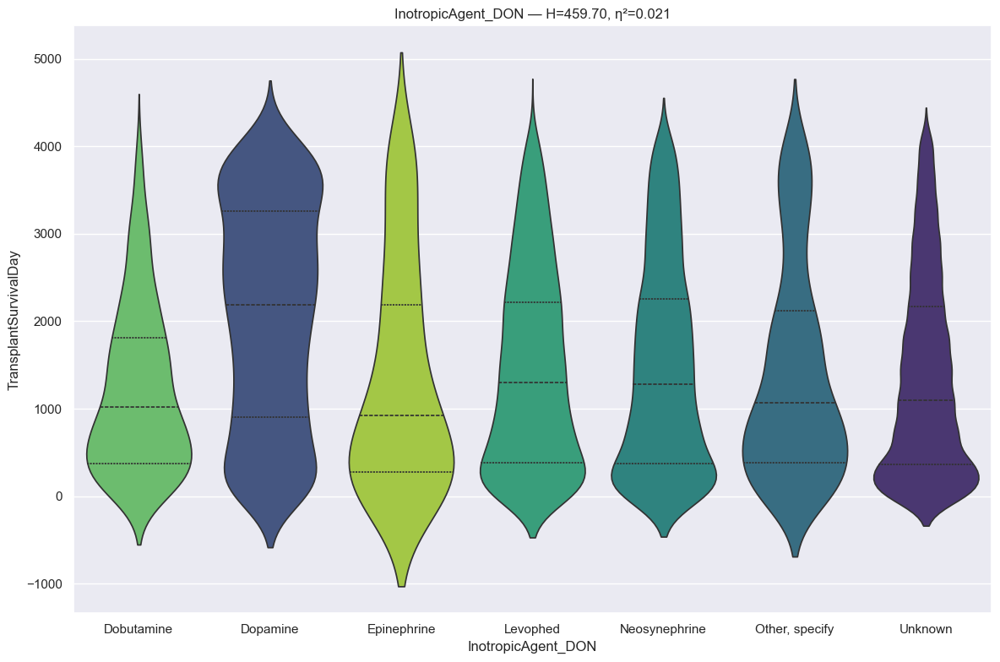

RANKING REPORT: InotropicAgent_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Dobutamine                                        :    465 records
 * Dopamine                                          :   1570 records
 * Epinephrine                                       :     95 records
 * Levophed                                          :   2419 records
 * Neosynephrine                                     :   3373 records
 * Other, specify                                    :    515 records
 * Unknown                                           :  12929 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 459.7030 | P-value: 4.003089e-96 | Effect η²: 0.0212
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Dopamine     vs Unknown      | p=6.2587e-97 | thr=0.0024 | r=-0.322 | *Sig*
Dopamine     vs Neosyne

In [242]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [243]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropicAgent_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Dobutamine                                        :    465 records
 * Dopamine                                          :   1570 records
 * Epinephrine                                       :     95 records
 * Levophed                                          :   2419 records
 * Neosynephrine                                     :   3373 records
 * Other, specify                                    :    515 records
 * Unknown                                           :  12929 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 459.7030 | P-value: 4.003089e-96 | Effect η²: 0.0212
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::

In [244]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropicAgent_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Dobutamine                                        :    465 records
 * Dopamine                                          :   1570 records
 * Epinephrine                                       :     95 records
 * Levophed                                          :   2419 records
 * Neosynephrine                                     :   3373 records
 * Other, specify                                    :    515 records
 * Unknown                                           :  12929 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 459.7030 | P-value: 4.003089e-96 | Effect η²: 0.0212
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:

In [245]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Kidney Allocation

In [246]:
# info
feature = u.get_feature_info(df, 'KidneyAllocation', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique top   freq
KidneyAllocation_DON  21366      3  No  20906

:::: NaN Count:
KidneyAllocation_DON    0 



{'KidneyAllocation_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

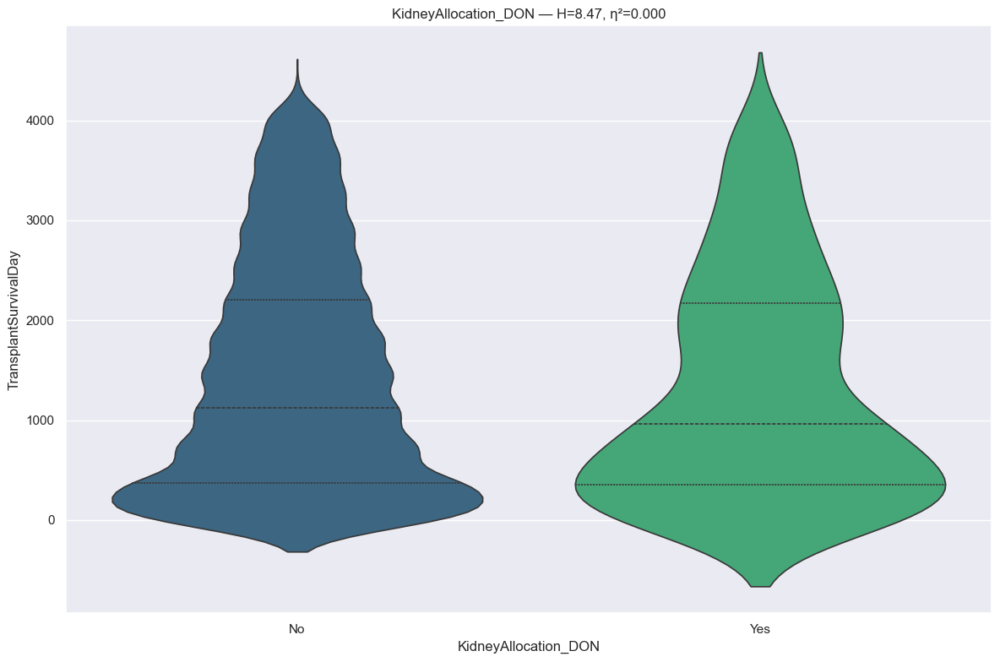

RANKING REPORT: KidneyAllocation_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  20906 records
 * Yes                                               :    458 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      2 records
--------------------------------------------------------------------------------
Kruskal H: 8.4710 | P-value: 3.608558e-03 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.6086e-03 | thr=0.0500 | r=-0.079 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

KidneyAllocation_DON  mean_survival_days  median

In [247]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [248]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropic Medication Procurement

In [249]:
# info
feature = u.get_feature_info(df, 'InotropicMedicationProcurement', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                    count unique top   freq
InotropicMedicationProcurement_DON  21366      3  No  12856

:::: NaN Count:
InotropicMedicationProcurement_DON    0 



{'InotropicMedicationProcurement_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

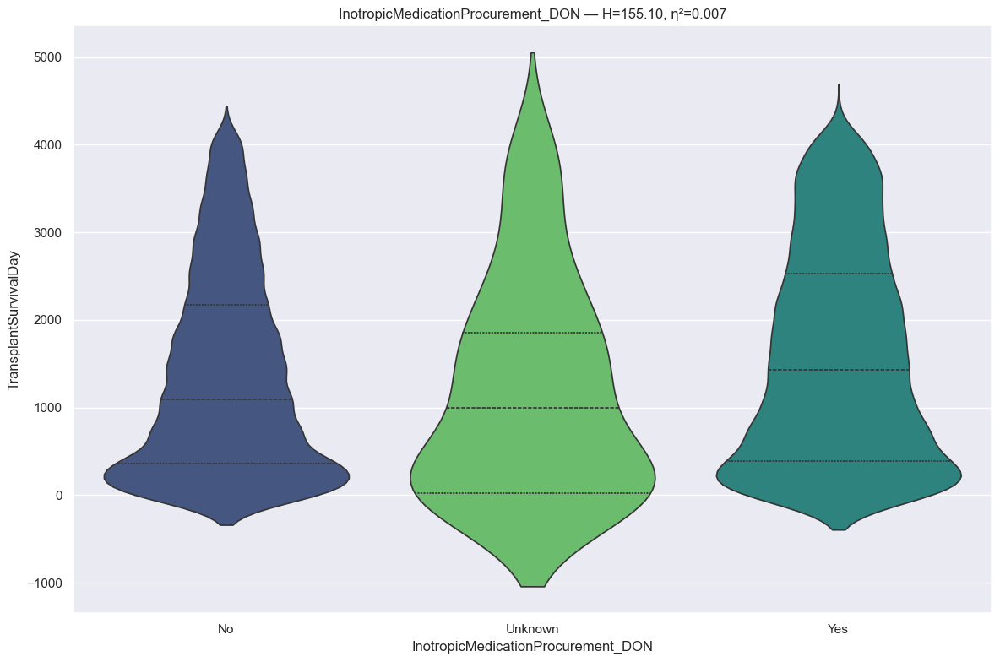

RANKING REPORT: InotropicMedicationProcurement_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  12856 records
 * Unknown                                           :     73 records
 * Yes                                               :   8437 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 155.0966 | P-value: 2.095095e-34 | Effect η²: 0.0072
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.2339e-34 | thr=0.0167 | r= 0.099 | *Sig*
Unknown      vs Yes          | p=1.1351e-03 | thr=0.0167 | r= 0.221 | *Sig*
No           vs Unknown      | p=3.6607e-02 | thr=0.0167 | r=-0.142 | Not Sig
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::

In [250]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [251]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transfusion Number

In [252]:
# info
feature = u.get_feature_info(df, 'TransfusionNumber', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique   top   freq
TransfusionNumber_DON  21366      5  NONE  10365

:::: NaN Count:
TransfusionNumber_DON    0 



{'TransfusionNumber_DON': CategoricalDtype(categories=['1 - 5', '6 - 10', 'GREATER THAN 10', 'NONE', 'Unknown'], ordered=False, categories_dtype=str)}

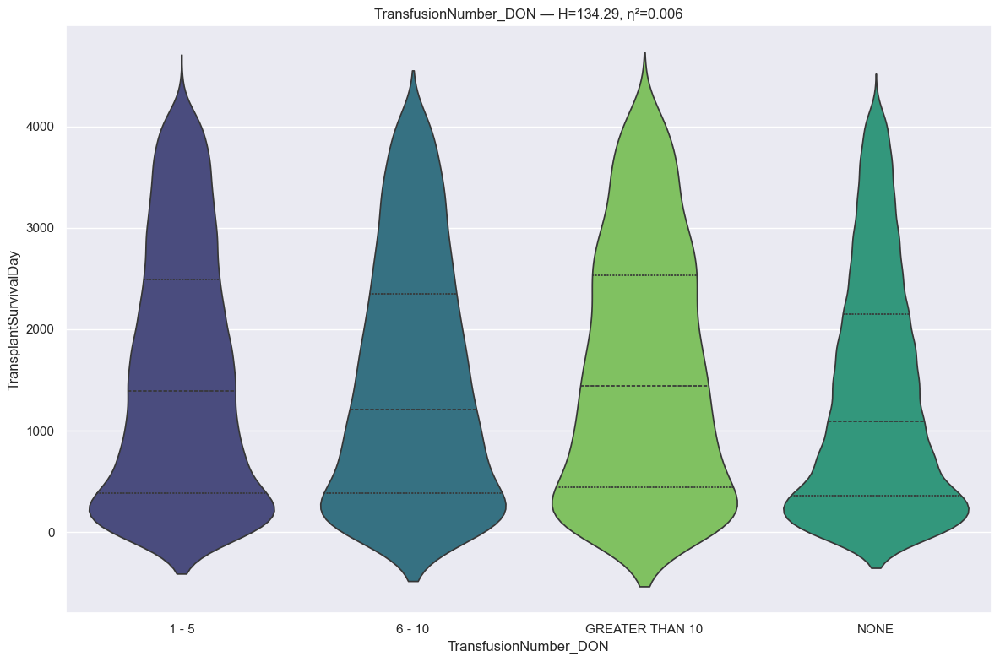

RANKING REPORT: TransfusionNumber_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1 - 5                                             :   6698 records
 * 6 - 10                                            :   2579 records
 * GREATER THAN 10                                   :   1702 records
 * NONE                                              :  10365 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     22 records
--------------------------------------------------------------------------------
Kruskal H: 134.2938 | P-value: 6.421477e-29 | Effect η²: 0.0062
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
1 - 5        vs NONE         | p=1.8065e-23 | thr=0.0083 | r=-0.090 | *Sig*
GREATER THAN 10 vs NONE         | p=8.1577e-14 | thr=0.0083 | r=-0.113 | *Sig*
6 - 10       vs NONE         | p=5.2146e-09 | thr=0.0083 | r=-0.074 | *Sig

In [253]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [254]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: TransfusionNumber_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1 - 5                                             :   6698 records
 * 6 - 10                                            :   2579 records
 * GREATER THAN 10                                   :   1702 records
 * NONE                                              :  10365 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     22 records
--------------------------------------------------------------------------------
Kruskal H: 134.2938 | P-value: 6.421477e-29 | Effect η²: 0.0062
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - 1 - 5
  - 6 - 10
  -

In [255]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: TransfusionNumber_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * 1 - 5                                             :   6698 records
 * 6 - 10                                            :   2579 records
 * GREATER THAN 10                                   :   1702 records
 * NONE                                              :  10365 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     22 records
--------------------------------------------------------------------------------
Kruskal H: 134.2938 | P-value: 6.421477e-29 | Effect η²: 0.0062
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - 1 - 5
  - 6 - 10
 

In [256]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### LungPO2 Done

In [257]:
# info
feature = u.get_feature_info(df, 'LungPO2_Done_DON', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique      top   freq
LungPO2_Done_DON  21366      3  Unknown  13890

:::: NaN Count:
LungPO2_Done_DON    0 



{'LungPO2_Done_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

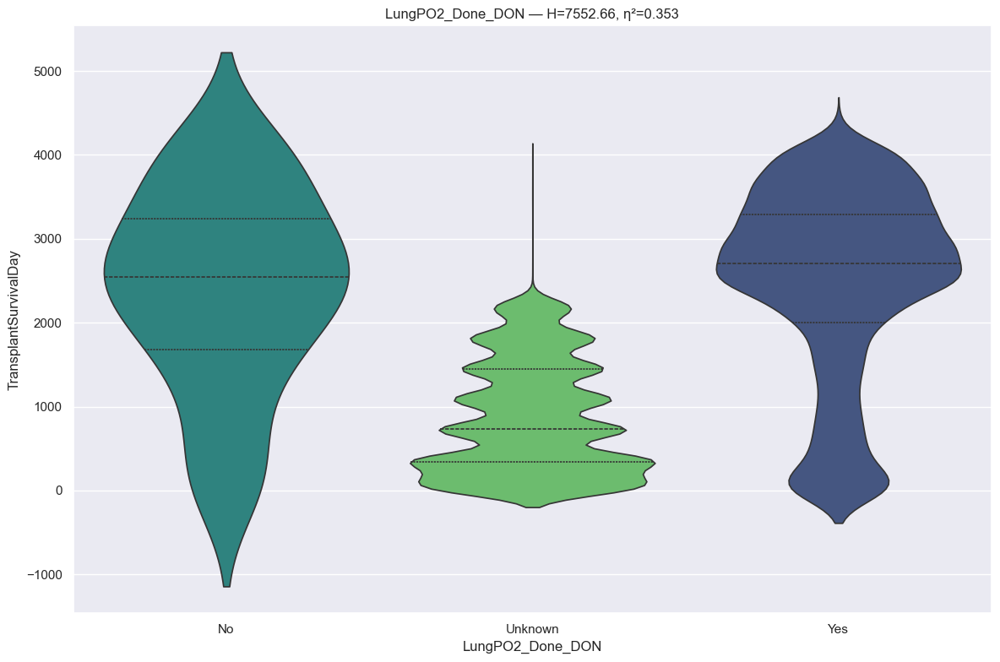

RANKING REPORT: LungPO2_Done_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :     34 records
 * Unknown                                           :  13890 records
 * Yes                                               :   7442 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7552.6562 | P-value: 0.000000e+00 | Effect η²: 0.3534
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=0.0000e+00 | thr=0.0167 | r= 0.720 | *Sig*
No           vs Unknown      | p=1.6831e-12 | thr=0.0167 | r=-0.700 | *Sig*
No           vs Yes          | p=5.5718e-01 | thr=0.0167 | r= 0.058 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [258]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [259]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Pulmonary Catheter

In [260]:
# info
feature = u.get_feature_info(df, 'PulmonaryCatheter', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top   freq
PulmonaryCatheter_DON  21366      3  No  19854

:::: NaN Count:
PulmonaryCatheter_DON    0 



{'PulmonaryCatheter_DON': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

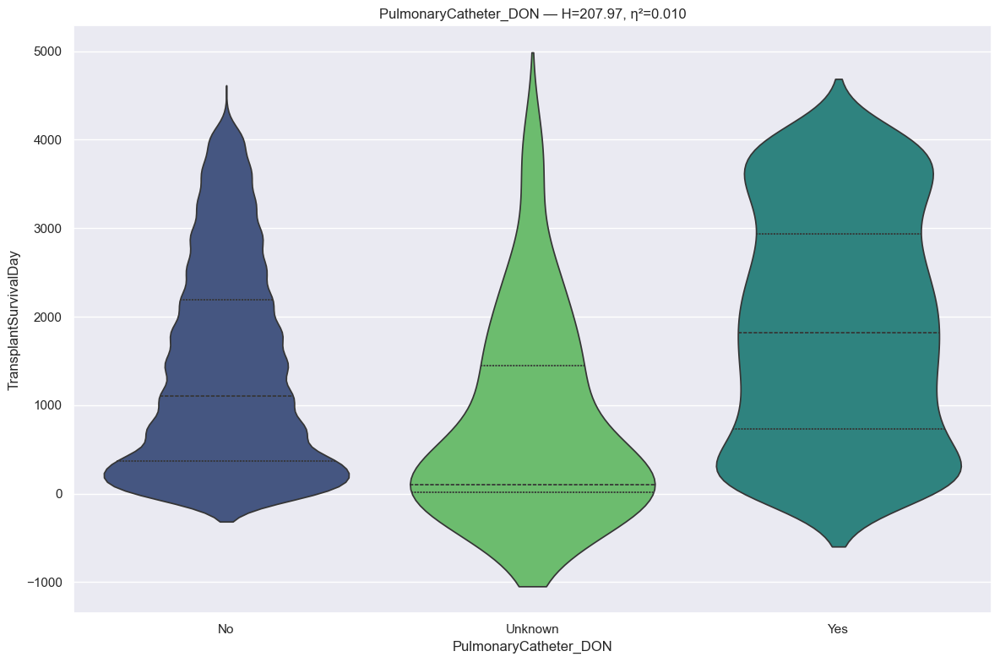

RANKING REPORT: PulmonaryCatheter_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :  19854 records
 * Unknown                                           :     39 records
 * Yes                                               :   1473 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 207.9736 | P-value: 6.904023e-46 | Effect η²: 0.0096
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.6757e-43 | thr=0.0167 | r= 0.214 | *Sig*
Unknown      vs Yes          | p=1.9747e-08 | thr=0.0167 | r= 0.526 | *Sig*
No           vs Unknown      | p=2.0339e-05 | thr=0.0167 | r=-0.394 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [261]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [262]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Bronchoscopy Left

In [263]:
# info
feature = u.get_feature_info(df, 'BronchoscopyLeft', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                      count unique     top   freq
BronchoscopyLeft_DON  21366      9  Unknwn  10785

:::: NaN Count:
BronchoscopyLeft_DON    0 



{'BronchoscopyLeft_DON': CategoricalDtype(categories=['Abnormal-anatomy/other lesion',
                   'Abnormal-aspiration of foreign body', 'Abnormal-blood',
                   'Abnormal-purulent secretions', 'No Bronchoscopy', 'Normal',
                   'Unknown', 'Unknown if bronchoscopy performed', 'Unknwn'],
 , ordered=False, categories_dtype=str)}

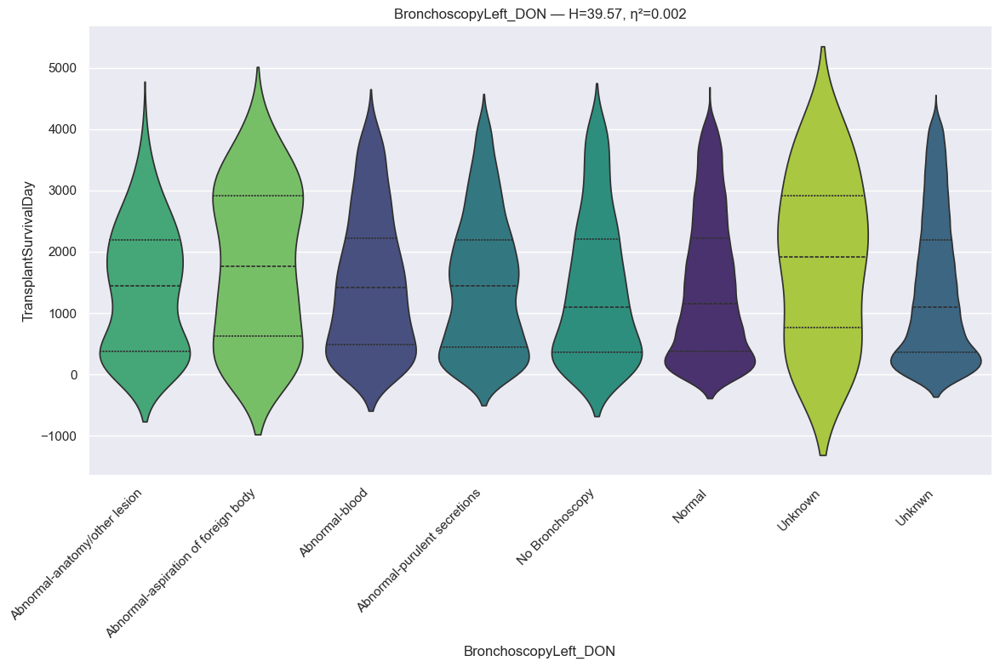

RANKING REPORT: BronchoscopyLeft_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-anatomy/other lesion                     :    129 records
 * Abnormal-aspiration of foreign body               :    102 records
 * Abnormal-blood                                    :    768 records
 * Abnormal-purulent secretions                      :   1552 records
 * No Bronchoscopy                                   :    483 records
 * Normal                                            :   7503 records
 * Unknown                                           :     34 records
 * Unknwn                                            :  10785 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown if bronchoscopy performed                 :     10 records
--------------------------------------------------------------------------------
Kruskal H: 39.5664 | P-value: 1.523630e-06 | Effect η²: 0.0015
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0018 | r_threshold: 0.10)
--------------------------------

In [264]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [265]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: BronchoscopyLeft_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-anatomy/other lesion                     :    129 records
 * Abnormal-aspiration of foreign body               :    102 records
 * Abnormal-blood                                    :    768 records
 * Abnormal-purulent secretions                      :   1552 records
 * No Bronchoscopy                                   :    483 records
 * Normal                                            :   7503 records
 * Unknown                                           :     34 records
 * Unknwn                                            :  10785 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown if bronchoscopy performed                 :     10 records
--------------------------------------------------------------------------------
Kruskal H: 39.5664 | P-value: 1.523630e-06 | Effect η²: 0.0015
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
-------------------------------

In [266]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Bronchoscopy Right

In [267]:
# info
feature = u.get_feature_info(df, 'BronchoscopyRight', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique     top   freq
BronchoscopyRight_DON  21366      9  Unknwn  10991

:::: NaN Count:
BronchoscopyRight_DON    0 



{'BronchoscopyRight_DON': CategoricalDtype(categories=['Abnormal-anatomy/other lesion',
                   'Abnormal-aspiration of foreign body', 'Abnormal-blood',
                   'Abnormal-purulent secretions', 'No Bronchoscopy', 'Normal',
                   'Unknown', 'Unknown if bronchoscopy performed', 'Unknwn'],
 , ordered=False, categories_dtype=str)}

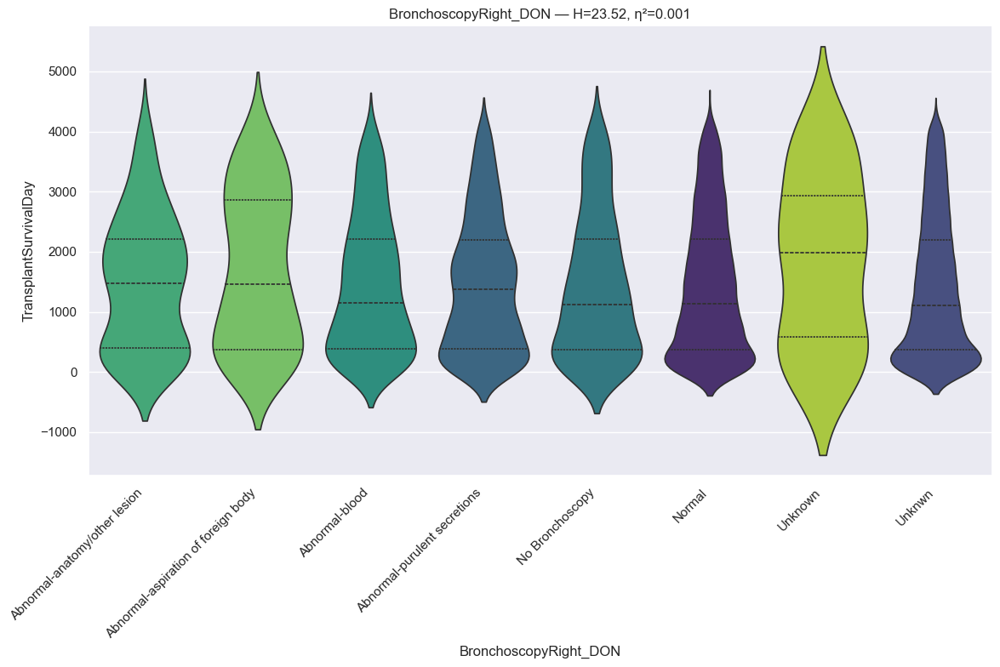

RANKING REPORT: BronchoscopyRight_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-anatomy/other lesion                     :    156 records
 * Abnormal-aspiration of foreign body               :    132 records
 * Abnormal-blood                                    :    829 records
 * Abnormal-purulent secretions                      :   1790 records
 * No Bronchoscopy                                   :    484 records
 * Normal                                            :   6941 records
 * Unknown                                           :     35 records
 * Unknwn                                            :  10991 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown if bronchoscopy performed                 :      8 records
--------------------------------------------------------------------------------
Kruskal H: 23.5160 | P-value: 1.385327e-03 | Effect η²: 0.0008
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0018 | r_threshold: 0.10)
-------------------------------

In [268]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [269]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: BronchoscopyRight_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-anatomy/other lesion                     :    156 records
 * Abnormal-aspiration of foreign body               :    132 records
 * Abnormal-blood                                    :    829 records
 * Abnormal-purulent secretions                      :   1790 records
 * No Bronchoscopy                                   :    484 records
 * Normal                                            :   6941 records
 * Unknown                                           :     35 records
 * Unknwn                                            :  10991 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown if bronchoscopy performed                 :      8 records
--------------------------------------------------------------------------------
Kruskal H: 23.5160 | P-value: 1.385327e-03 | Effect η²: 0.0008
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
------------------------------

In [270]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Chest Xray

In [271]:
# info
feature = u.get_feature_info(df, 'ChestXray', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique            top   freq
ChestXray_DON  21366      7  Abnormal-both  11074

:::: NaN Count:
ChestXray_DON    0 



{'ChestXray_DON': CategoricalDtype(categories=['Abnormal-both', 'Abnormal-left', 'Abnormal-right',
                   'No chest x-ray', 'Normal', 'Unknown',
                   'Unknown if chest x-ray performed'],
 , ordered=False, categories_dtype=str)}

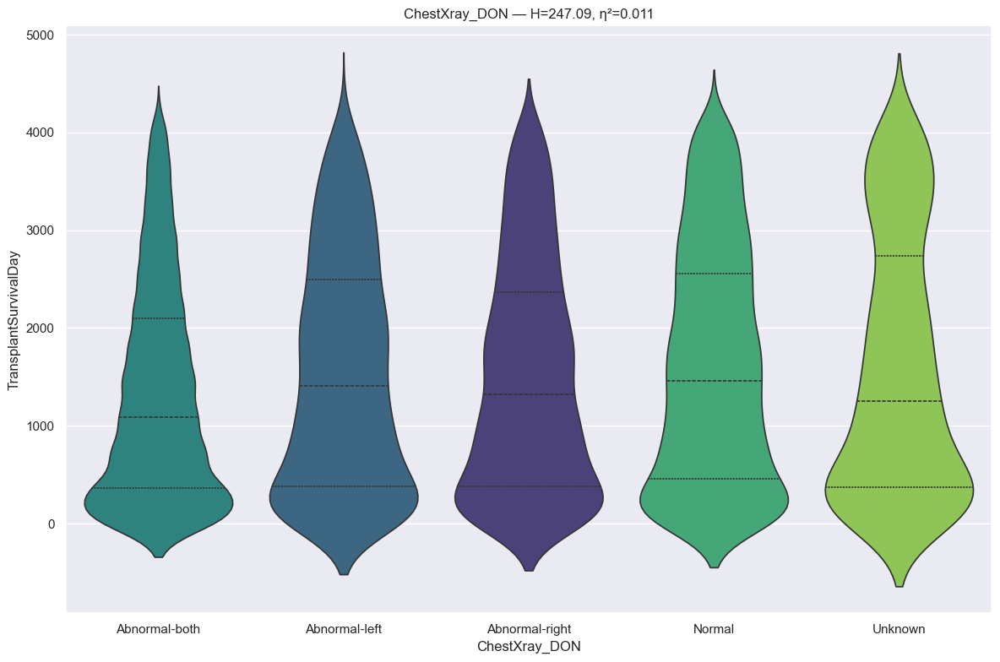

RANKING REPORT: ChestXray_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-both                                     :  11074 records
 * Abnormal-left                                     :   1857 records
 * Abnormal-right                                    :   2710 records
 * Normal                                            :   4590 records
 * Unknown                                           :   1119 records
BYPASSED CATEGORIES (n < min_n):
 * No chest x-ray                                    :     12 records
 * Unknown if chest x-ray performed                  :      4 records
--------------------------------------------------------------------------------
Kruskal H: 247.0892 | P-value: 2.757899e-52 | Effect η²: 0.0114
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Abnormal-both vs Normal       | p=1.1208e-46 | thr=0.0050 | r= 0.145 | *Sig*
Abnormal-both vs Abn

In [272]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [273]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ChestXray_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-both                                     :  11074 records
 * Abnormal-left                                     :   1857 records
 * Abnormal-right                                    :   2710 records
 * Normal                                            :   4590 records
 * Unknown                                           :   1119 records
BYPASSED CATEGORIES (n < min_n):
 * No chest x-ray                                    :     12 records
 * Unknown if chest x-ray performed                  :      4 records
--------------------------------------------------------------------------------
Kruskal H: 247.0892 | P-value: 2.757899e-52 | Effect η²: 0.0114
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
Abnormal-both vs Normal       | p=1.1208e-46 | fdr_alpha=0.05 | r= 0.145 | *Sig*
Abnormal-both vs 

In [274]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.05, "suppress_pairwise": False}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ChestXray_DON (n ≥ 30)
INCLUDED CATEGORIES:
 * Abnormal-both                                     :  11074 records
 * Abnormal-left                                     :   1857 records
 * Abnormal-right                                    :   2710 records
 * Normal                                            :   4590 records
 * Unknown                                           :   1119 records
BYPASSED CATEGORIES (n < min_n):
 * No chest x-ray                                    :     12 records
 * Unknown if chest x-ray performed                  :      4 records
--------------------------------------------------------------------------------
Kruskal H: 247.0892 | P-value: 2.757899e-52 | Effect η²: 0.0114
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.05)
--------------------------------------------------------------------------------
Abnormal-both vs Normal       | p=1.1208e-46 | thr=0.0050 | r= 0.145 | *Sig*
Abnormal-both vs Ab

In [275]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CrossMatchDone

In [276]:
# info
feature = u.get_feature_info(df, 'CrossMatchDone', cat=True)

                count unique  top   freq
CrossMatchDone  21366      3  Yes  19813

:::: NaN Count:
CrossMatchDone    0 

--- CrossMatchDone ---
dtype: category
Categories: ['No', 'Unknown', 'Yes']
Ordered: False



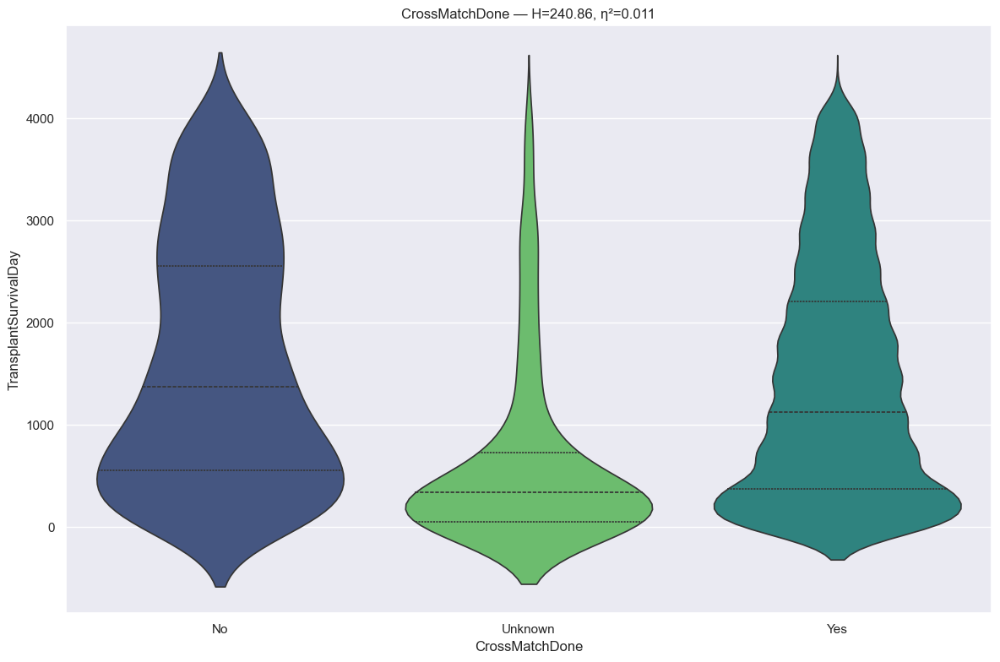

RANKING REPORT: CrossMatchDone (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1194 records
 * Unknown                                           :    359 records
 * Yes                                               :  19813 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 240.8551 | P-value: 5.000231e-53 | Effect η²: 0.0112
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.1530e-50 | thr=0.0167 | r=-0.520 | *Sig*
Unknown      vs Yes          | p=9.3965e-50 | thr=0.0167 | r= 0.456 | *Sig*
No           vs Yes          | p=3.3404e-05 | thr=0.0167 | r=-0.071 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 c

In [277]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [278]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### MismatchLevel_AMIS

In [279]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_AMIS', cat=True)

                    count unique top   freq
MismatchLevel_AMIS  21366      4   2  10214

:::: NaN Count:
MismatchLevel_AMIS    0 

--- MismatchLevel_AMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



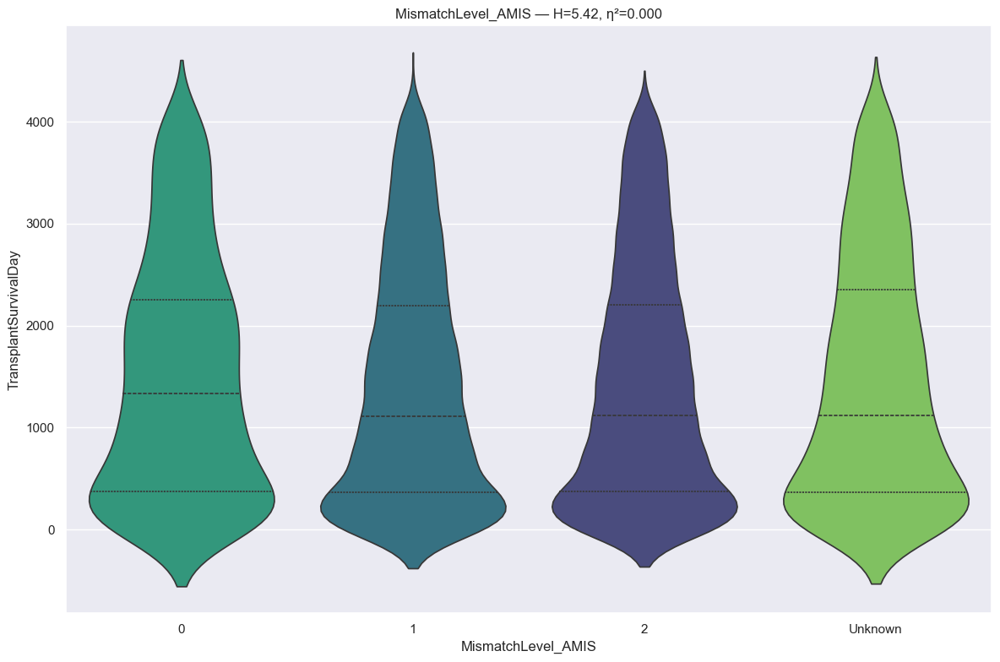

RANKING REPORT: MismatchLevel_AMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :   1333 records
 * 1                                                 :   8077 records
 * 2                                                 :  10214 records
 * Unknown                                           :   1742 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 5.4192 | P-value: 1.435547e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 1            | p=3.0417e-02 | thr=0.0083 | r=-0.037 | Not Sig
0            vs 2            | p=7.7962e-02 | thr=0.0083 | r=-0.030 | Not Sig
1            vs Unknown      | p=2.4711e-01 | thr=0.0083 | r= 0.018 | Not Sig
1            vs 2            | p=3.6619e-01 | thr=0.0083 | r= 0.008 | Not Sig

In [280]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [281]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_BMIS

In [282]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_BMIS', cat=True)

                    count unique top   freq
MismatchLevel_BMIS  21366      4   2  14176

:::: NaN Count:
MismatchLevel_BMIS    0 

--- MismatchLevel_BMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



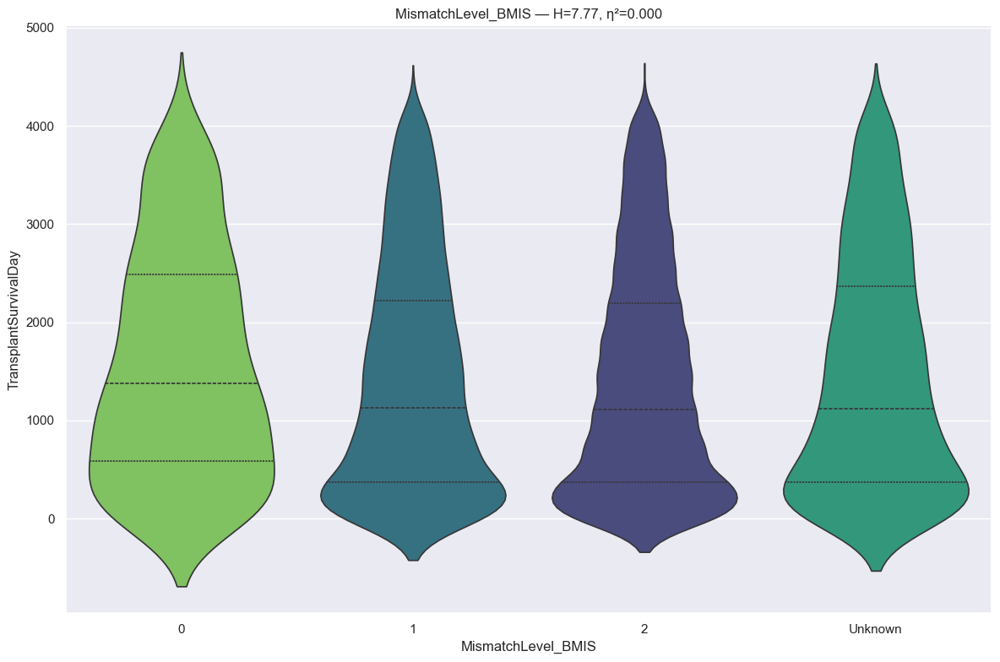

RANKING REPORT: MismatchLevel_BMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    419 records
 * 1                                                 :   5028 records
 * 2                                                 :  14176 records
 * Unknown                                           :   1743 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 7.7685 | P-value: 5.104742e-02 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 2            | p=1.3749e-02 | thr=0.0083 | r=-0.071 | Not Sig
0            vs 1            | p=4.7212e-02 | thr=0.0083 | r=-0.058 | Not Sig
0            vs Unknown      | p=9.6239e-02 | thr=0.0083 | r=-0.052 | Not Sig
1            vs 2            | p=2.2251e-01 | thr=0.0083 | r=-0.012 | Not Sig

In [283]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [284]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_DRMIS

In [285]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_DRMIS', cat=True)

                     count unique top   freq
MismatchLevel_DRMIS  21366      4   2  10779

:::: NaN Count:
MismatchLevel_DRMIS    0 

--- MismatchLevel_DRMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



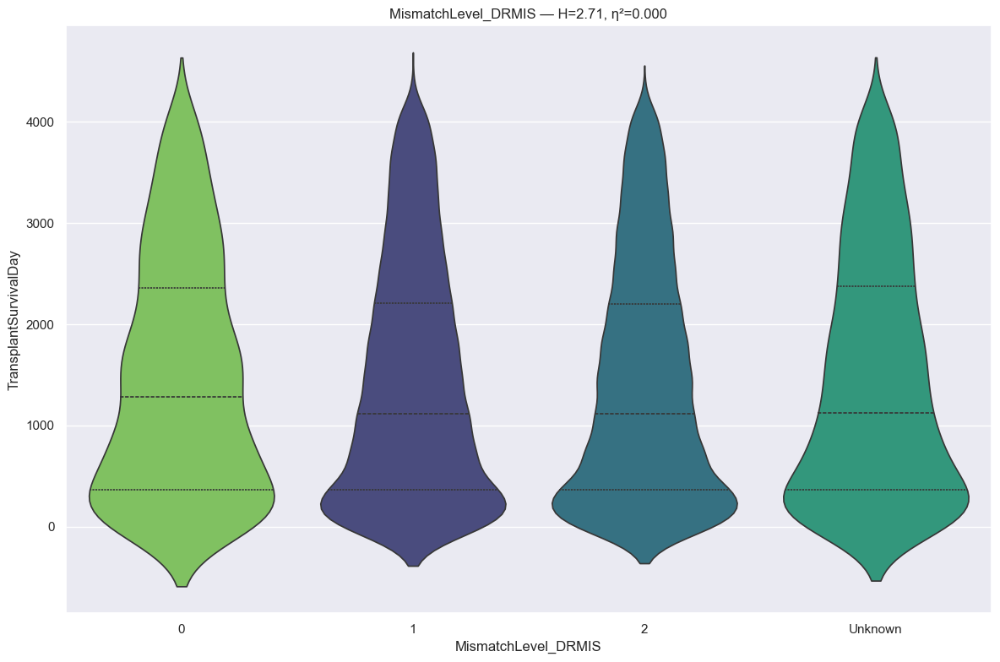

RANKING REPORT: MismatchLevel_DRMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    966 records
 * 1                                                 :   7873 records
 * 2                                                 :  10779 records
 * Unknown                                           :   1748 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.7106 | P-value: 4.384334e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
2            vs Unknown      | p=2.2662e-01 | thr=0.0083 | r= 0.018 | Not Sig
1            vs 2            | p=2.6938e-01 | thr=0.0083 | r=-0.009 | Not Sig
0            vs 2            | p=3.2181e-01 | thr=0.0083 | r=-0.019 | Not Sig
1            vs Unknown      | p=5.6754e-01 | thr=0.0083 | r= 0.009 | Not Si

In [286]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [287]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_HLAMIS

In [288]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_HLAMIS', cat=True)

                      count unique top  freq
MismatchLevel_HLAMIS  21366      8   5  7343

:::: NaN Count:
MismatchLevel_HLAMIS    0 

--- MismatchLevel_HLAMIS ---
dtype: category
Categories: ['0', '1', '2', '3', '4', '5', '6', 'Unknown']
Ordered: False



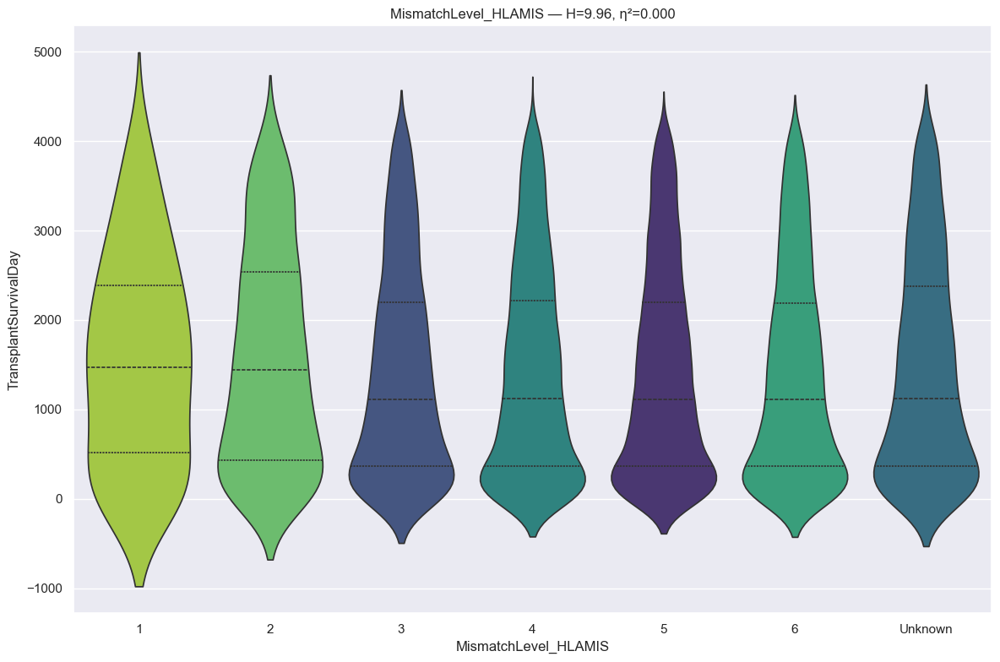

RANKING REPORT: MismatchLevel_HLAMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     72 records
 * 2                                                 :    533 records
 * 3                                                 :   2180 records
 * 4                                                 :   4947 records
 * 5                                                 :   7343 records
 * 6                                                 :   4517 records
 * Unknown                                           :   1751 records
BYPASSED CATEGORIES (n < min_n):
 * 0                                                 :     23 records
--------------------------------------------------------------------------------
Kruskal H: 9.9565 | P-value: 1.264960e-01 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
2            vs 6     

In [289]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [290]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival only for a small sample.

#### BloodGroupMatchLevel

In [291]:
# info
feature = u.get_feature_info(df, 'BloodGroupMatchLevel', cat=True)

                      count unique        top   freq
BloodGroupMatchLevel  21366      3  Identical  18337

:::: NaN Count:
BloodGroupMatchLevel    0 

--- BloodGroupMatchLevel ---
dtype: category
Categories: ['Compatible', 'Identical', 'Incompatible']
Ordered: False



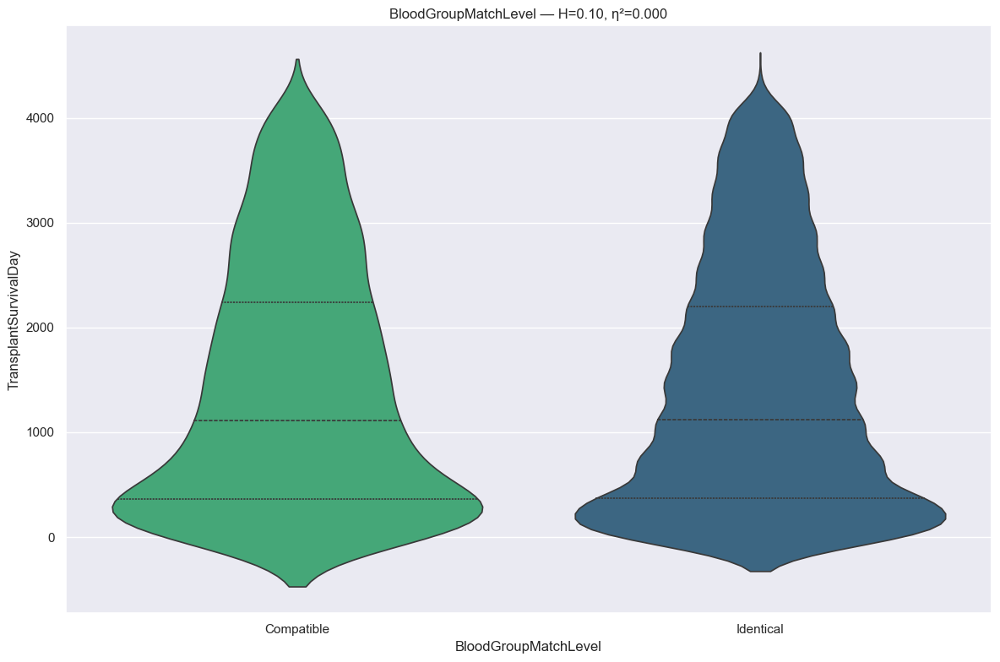

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   3028 records
 * Identical                                         :  18337 records
BYPASSED CATEGORIES (n < min_n):
 * Incompatible                                      :      1 records
--------------------------------------------------------------------------------
Kruskal H: 0.0954 | P-value: 7.573986e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Compatible   vs Identical    | p=7.5740e-01 | thr=0.0500 | r=-0.003 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

>>> Other (1 categories)
  - Incompatible

BloodGroupMatchLevel  mean_survival_days  median_surviv

In [292]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [293]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### Meds_DON

In [294]:
# info
feature = u.get_feature_info(df, 'Meds', cat=False)
# dtype
{col: df[col].dtype for col in feature}

          count unique top freq
Meds_DON  21366  17811      487

:::: NaN Count:
Meds_DON    0 



{'Meds_DON': <StringDtype(na_value=nan)>}

#### Clean Up

In [295]:
# add to remove list
remove_cols.extend(feature)

# remove unwanted columns
df = df.drop(columns=remove_cols).copy()

# removed all unused categories
for col in df.select_dtypes(include="category"):
    df[col] = df[col].cat.remove_unused_categories()

# shape
print(df.shape)

# info
df.info(max_cols=df.shape[1])

(21366, 102)
<class 'pandas.DataFrame'>
RangeIndex: 21366 entries, 0 to 21365
Data columns (total 102 columns):
 #    Column                                Non-Null Count  Dtype   
---   ------                                --------------  -----   
 0    DeceasedRetyped_DON                   21366 non-null  category
 1    AntigenDA1_DON                        21366 non-null  category
 2    AntigenDA2_DON                        21366 non-null  category
 3    AntigenDB1_DON                        21366 non-null  category
 4    AntigenDB2_DON                        21366 non-null  category
 5    AntigenDDR1_DON                       21366 non-null  category
 6    AntigenDDR2_DON                       21366 non-null  category
 7    Citizenship_DON                       21366 non-null  category
 8    PastCocaineUse_DON                    21366 non-null  category
 9    Age_DON                               21366 non-null  int64   
 10   Hepatitis_B_CoreAntibody_DON          21366 non-null  

#### Write to Disk

In [296]:
# save data: heart dataset
u.write_to_file(df, 'Male_DON_Heart_PreML',path='../Data/', format='parquet')
u.write_to_file(mapping_df, 'Male_DON_Heart_Mapping',path='../Data/', format='parquet')

21,366 records written to ../Data/Male_DON_Heart_PreML.parquet
70 records written to ../Data/Male_DON_Heart_Mapping.parquet
